## Вводные

In [1]:
from Bio.Seq import MutableSeq #or import Bio.Seq, но тогда вводить Bio.Seq.Seq("")
from Bio.Seq import Seq
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pandas as pd
from Bio.Data.CodonTable import unambiguous_dna_by_id
from Bio.SeqUtils import seq3
import seaborn as sns
import os
import random
from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import mannwhitneyu as MW
from scipy.spatial import distance
from tqdm.notebook import tqdm

from Bio.Data.CodonTable import unambiguous_dna_by_id
table = 2

aa_dict = {}
for c in unambiguous_dna_by_id[table].forward_table:
    if unambiguous_dna_by_id[table].forward_table[c] not in aa_dict:
        aa_dict[unambiguous_dna_by_id[table].forward_table[c]] = []
    aa_dict[unambiguous_dna_by_id[table].forward_table[c]].append(c)
aa_dict['_'] = unambiguous_dna_by_id[table].stop_codons

class_list = ['Actinopterygii', 'Amphibia', 'Reptilia', 'Aves', 'Mammalia']

set_set = set()
for i in class_list:
    for j in class_list:
        if i != j:
            set_set.add(frozenset([i, j]))


# result_folder = 'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(sel)'
sim_AllGenes_Shift = os.listdir('C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(sel)')

err_list = ['Acheilognathus_macropterus', 'Acheilognathus_yamatsutae', 'Acipenser_gueldenstaedtii', 'Ara_militaris', 'Brotogeris_cyanoptera', 'Capra_sibirica', 'Cardinalis_cardinalis', 'Chlorocebus_aethiops', 'Chlorocebus_sabaeus', 'Cobitis_sinensis', 'Conolophus_subcristatus', 'Crocidura_russula', 'Crocodylus_moreletii', 'Dasyurus_hallucatus', 'Desmognathus_fuscus', 'Eulemur_rubriventer', 'Eurystomus_orientalis', 'Falco_sparverius', 'Fringilla_coelebs', 'Gyrinophilus_porphyriticus', 'Oncorhynchus_keta', 'Scombrops_gilberti']
species_list = sorted(list(set(sim_AllGenes_Shift)-set(err_list)))

cs_all = pd.read_csv('C:\Work\Lab\\Practice\\CrossSpeciesAll.csv', sep='\t').copy()

ms = pd.read_csv(r'C:\Work\Lab\pr-29-trna-or-mutagenesis\raw\VertebratePolymorphisms.MutSpecData.OnlyFourFoldDegAllGenes.csv', sep=' ').copy()

ms_species_list = ms[ms.Species.isin(species_list)]
zero_n = {}
for zero_number in range(13):
    df_zero = (ms_species_list.loc[:,'A_T':'C_G'] == 0).sum(axis=1)
    species_list_zero = ms_species_list[df_zero==zero_number].Species.to_list()
    if zero_number > 0:
        zero_n[zero_number] = zero_n[zero_number-1] + species_list_zero 
    else:
        zero_n[zero_number] = species_list_zero

c:\Soft\Python\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Диаграмма рассеяния

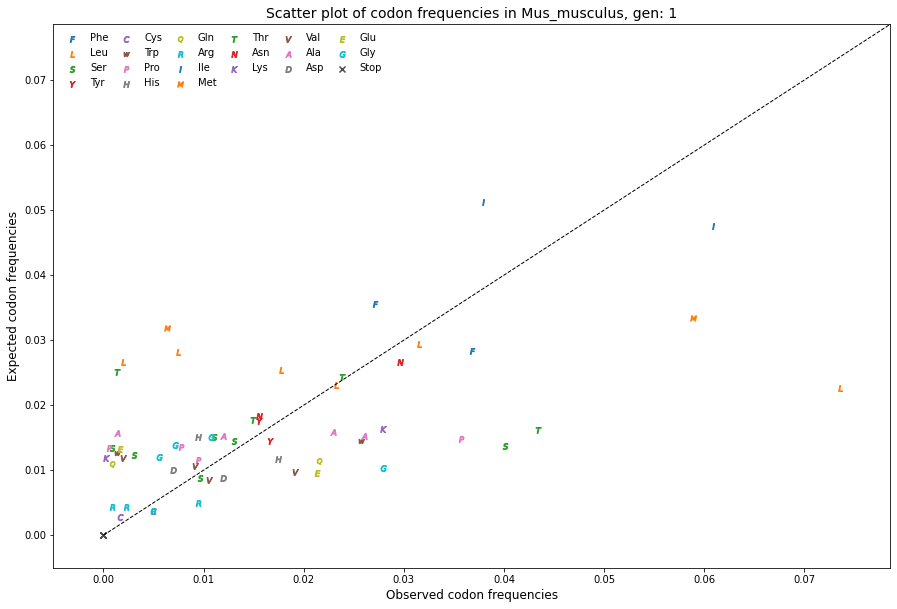

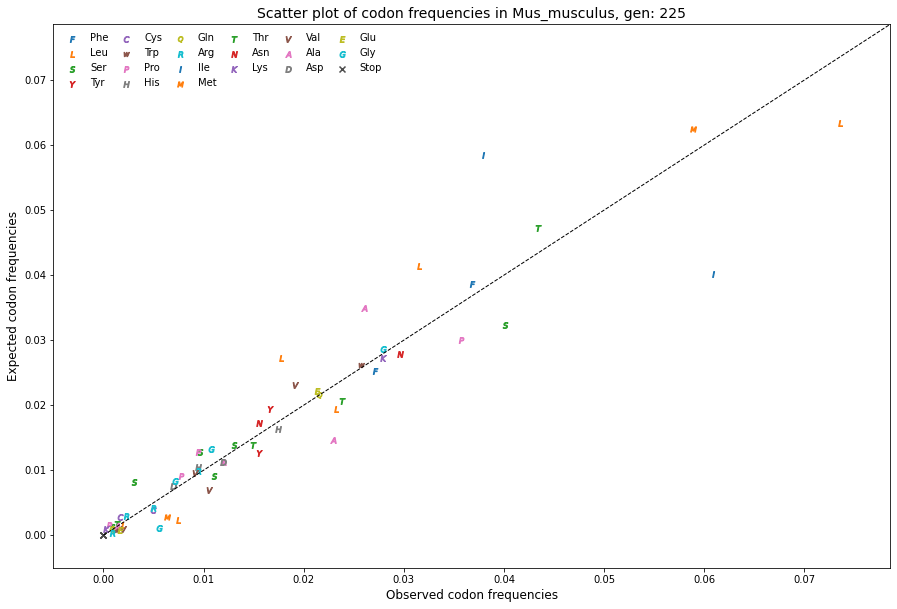

In [77]:
result_folder = 'C:\Work\Lab\Practice\\Results_AllGenes_shift'
species_list = ['Mus_musculus'] 

for species in species_list:
    
    # os.makedirs('C:\Work\Lab\Course work pictures\\{}_lr\\Letter_scatter\\'.format(species), exist_ok=True)

    data = pd.read_csv(f'{result_folder}\\{species}\FrequenciesMean.csv', sep='\t').copy()
    # [gen+1 for gen in range(0, 225, 10)] + [2, 3, 4, 5, 6, 7, 8, 9, 12, 14, 16, 18, 20, 24, 28, 32, 36]
    for gen in [1, 225]:
        plt.figure(figsize=(15, 10), facecolor='white') #, dpi=600
        for aa in aa_dict:
            obs = []
            sim = []
            for codon in aa_dict[aa]:
                obs.append(data[codon].loc[0])
                sim.append(data[codon].loc[gen])
            if aa == '_':
                plt.scatter(obs, sim, label='Stop', marker='x', c='0.3')
            else:
                plt.scatter(obs, sim, label=seq3(aa), marker=f'${aa}$')  # , c='0.5'
            plt.legend(columnspacing=0.75 ,ncol=6, loc='upper left', frameon=False, fontsize=10)
        plt.plot([0, 0.1], [0, 0.1], '--k', lw=1)
        plt.ylim(-0.005, data.values.max()+0.005)
        plt.xlim(-0.005, data.loc[0].max()+0.005)
        plt.xlabel('Observed codon frequencies', fontsize=12)      # Observed frequency
        plt.ylabel('Expected codon frequencies', fontsize=12)    # Simulated frequency
        plt.title(f'Scatter plot of codon frequencies in {species}, gen: {gen}', fontsize=14)
        # plt.savefig('C:\Work\Lab\Course work pictures\\{}_lr\\Letter_scatter\\{}'.format(species, gen), bbox_inches='tight')
        plt.show()

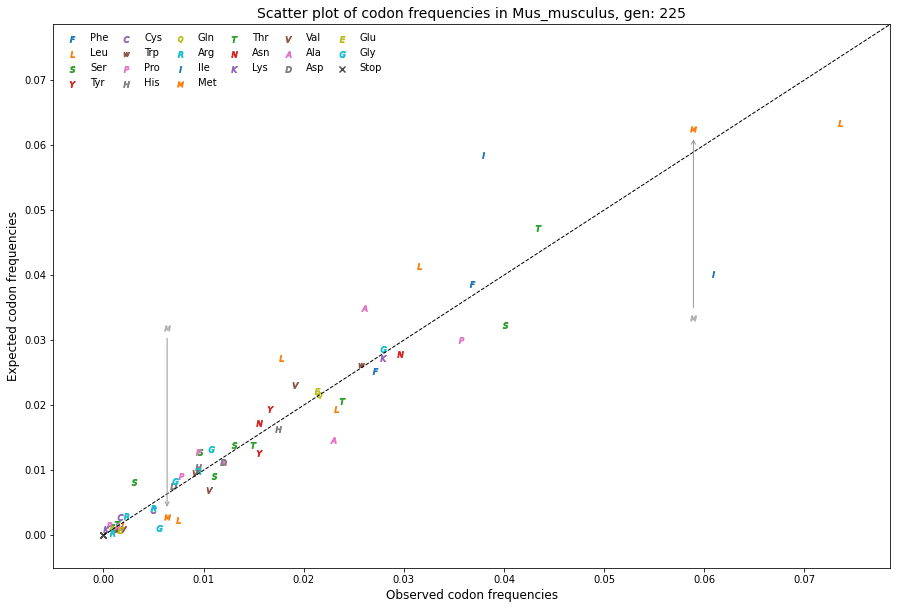

In [76]:
# species = 'Mus_musculus'
# data = pd.read_csv('Practice\\Results_AllGenes_shift\\{}\FrequenciesMean.csv'.format(species), sep='\t').copy()
gen = 225

plt.figure(figsize=(15, 10), facecolor='white') #, dpi=600 'M': ['ATA', 'ATG'],
                             #          'T': ['ACT', 'ACC', 'ACA', 'ACG'],
    
HT1 = 'ATA'
HT2 = 'ATG'
# start = 0

for aa in aa_dict:
    obs = []
    sim = []
    for codon in aa_dict[aa]:
        obs.append(data[codon].loc[0])
        sim.append(data[codon].loc[gen])
    if aa == '_':
        plt.scatter(obs,sim, label='Stop', marker='x', c='0.3')
    else:
        plt.scatter(obs,sim, label=seq3(aa), marker=f'${aa}$' ) # c='0.5'
    plt.legend(columnspacing=0.75 ,ncol=6, loc='upper left', frameon=False)
plt.plot([0, 0.1], [0, 0.1], '--k', lw=1)
plt.ylim(-0.005, data.values.max()+0.005)
plt.xlim(-0.005, data.loc[0].max()+0.005)
plt.xlabel('Observed codon frequencies', fontsize=12)    # Observed frequency
plt.ylabel('Expected codon frequencies', fontsize=12) # Simulated frequency
plt.title(f'Scatter plot of codon frequencies in {species}, gen: {gen}', fontsize=14)

plt.scatter(data[HT1].loc[0], data[HT1].loc[1], marker='${}$'.format('M'), c='0.7')
plt.annotate("",
            xy=(data[HT1].loc[0], data[HT1].loc[gen]), xycoords='data',
            xytext=(data[HT1].loc[0], data[HT1].loc[1]), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3", color="0.6",
                            shrinkA=10, shrinkB=10))

plt.scatter(data[HT2].loc[0], data[HT2].loc[1], marker='${}$'.format('M'), c='0.7')
plt.annotate("",
            xy=(data[HT2].loc[0], data[HT2].loc[gen]), xycoords='data',
            xytext=(data[HT2].loc[0], data[HT2].loc[1]), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3", color="0.6",
                            shrinkA=10, shrinkB=10))

# plt.savefig('C:\Work\Lab\Course work pictures\\{}_lr\\Letter_scatter\\{}'.format(species, gen), bbox_inches='tight')
plt.show()

In [19]:
import imageio as iio
species_list = ['Mus_musculus']
for species in species_list:
    images = []
    filenames = sorted(os.listdir('Course work pictures\\{}\\Letter_scatter'.format(species)), 
                       key=lambda x: int(x[:-4])) # сортировка по имении без расширения
    for i in range(len(filenames)): # приписываем полный путь
        filenames[i] = 'Course work pictures\\{}\\Letter_scatter\\{}'.format(species, filenames[i])

    for filename in filenames:
        images.append(iio.imread(filename))
    iio.mimsave('Course work pictures\\{}\\Letter_scatter\\gif.gif'.format(species), images, duration=0.3)

In [25]:
from PIL import Image
gif = []
images = [Image.open(i) for i in filenames]#images, just convert it into PIL.Image obj
for image in images:
    gif.append(image.convert("P",palette=Image.ADAPTIVE))
gif[0].save('Course work pictures\\{}\\Letter_scatter\\PIL.gif'.format(species), save_all=True, optimize=False, append_images=gif[1:], loop=0)

# Насыщение

In [93]:
df

,AAA,AAC,AAG,AAT,ACA,ACC,ACG,ACT,AGA,AGC,...,TCG,TCT,TGA,TGC,TGG,TGT,TTA,TTC,TTG,TTT
1,0.016279,0.026680,0.011936,0.018409,0.016210,0.024398,0.025173,0.017759,0.0,0.008769,...,0.013375,0.015173,0.014426,0.003790,0.012683,0.002849,0.029447,0.028326,0.026680,0.035574
2,0.016943,0.026874,0.011272,0.018216,0.017898,0.024385,0.023555,0.017704,0.0,0.008963,...,0.012503,0.015159,0.015394,0.003748,0.011715,0.002891,0.030664,0.028506,0.024869,0.035394
3,0.017732,0.026708,0.010484,0.018382,0.019557,0.024288,0.021895,0.017801,0.0,0.009073,...,0.011563,0.015007,0.015947,0.003707,0.011162,0.002932,0.032047,0.028686,0.023333,0.035214
4,0.018451,0.026680,0.009765,0.018409,0.021134,0.024385,0.020332,0.017690,0.0,0.009295,...,0.010816,0.014786,0.016556,0.003707,0.010553,0.002932,0.033472,0.028880,0.021438,0.035021
5,0.019004,0.026846,0.009212,0.018243,0.022849,0.024260,0.018562,0.017870,0.0,0.009474,...,0.009903,0.014633,0.017137,0.003748,0.009972,0.002891,0.034661,0.029212,0.019820,0.034689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221,0.027206,0.027552,0.001010,0.017538,0.047400,0.020678,0.001770,0.013693,0.0,0.012808,...,0.001231,0.009391,0.026307,0.003859,0.000802,0.002780,0.041632,0.038562,0.001563,0.025339
222,0.027192,0.027676,0.001024,0.017414,0.047441,0.020844,0.001646,0.013610,0.0,0.012739,...,0.001148,0.009461,0.026293,0.003831,0.000816,0.002808,0.041480,0.038548,0.001480,0.025353
223,0.027220,0.027759,0.000996,0.017331,0.047427,0.020733,0.001674,0.013707,0.0,0.012794,...,0.001148,0.009447,0.026307,0.003845,0.000802,0.002794,0.041397,0.038672,0.001549,0.025228
224,0.027206,0.027690,0.001010,0.017400,0.047372,0.020678,0.001715,0.013776,0.0,0.012503,...,0.001314,0.009170,0.026266,0.003845,0.000844,0.002794,0.041272,0.038769,0.001687,0.025131


In [102]:
aa_dict

{'F': ['TTT', 'TTC'],
 'L': ['TTA', 'TTG', 'CTT', 'CTC', 'CTA', 'CTG'],
 'S': ['TCT', 'TCC', 'TCA', 'TCG', 'AGT', 'AGC'],
 'Y': ['TAT', 'TAC'],
 'C': ['TGT', 'TGC'],
 'W': ['TGA', 'TGG'],
 'P': ['CCT', 'CCC', 'CCA', 'CCG'],
 'H': ['CAT', 'CAC'],
 'Q': ['CAA', 'CAG'],
 'R': ['CGT', 'CGC', 'CGA', 'CGG'],
 'I': ['ATT', 'ATC'],
 'M': ['ATA', 'ATG'],
 'T': ['ACT', 'ACC', 'ACA', 'ACG'],
 'N': ['AAT', 'AAC'],
 'K': ['AAA', 'AAG'],
 'V': ['GTT', 'GTC', 'GTA', 'GTG'],
 'A': ['GCT', 'GCC', 'GCA', 'GCG'],
 'D': ['GAT', 'GAC'],
 'E': ['GAA', 'GAG'],
 'G': ['GGT', 'GGC', 'GGA', 'GGG'],
 '_': ['TAA', 'TAG', 'AGA', 'AGG']}

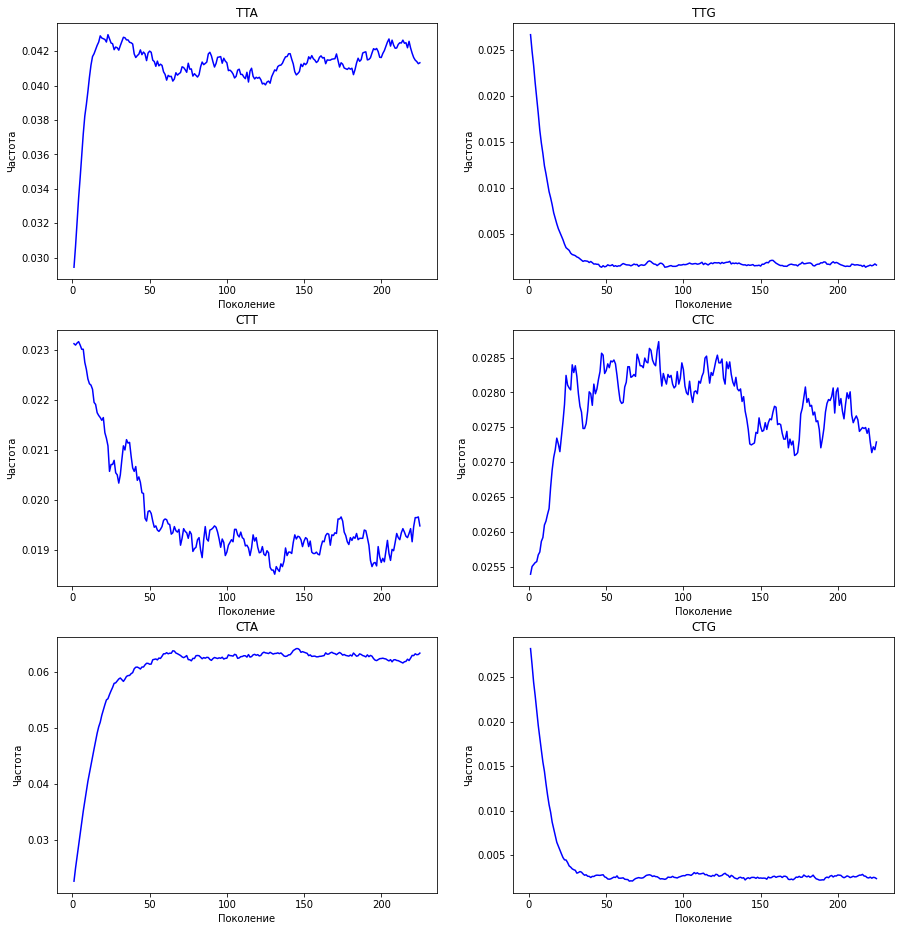

In [118]:
species_list = ['Mus_musculus']
for species in species_list:
    df = pd.read_csv(f'{result_folder}\\{species}\FrequenciesMean.csv', sep='\t').copy()
    df = df.drop(0)
    os.makedirs(f"{result_folder}_graphs\\{species}\\Codons saturation\\", exist_ok=True)
    
    fig, ax = plt.subplots(3,2, figsize=(15,16), facecolor='white')
    ax = ax.ravel()

    for i, column in enumerate(aa_dict['L']):
        ax[i].plot(df[column], color = 'blue')
        ax[i].set_title(f'{column}')
        ax[i].set_xlabel('Поколение')
        ax[i].set_ylabel('Частота')
        # plt.savefig('Practice\\Results_NewGen\\{}\Codons saturation\{}.png'.format(species, column))

    # plt.title(f'{species}')    
    plt.show()


# Дельта Ро 20 образцов и их средняя

In [3]:
def delta_rho_mean_calculation(result_folder: str, true_mean=False):
    """ 
    Calculate the dict of delta Rho mean values for all species within the path 'result_folder'
    """
    delta_rho_mean = {}
    species_list = next(os.walk(f'{result_folder}'))[1] 
    for species in species_list:
        if true_mean != True:
            samples_number = len(next(os.walk(f'{result_folder}\{species}'))[1])
            delta_rho_mean[species] = np.zeros(225)  #, dtype='float64'
            for sample in range(samples_number):
                spearman_df = pd.read_csv(f'{result_folder}\{species}\{sample}\Spearman.csv', sep='\t').copy()
                delta_rho_mean[species] += spearman_df.spearman.to_numpy() - spearman_df.spearman[0]
            delta_rho_mean[species] /= samples_number
        else:
            spearman_df = pd.read_csv(f'{result_folder}\{species}\SpearmanMean.csv', sep='\t').copy()
            delta_rho_mean[species] = spearman_df.spearman.to_numpy() - spearman_df.spearman[0]
    return delta_rho_mean

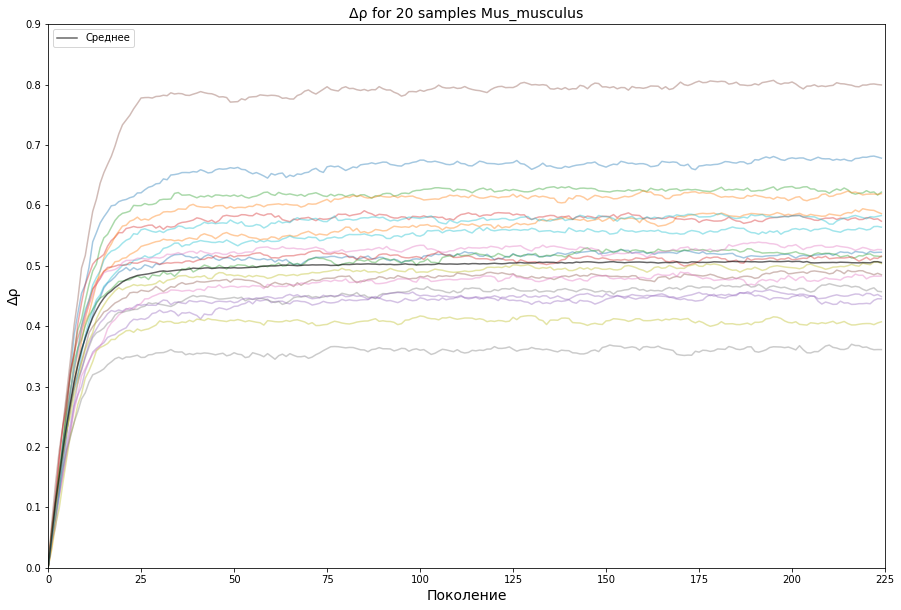

In [101]:
for species in ['Mus_musculus']:
    delta_rho_sp = {}
    plt.figure(figsize=(15, 10), facecolor='white')
    for sample in range(20):
        spearman_df = pd.read_csv(f'{result_folder}\{species}\{sample}\Spearman.csv', sep='\t').copy()
        delta_rho_sp[sample] = spearman_df.spearman - spearman_df.spearman[0]
        plt.plot(delta_rho_sp[sample], alpha=0.4)

    # plt.plot(deltaRho_Shift_true_mean[species], alpha=0.6, color='black', linestyle='dashed', label = 'Random odds mean') # По FrequanciesMean
    plt.plot(delta_rho_mean[species], alpha=0.6, color='black', label = 'Среднее')  # По среднему от 20 образцов

    plt.xlim(0, 225)
    plt.ylim(0, 0.9)
    plt.xlabel('Поколение', fontsize=14)
    plt.ylabel('Δρ', fontsize=14)
    plt.title(f'Δρ for 20 samples {species}', fontsize=14)
    plt.legend(loc='upper left')
    # os.makedirs('Course work pictures\\Results_graphs\\deltaRho Shift Mean', exist_ok=True)
    # plt.savefig('Course work pictures\\Results_graphs\\deltaRho Shift Mean\\{}.png'.format(species))
    plt.show()
    # plt.close()

In [28]:
def paint_delta_rhos(delta_rho_mean: dict, title='delta Rhos', save_path=None, x_lim=None, y_lim=None, by_classes=True):
    class_list = ['Actinopterygii', 'Amphibia', 'Reptilia', 'Aves', 'Mammalia']
    plt.figure(figsize=(15, 10), facecolor='white')  # , dpi=600
    if by_classes == True:
        for Class in class_list:
            line_colors = ['blue', 'brown', 'green', 'gray', 'red']
            class_labels = 1
            for species in cs_all[(cs_all.Class == Class) & (cs_all.Species.isin(delta_rho_mean))].Species:
                if species == 'Mus_musculus':
                    plt.plot(delta_rho_mean[species], color='black') # , label=species
                # if species == 'Loxodonta_africana':
                #     plt.plot(deltaRho_ShiftMean[species],  '--', color='black')    
                # if species in zero_n[4]:
                plt.plot(delta_rho_mean[species], alpha=0.2, color=line_colors[class_list.index(Class)]) # , label = Class
        plt.plot(0, color=line_colors[class_list.index(Class)], label=Class)
    else:
        for species in delta_rho_mean:
            plt.plot(delta_rho_mean[species], alpha=0.5, label=species)

    if x_lim != None:
        plt.xlim(x_lim)
    if y_lim != None:
        plt.ylim(y_lim)
    plt.xlabel('Поколение', fontsize=14)
    plt.ylabel('Δρ', fontsize=14)
    plt.title(f'{title}', fontsize=14)
    if by_classes == True:
        labels = ['Рыбы', 'Земноводные', 'Пресмыкающиеся', 'Птицы', 'Млекопитающие']
        handles = []
        for cl, c in zip(labels, line_colors):
            handles.append(plt.Line2D([], [], color=c, label=cl, alpha=0.6))
        plt.legend(handles=handles, loc='upper left', fontsize=10)
    else:
        plt.legend(loc='upper left', fontsize=10)
    if save_path:
        os.makedirs(f'{save_path}', exist_ok=True)
        plt.savefig(f'{save_path}\{title}.png')
    plt.show()

In [5]:
result_folder = 'C:\Work\Lab\Practice\Results_AllGenes_shift'
delta_rhos = delta_rho_mean_calculation(result_folder)

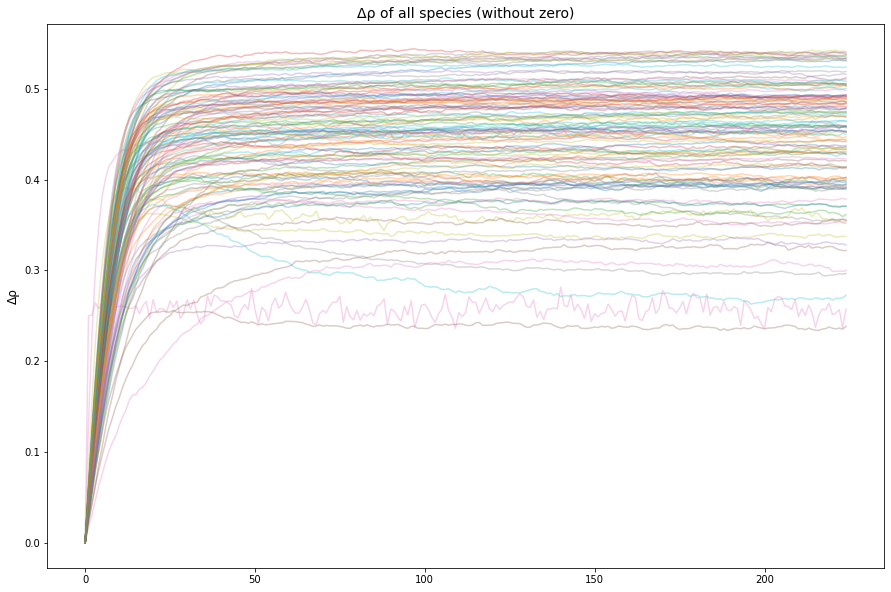

In [40]:
plt.figure(figsize=(15,10), facecolor='white')
for species in zero_n[0]:
    # if species in bad_species:
    #     plt.plot(delta_rhos[species], c='black')
    plt.plot(delta_rhos[species], alpha=0.3)
# plt.xlim(0,10)
# plt.xlabel('Поколение', fontsize=14)
plt.ylabel('Δρ', fontsize=12)
plt.title('Δρ of all species (without zero)', fontsize=14)
plt.show()

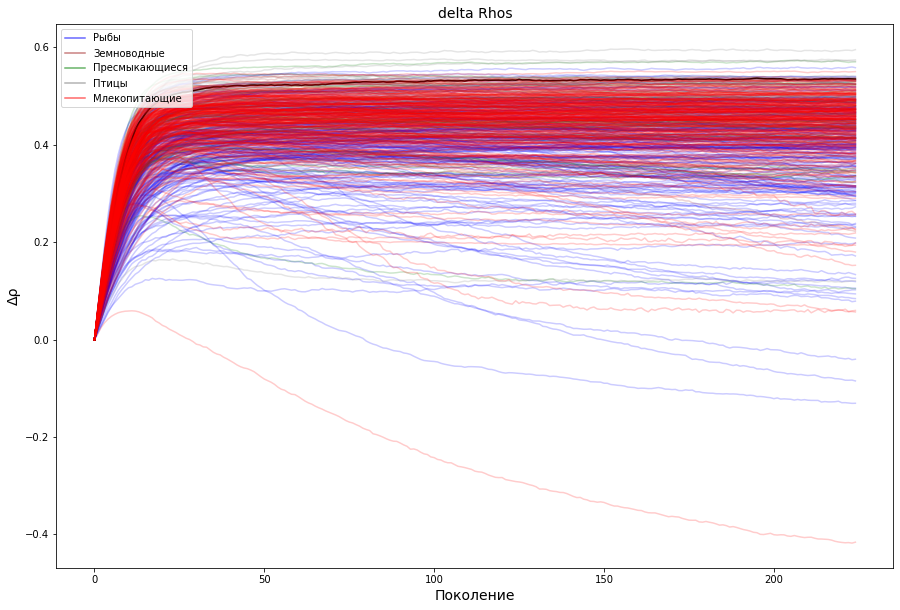

In [29]:
paint_delta_rhos(delta_rhos)


# Евклидово расстояние

In [39]:
species_list = random.choices(sim_AllGenes_Shift, k=10)
species_list = ['Mus_musculus']
for species in species_list:
    euc_dict_mean = {aa:np.zeros(225) for aa in aa_dict}
    for sample in range(20):
        # plt.figure(figsize=(15, 10), dpi=600, facecolor='white')
        codons_freq = pd.read_csv(f'C:\Work\Lab\Practice\\Results_AllGenes_shift\\{species}\\{sample}\\Frequencies.csv', sep='\t').copy()
        
        for aa in aa_dict:
            if aa == '_':
                continue
            euc_list = [] # vector of generated values of Euc dist for every gen
            for gen in range(1,226): # zero gen is a live genome
                vec_0 = codons_freq[aa_dict[aa]].iloc[0]
                vec_gen = codons_freq[aa_dict[aa]].iloc[gen]
                euc_dist = distance.euclidean(vec_0, vec_gen)
                euc_list.append(euc_dist)
            euc_dict_mean[aa] = euc_dict_mean[aa] + euc_list
        #     if len(aa_dict[aa]) == 4:
        #         plt.plot(euc_list, '--', alpha=0.5, label=aa)
        #     else: plt.plot(euc_list, alpha=0.5, label=aa)
        # plt.xlim(0, 225)
        # plt.ylim(top=0.12)
        # plt.xlabel('Поколение')
        # plt.ylabel('Евклидово расстояние')
        # plt.title(f'Евклидово расстояние для {species}, sample:{sample+1}')
        # plt.legend(loc='upper left', ncol = 5)
        # os.makedirs(f'Practice\\Results_graphs\\Euclidean metric\\{species}', exist_ok=True)
        # plt.savefig(f'Practice\\Results_graphs\\Euclidean metric\\{species}\\{sample}.png')
        # plt.show()
    for i in euc_dict_mean:
        euc_dict_mean[i] = euc_dict_mean[i] / 20

KeyboardInterrupt: 

In [75]:
species_list = ['Columba_livia']
aa_list = sorted(list(aa_dict.keys()))[:-1]
for species in tqdm(sim_AllGenes_Shift):    # 
    euc_dic = {aa:[] for aa in aa_dict}
    codons_freq = pd.read_csv(f'{result_folder}\\{species}\\FrequenciesMean.csv', sep='\t').copy()
    
    for aa in aa_dict:
        if aa == '_':
            continue
        codons_freq_aa = codons_freq.loc[:,aa_dict[aa]]
        euc_list = [] # vector of generated values of Euc dist for every gen
        for gen in range(1,226): # zero gen is a live genome
            vec_0 = codons_freq_aa.iloc[0]
            vec_gen = codons_freq_aa.iloc[gen]
            euc_dist = distance.euclidean(vec_0, vec_gen)
            euc_dic[aa].append(euc_dist)
            
    euc_df = pd.DataFrame(data=euc_dic, columns=aa_list)
    # euc_df.to_csv(f'C:\Work\Lab\Practice\\Results_AllGenes_shift\\{species}\\EuclideanMean.csv', index=False)

  0%|          | 0/560 [00:00<?, ?it/s]

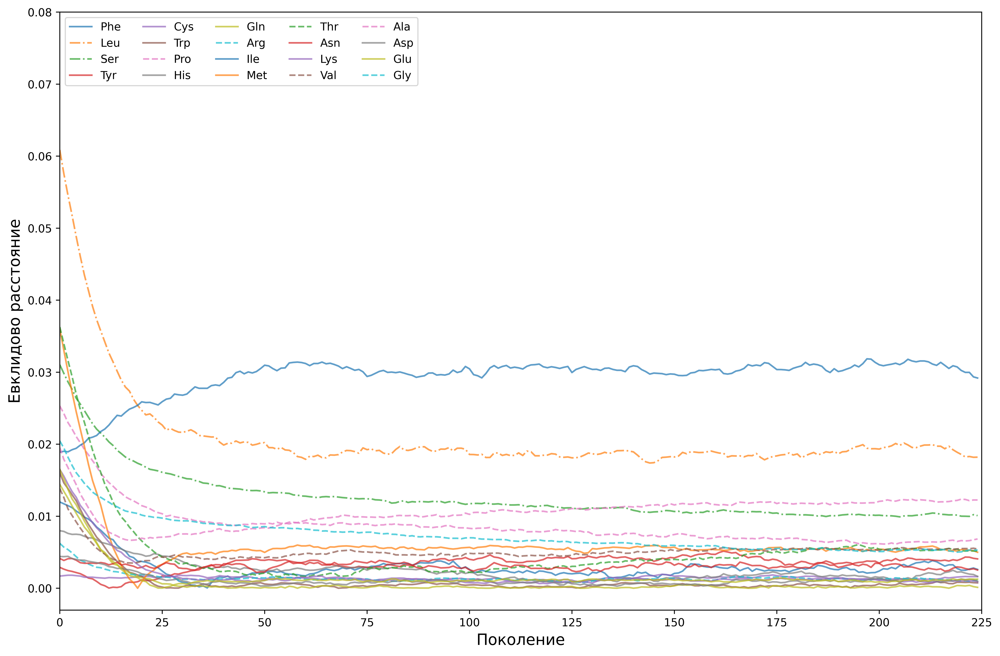

In [59]:
species = 'Mus_musculus'
euc_df = pd.read_csv(f'{result_folder}\\{species}\\EuclideanMean.csv').copy()
plt.figure(figsize=(15, 10), dpi=600, facecolor='white')
for aa in aa_dict:
    if aa == '_': continue
    if len(aa_dict[aa]) == 4:
        plt.plot(euc_df.loc[:,aa], '--', alpha=0.7, label=seq3(aa))
    elif len(aa_dict[aa]) == 2:
        plt.plot(euc_df.loc[:,aa], '-', alpha=0.7, label=seq3(aa))
    else:
        plt.plot(euc_df.loc[:,aa], '-.', alpha=0.7, label=seq3(aa))
plt.xlim(0, 225)
plt.ylim(top=0.08)
plt.xlabel('Поколение', fontsize=14)
plt.ylabel('Евклидово расстояние', fontsize=14)
# plt.title(f'Средние Евклидовы расстояния для {species}')

plt.legend(loc='upper left', ncol = 5)
# os.makedirs(f'C:\Work\Lab\Course work pictures\\Results_graphs\\Euclidean metric\\{species}', exist_ok=True)
# plt.savefig(f'C:\Work\Lab\Course work pictures\\Results_graphs\\Euclidean metric\\{species}\\Average.png')
plt.show()

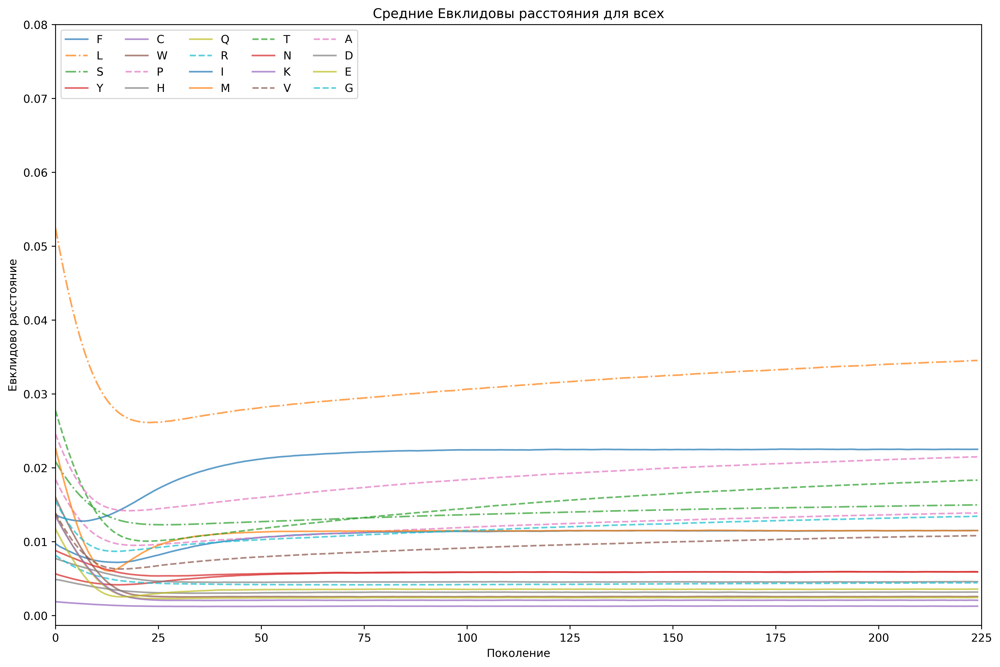

In [90]:
# ult_avg_euc_df = pd.DataFrame(0, index=range(225), columns=aa_list)
# for species in tqdm(sim_AllGenes_Shift):
#     euc_df = pd.read_csv(f'C:\Work\Lab\Practice\\Results_AllGenes_shift\\{species}\\EuclideanMean.csv').copy()
#     ult_avg_euc_df += euc_df
# ult_avg_euc_df /= len(sim_AllGenes_Shift)

plt.figure(figsize=(15, 10), dpi=600, facecolor='white')
for aa in aa_dict:
    if aa == '_': continue
    if len(aa_dict[aa]) == 4:
        plt.plot(ult_avg_euc_df.loc[:,aa], '--', alpha=0.7, label=aa)
    elif len(aa_dict[aa]) == 2:
        plt.plot(ult_avg_euc_df.loc[:,aa], '-', alpha=0.7, label=aa)
    else:
        plt.plot(ult_avg_euc_df.loc[:,aa], '-.', alpha=0.7, label=aa)
plt.xlim(0, 225)
plt.ylim(top=0.08)
plt.xlabel('Поколение')
plt.ylabel('Евклидово расстояние')
# plt.title(f'Средние Евклидовы расстояния для всех')
plt.legend(loc='upper left', ncol = 5)
# os.makedirs(f'C:\Work\Lab\Course work pictures\\Results_graphs\\Euclidean metric\\{species}', exist_ok=True)
# plt.savefig(f'C:\Work\Lab\Course work pictures\\Results_graphs\\Euclidean metric\\{species}\\Average.png')
plt.show()

In [42]:
#
species = 'Mus_musculus'
aa_winners = {}
for species in sim_AllGenes_Shift:
    euc_df = pd.read_csv(f'{result_folder}\\{species}\\EuclideanMean.csv').copy()
    aa_winners[species] = (euc_df.iloc[0] > euc_df.iloc[224]).sum()

In [111]:
(ult_avg_euc_df.iloc[0]*0.7 > ult_avg_euc_df.iloc[224]).sum()

12

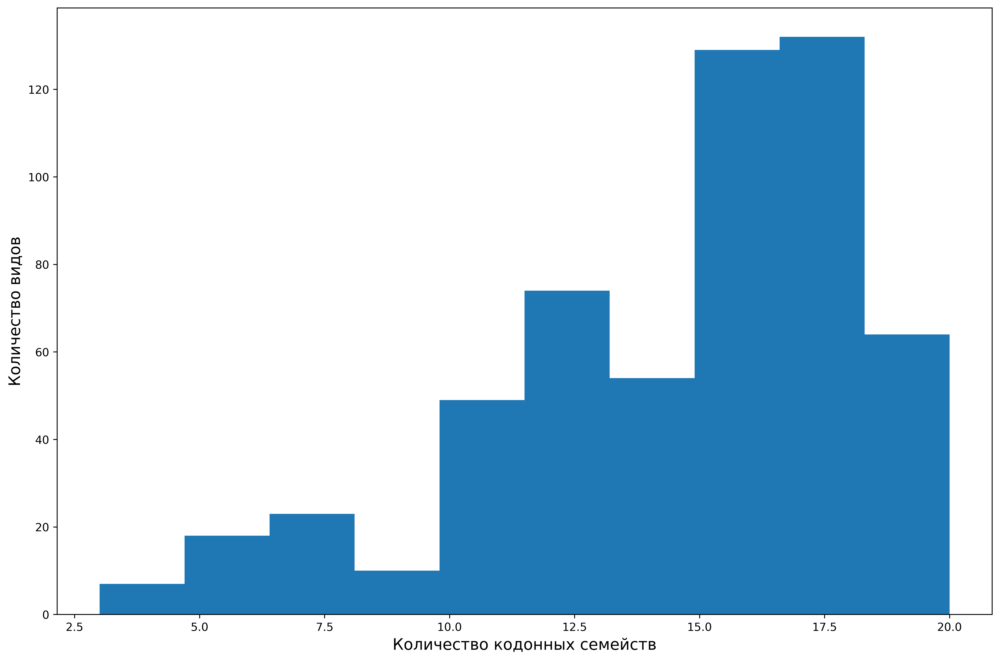

In [44]:
plt.figure(figsize=(15, 10), dpi=600, facecolor='white')
plt.hist(aa_winners.values())
# plt.xlim(0, 225)
# plt.ylim(top=0.08)
plt.xlabel('Количество кодонных семейств', fontsize=14)    # , для которых расстояние сократилось
plt.ylabel('Количество видов', fontsize=14)
# plt.title(f'Гистограмма распределения аминокислот со снизившимся расстоянием')
plt.show()

# Средний мутспек

0.9999999999999999


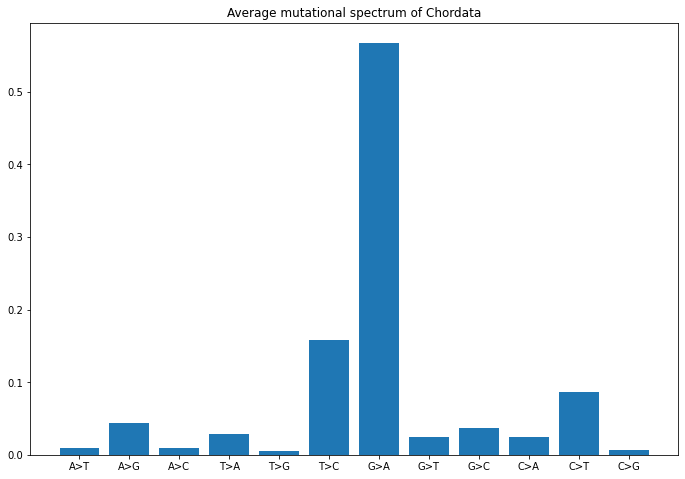

In [3]:
vals = list(ms[ms.Species.isin(zero_6)].loc[:,'A_T':'C_G'].mean())
print(sum(vals))

subs = [sub.replace('_', '>') for sub in ms.columns.tolist()[1:]]#['T>A', 'T>C', 'T>G', 'A>T', 'A>C', 'A>G', 'C>T', 'C>A', 'C>G', 'G>T', 'G>A', 'G>C']
# for i in range(len(subs)):
#     subs[i] = str(Seq(subs[i]).complement())

subs[-1], subs[-2] = subs[-2], subs[-1] # изменяет последовательность, чтобы текст не накладывался
vals[-1], vals[-2] = vals[-2], vals[-1]

fig = plt.figure(figsize=(9, 6), facecolor='white')
ax = fig.add_axes([0,0,1,1])
ax.bar(subs,vals)
# ax.set_ylabel()
ax.set_title('Average mutational spectrum of Chordata')
# plt.savefig('Course work pictures\\Results_graphs\\ms.png',bbox_inches='tight')
plt.show()

## Нули в мутспеке

In [39]:
treshhold = 0
sub_ms = ms.loc[ms.Species.isin(sim_AllGenes_Shift),'A_T':]
sub_ms[(sub_ms > 0).sum(axis=1) > treshhold]
# len(sim_AllGenes_Shift)

,A_T,A_G,A_C,T_A,T_G,T_C,G_A,G_T,G_C,C_A,C_T,C_G
0,0.011369,0.028350,0.013839,0.059072,0.007981,0.128591,0.473568,0.051221,0.079542,0.075205,0.060218,0.011045
2,0.000000,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,0.012659,0.082285,0.000000
3,0.014626,0.106742,0.044787,0.000000,0.023947,0.062424,0.596688,0.050615,0.000000,0.063097,0.020964,0.016110
5,0.090170,0.011128,0.064126,0.065980,0.006766,0.196450,0.225208,0.106133,0.105267,0.030754,0.090922,0.007097
6,0.005985,0.033916,0.001995,0.050921,0.000000,0.106471,0.588106,0.012252,0.098018,0.015049,0.078257,0.009030
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,0.000000,0.038511,0.000000,0.000000,0.000000,0.014355,0.659022,0.146449,0.073225,0.012832,0.055605,0.000000
1564,0.011755,0.002939,0.000000,0.014100,0.000000,0.119851,0.655071,0.000000,0.131014,0.014189,0.045406,0.005676
1574,0.003263,0.026886,0.000000,0.000000,0.016214,0.158170,0.535493,0.107263,0.000000,0.010436,0.142276,0.000000
1580,0.005116,0.066302,0.000000,0.019977,0.000000,0.263103,0.465466,0.000000,0.000000,0.004933,0.175103,0.000000


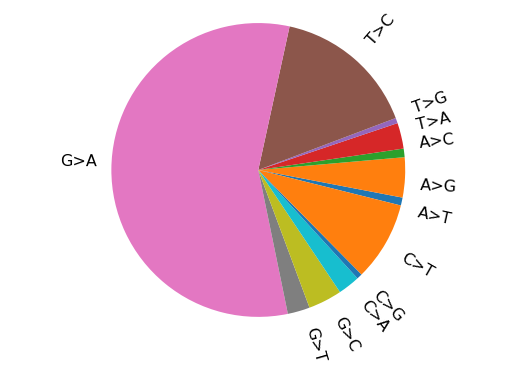

In [16]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.pie(vals, labels=subs, rotatelabels=True, startangle=-14, textprops={'fontsize': 16}) # , textprops={'fontsize': 18}
ax.axis("equal")
# plt.title('MutSpec Mus Musculus')
plt.savefig('Practice\\Pie plot.png')
plt.show()

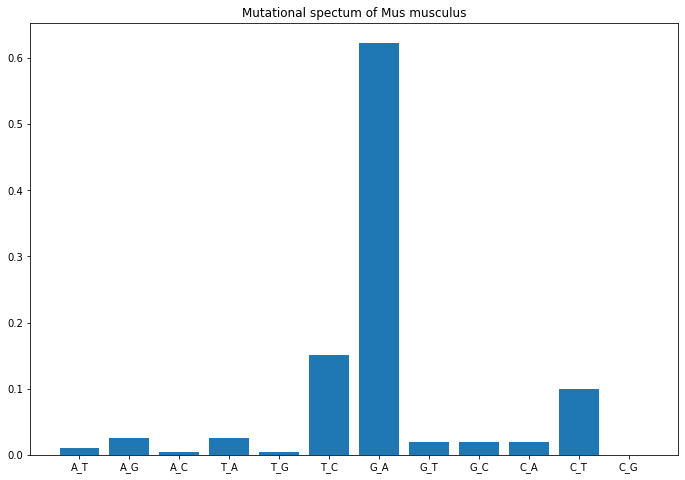

In [4]:
vals = ms[ms.Species=='Mus_musculus'].iloc[0].tolist()[1:]

subs = ms.columns.tolist()[1:]#['T>A', 'T>C', 'T>G', 'A>T', 'A>C', 'A>G', 'C>T', 'C>A', 'C>G', 'G>T', 'G>A', 'G>C']
# for i in range(len(subs)):
#     subs[i] = str(Seq(subs[i]).complement())
fig = plt.figure(figsize=(9, 6))
ax = fig.add_axes([0,0,1,1])
ax.bar(subs,vals)
# ax.set_ylabel()
ax.set_title('Mutational spectum of Mus musculus')
# plt.savefig('Course work pictures\\Results_graphs\\msMus_musculus.png', bbox_inches='tight')
plt.show()

In [21]:
ms[ms.Species=='Mus_musculus'].iloc[0].tolist()[1:]

[0.009729343096403,
 0.0248824899808707,
 0.005125777714604,
 0.0248709965673907,
 0.0040051223125168,
 0.150563187115621,
 0.621941763900787,
 0.0195909041463318,
 0.0201832487681848,
 0.0193918303795617,
 0.0992358068925552,
 0.0004795291251737]

# Хитмап

In [113]:
cu = pd.read_csv('Practice/CodonFrequencyAllGenes.csv', sep='\t').copy()
cu[cu.Species=='Mus_musculus']

,Species,AAA,AAC,AAG,AAT,ACA,ACC,ACG,ACT,AGA,...,TCG,TCT,TGA,TGC,TGG,TGT,TTA,TTC,TTG,TTT
2193,Mus_musculus,0.027939,0.029599,0.000277,0.015491,0.04343,0.02379,0.001383,0.014938,0.0,...,0.00083,0.011065,0.025726,0.004979,0.001383,0.00166,0.031535,0.036791,0.001936,0.027109


In [137]:
mus_cu = {c:val for c, val in zip(cu.columns.to_list()[1:], cu[cu.Species=='Mus_musculus'].values[0][1:])}    
for aa in aa_dict:
    if aa == '_': continue
    mus_aa = 0
    for c in aa_dict[aa]:
        mus_aa += mus_cu[c]
    for c in aa_dict[aa]:
        mus_cu[c] = mus_cu[c]/mus_aa
for aa in aa_dict:
    for c in aa_dict[aa]:
        print(str(c) + ' ' + str(mus_cu[c]))

TTT 0.4242424242424238
TTC 0.575757575757576
TTA 0.20284697508896787
TTG 0.012455516014234695
CTT 0.14946619217081827
CTC 0.11387900355871897
CTA 0.47330960854092613
CTG 0.04804270462633401
TCT 0.14234875444839903
TCC 0.1672597864768685
TCA 0.5160142348754463
TCG 0.010676156583628674
AGT 0.03914590747330899
AGC 0.12455516014234866
TAT 0.4827586206896556
TAC 0.5172413793103444
TGT 0.24999999999999248
TGC 0.7500000000000075
TGA 0.9489795918367367
TGG 0.05102040816326316
CCT 0.1450777202072539
CCC 0.17616580310880842
CCA 0.6683937823834207
CCG 0.010362694300516931
CAT 0.3505154639175263
CAC 0.6494845360824738
CAA 0.9629629629629671
CAG 0.03703703703703291
CGT 0.12698412698412537
CGC 0.2857142857142849
CGA 0.5396825396825471
CGG 0.04761904761904271
ATT 0.6162464985994397
ATC 0.3837535014005603
ATA 0.9025423728813567
ATG 0.09745762711864331
ACT 0.1788079470198671
ACC 0.2847682119205302
ACA 0.5198675496688747
ACG 0.01655629139072775
AAT 0.34355828220858853
AAC 0.6564417177914116
AAA 0.990196

In [164]:
c_order = ['TTT', 'TCT', 'TAT', 'TGT', 'TTC', 'TCC', 'TAC', 'TGC', 'TTA', 'TCA', 'TAA', 'TGA', 'TTG', 'TCG', 'TAG', 'TGG', 'CTT', 'CCT', 'CAT', 'CGT', 'CTC', 'CCC', 'CAC', 'CGC', 'CTA', 'CCA', 'CAA', 'CGA', 'CTG', 'CCG', 'CAG', 'CGG', 'ATT', 'ACT', 'AAT', 'AGT', 'ATC', 'ACC', 'AAC', 'AGC', 'ATA', 'ACA', 'AAA', 'AGA', 'ATG', 'ACG', 'AAG', 'AGG', 'GTT', 'GCT', 'GAT', 'GGT', 'GTC', 'GCC', 'GAC', 'GGC', 'GTA', 'GCA', 'GAA', 'GGA', 'GTG', 'GCG', 'GAG', 'GGG']
val_order = []
one_raw = []
for c in c_order:
    one_raw.append(mus_cu[c])
    if len(one_raw) == 4:
        val_order.append(one_raw)
        one_raw = []
print(val_order)
print(c_order)

[[0.4242424242424238, 0.14234875444839903, 0.4827586206896556, 0.24999999999999248], [0.575757575757576, 0.1672597864768685, 0.5172413793103444, 0.7500000000000075], [0.20284697508896787, 0.5160142348754463, 0.0, 0.9489795918367367], [0.012455516014234695, 0.010676156583628674, 0.0, 0.05102040816326316], [0.14946619217081827, 0.1450777202072539, 0.3505154639175263, 0.12698412698412537], [0.11387900355871897, 0.17616580310880842, 0.6494845360824738, 0.2857142857142849], [0.47330960854092613, 0.6683937823834207, 0.9629629629629671, 0.5396825396825471], [0.04804270462633401, 0.010362694300516931, 0.03703703703703291, 0.04761904761904271], [0.6162464985994397, 0.1788079470198671, 0.34355828220858853, 0.03914590747330899], [0.3837535014005603, 0.2847682119205302, 0.6564417177914116, 0.12455516014234866], [0.9025423728813567, 0.5198675496688747, 0.9901960784313737, 0.0], [0.09745762711864331, 0.01655629139072775, 0.009803921568626304, 0.0], [0.2585034013605445, 0.1911111111111112, 0.36764705

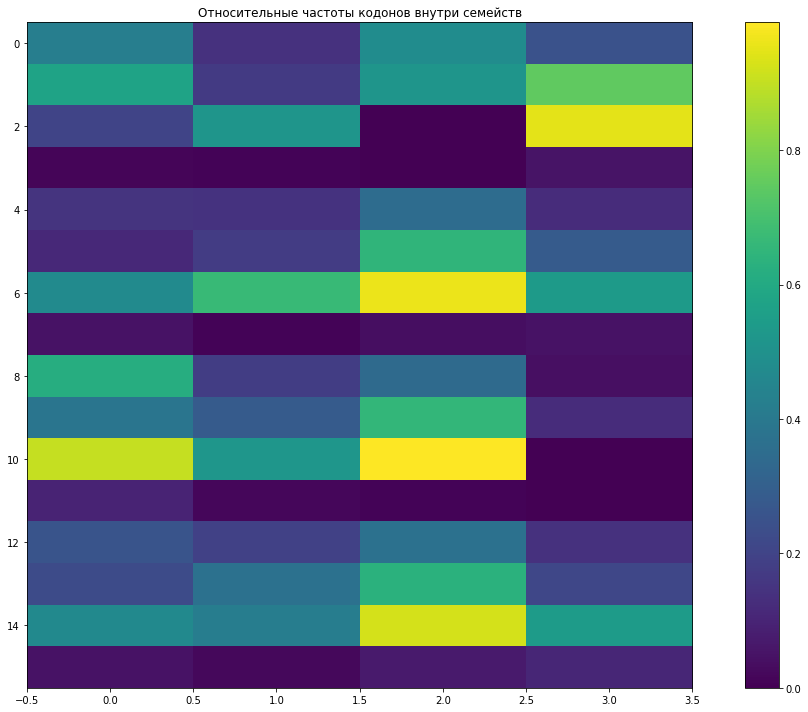

In [163]:
vegetables = ["cucumber", "tomato", "lettuce", "asparagus",
              "potato", "wheat", "barley"]
farmers = ["Farmer Joe", "Upland Bros.", "Smith Gardening",
           "Agrifun", "Organiculture", "BioGoods Ltd.", "Cornylee Corp."]

harvest = np.array(val_order)


fig, ax = plt.subplots(figsize=(15, 10))
im = ax.imshow(harvest)

# Show all ticks and label them with the respective list entries
# ax.set_xticks(np.arange(4)) #, labels=farmers
# ax.set_yticks(np.arange(4))



# Loop over data dimensions and create text annotations.
# for i in range(len(vegetables)):
#     for j in range(len(farmers)):
#         text = ax.text(j, i, harvest[i, j],
#                        ha="center", va="center", color="w")
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel('', rotation=-90, va="bottom")

ax.set_title("Относительные частоты кодонов внутри семейств")
ax.set_aspect(aspect=0.25)
fig.tight_layout()
plt.savefig('Course work pictures\\Results_graphs\\hm.png') #,bbox_inches='tight'
plt.show()

# Ecology

## Холодно- и теплокровные

In [4]:
Class_dict = {}
for Class in class_list:
    Class_dict[Class] = cs_all[(cs_all.Class == Class)].Species.values #  & (cs_all.Species.isin(zero_n[4]))
    
cold_blood = list(Class_dict['Actinopterygii']) + list(Class_dict['Amphibia'])
warm_blood = list(Class_dict['Aves']) + list(Class_dict['Mammalia'])
сold_blood_pseudo = list(Class_dict['Actinopterygii']) + list(Class_dict['Amphibia']) + list(Class_dict['Reptilia'])
# print(MW(cold_blood, warm_blood))

# gen = 225

# warm_cold_dict = {'cold-blood':[], 'warm-blood':[]}
# for species in cold_blood:
#     warm_cold_dict['cold-blood'].append(deltaRho_ShiftMean[species][gen-1])
# for species in warm_blood:
#     warm_cold_dict['warm-blood'].append(deltaRho_ShiftMean[species][gen-1])

# print('Cold: {}'.format(len(warm_cold_dict['cold-blood'])))
# print('Warm: {}'.format(len(warm_cold_dict['warm-blood'])))

In [18]:
Class_dict = {}
for Class in class_list:
    Class_dict[Class] = cs_all[(cs_all.Class == Class) & (cs_all.Species.isin(zero_n[4]))].Species.values # sim_AllGenes_Shift
    
cold_blood = list(Class_dict['Actinopterygii']) + list(Class_dict['Amphibia'])
warm_blood = list(Class_dict['Aves']) + list(Class_dict['Mammalia'])
сold_blood_pseudo = list(Class_dict['Actinopterygii']) + list(Class_dict['Amphibia']) + list(Class_dict['Reptilia'])
print(warm_blood)

['Cyanopica_cyanus', 'Eopsaltria_australis', 'Henicorhina_leucosticta', 'Anourosorex_squamipes', 'Artibeus_jamaicensis', 'Bos_javanicus', 'Callosciurus_erythraeus', 'Canis_lupus', 'Canis_lupus_familiaris', 'Cavia_porcellus', 'Cercopithecus_albogularis', 'Cercopithecus_mitis', 'Cervus_elaphus', 'Cheirogaleus_medius', 'Chlorocebus_pygerythrus', 'Colobus_guereza', 'Crocidura_beatus', 'Crocidura_grayi', 'Eospalax_baileyi', 'Eothenomys_miletus', 'Episoriculus_macrurus', 'Laonastes_aenigmamus', 'Lepus_capensis', 'Lepus_europaeus', 'Lepus_timidus', 'Macaca_fascicularis', 'Monodelphis_domestica', 'Mus_caroli', 'Mus_musculus', 'Myodes_glareolus', 'Neodon_irene', 'Niviventer_confucianus', 'Niviventer_fulvescens', 'Ochotona_curzoniae', 'Ovis_ammon', 'Pan_troglodytes', 'Procyon_lotor', 'Pteromys_volans', 'Pteronotus_parnellii', 'Rattus_tanezumi', 'Sus_scrofa', 'Thylamys_elegans', 'Viverricula_indica']


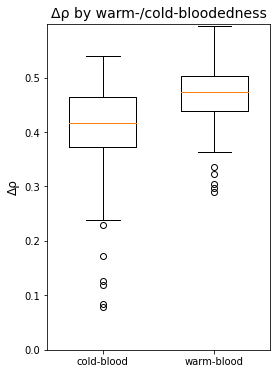

MannwhitneyuResult(statistic=8205.0, pvalue=1.0337820052776077e-14)


In [7]:
fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(warm_cold_dict.values(), widths=0.6)
ax.set_xticklabels(warm_cold_dict.keys())
plt.title('Δρ by warm-/cold-bloodedness', fontsize=14)
# plt.xlabel('Class', fontsize=12)
plt.ylabel('Δρ', fontsize=12)
plt.ylim(bottom=0, top=0.599)
# plt.savefig('Course work pictures\\Results_graphs\\Δρ CW-blood.png')
plt.show()

print(MW(warm_cold_dict['cold-blood'], warm_cold_dict['warm-blood']))
# print(spearmanr(warm_cold_dict['cold-blood'], warm_cold_dict['warm-blood'])) # the arrays must be the same size

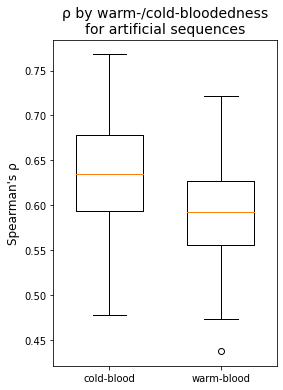

MannwhitneyuResult(statistic=21841.0, pvalue=1.461968197067895e-10)


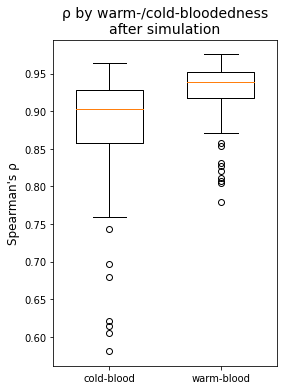

MannwhitneyuResult(statistic=7049.0, pvalue=4.1009054370708397e-19)


In [16]:
gen = 1

warm_cold_dict = {'cold-blood':[], 'warm-blood':[]}
for species in cold_blood:
    spearman_mean = pd.read_csv(f'{result_folder}}\{species}\SpearmanMean.csv', sep='\t').copy()
    warm_cold_dict['cold-blood'].append(spearman_mean.spearman[gen-1])
for species in warm_blood:
    spearman_mean = pd.read_csv('Practice\\Results_AllGenes_shift\{}\SpearmanMean.csv'.format(species), sep='\t').copy()
    warm_cold_dict['warm-blood'].append(spearman_mean.spearman[gen-1])
    
fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(warm_cold_dict.values(), widths=0.6)
ax.set_xticklabels(warm_cold_dict.keys())
plt.title('ρ by warm-/cold-bloodedness\nfor artificial sequences', fontsize=14)
# plt.xlabel('Class', fontsize=12)
plt.ylabel('Spearman\'s ρ', fontsize=12)
# plt.savefig('Course work pictures\\Results_graphs\\Δρ CW-blood.png')
plt.show()

print(MW(warm_cold_dict['cold-blood'], warm_cold_dict['warm-blood']))

gen = 225

warm_cold_dict = {'cold-blood':[], 'warm-blood':[]}
for species in cold_blood:
    spearman_mean = pd.read_csv(f'{result_folder}\{species}\SpearmanMean.csv', sep='\t').copy()
    warm_cold_dict['cold-blood'].append(spearman_mean.spearman[gen-1])
for species in warm_blood:
    spearman_mean = pd.read_csv(f'{result_folder}\{species}\SpearmanMean.csv', sep='\t').copy()
    warm_cold_dict['warm-blood'].append(spearman_mean.spearman[gen-1])
    
fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(warm_cold_dict.values(), widths=0.6)
ax.set_xticklabels(warm_cold_dict.keys())
plt.title('ρ by warm-/cold-bloodedness\nafter simulation', fontsize=14)
# plt.xlabel('Class', fontsize=12)
plt.ylabel('Spearman\'s ρ', fontsize=12)
# plt.savefig('Course work pictures\\Results_graphs\\Δρ CW-blood.png')
plt.show()

print(MW(warm_cold_dict['cold-blood'], warm_cold_dict['warm-blood']))

In [5]:
# reverse mutspec for warm- and coldblooded
warm_blooded = ['Agelaius_phoeniceus', 'Alauda_arvensis', 'Alectoris_chukar', 'Anas_platyrhynchos', 'Anser_cygnoides', 'Bambusicola_thoracicus', 'Brotogeris_cyanoptera', 'Cardinalis_cardinalis', 'Carpodacus_erythrinus', 'Copsychus_saularis', 'Cyanopica_cyanus', 'Eopsaltria_australis', 'Eopsaltria_griseogularis', 'Fringilla_coelebs', 'Gallus_gallus', 'Garrulax_canorus', 'Garrulus_glandarius', 'Grus_canadensis', 'Henicorhina_leucosticta', 'Acomys_cahirinus', 'Ailuropoda_melanoleuca', 'Alouatta_seniculus', 'Anourosorex_squamipes', 'Aotus_nancymaae', 'Apodemus_draco', 'Apodemus_latronum', 'Apodemus_peninsulae', 'Arctocephalus_forsteri', 'Artibeus_jamaicensis', 'Artibeus_lituratus', 'Ateles_belzebuth', 'Avahi_laniger', 'Balaena_mysticetus', 'Bandicota_indica', 'Bos_indicus', 'Bos_javanicus', 'Bos_taurus', 'Bubalus_bubalis', 'Callosciurus_erythraeus', 'Canis_lupus', 'Canis_lupus_familiaris', 'Capra_aegagrus', 'Capreolus_capreolus', 'Capreolus_pygargus', 'Carollia_perspicillata', 'Cavia_porcellus', 'Cercopithecus_albogularis', 'Cercopithecus_mitis', 'Cervus_elaphus', 'Cheirogaleus_medius', 'Chlorocebus_cynosuros', 'Chlorocebus_pygerythrus', 'Chlorocebus_tantalus', 'Colobus_guereza', 'Cricetulus_kamensis', 'Crocidura_attenuata', 'Crocidura_beatus', 'Crocidura_grayi', 'Crocidura_mindorus', 'Crocidura_russula', 'Crocidura_shantungensis', 'Cynomys_ludovicianus', 'Cynopterus_brachyotis', 'Dasypus_novemcinctus', 'Dasyurus_hallucatus', 'Daubentonia_madagascariensis', 'Desmodus_rotundus', 'Dremomys_rufigenis', 'Eospalax_baileyi', 'Eospalax_cansus', 'Eothenomys_chinensis', 'Eothenomys_melanogaster', 'Eothenomys_miletus', 'Eozapus_setchuanus', 'Episoriculus_caudatus', 'Episoriculus_fumidus', 'Episoriculus_macrurus', 'Epomophorus_gambianus', 'Equus_asinus', 'Equus_caballus', 'Euchoreutes_naso', 'Gazella_subgutturosa', 'Gorilla_gorilla', 'Gorilla_gorilla_gorilla', 'Herpestes_javanicus', 'Heterocephalus_glaber', 'Hipposideros_armiger', 'Hylobates_agilis', 'Hylobates_lar', 'Hylomys_suillus', 'Indri_indri', 'Lama_guanicoe', 'Laonastes_aenigmamus', 'Lasiurus_borealis', 'Leopoldamys_edwardsi', 'Lepilemur_ruficaudatus', 'Lepus_americanus', 'Lepus_capensis', 'Lepus_europaeus', 'Lepus_sinensis', 'Lepus_timidus', 'Lophostoma_silvicolum', 'Loris_tardigradus', 'Macaca_fascicularis', 'Macaca_mulatta', 'Macaca_nemestrina', 'Macaca_tonkeana', 'Martes_flavigula', 'Martes_zibellina', 'Meles_meles', 'Meriones_libycus', 'Meriones_meridianus', 'Microcebus_murinus', 'Micromys_minutus', 'Micronycteris_megalotis', 'Mogera_wogura', 'Monodelphis_domestica', 'Mustela_frenata', 'Mustela_nivalis', 'Mustela_sibirica', 'Mus_caroli', 'Mus_musculus', 'Myodes_glareolus', 'Myodes_rufocanus', 'Myotis_davidii', 'Myotis_lucifugus', 'Myotis_muricola', 'Nasua_nasua', 'Neodon_irene', 'Neomys_fodiens', 'Neotetracus_sinensis', 'Niviventer_confucianus', 'Niviventer_excelsior', 'Niviventer_fulvescens', 'Nyctalus_noctula', 'Nycticebus_coucang', 'Ochotona_collaris', 'Ochotona_curzoniae', 'Ochotona_princeps', 'Ornithorhynchus_anatinus', 'Ovis_ammon', 'Pan_troglodytes', 'Papio_anubis', 'Papio_cynocephalus', 'Pecari_tajacu', 'Perameles_gunnii', 'Perodicticus_potto', 'Petaurista_alborufus', 'Plecotus_auritus', 'Plecotus_macrobullaris', 'Potorous_tridactylus', 'Presbytis_melalophos', 'Prionailurus_viverrinus', 'Procyon_lotor', 'Propithecus_diadema', 'Propithecus_edwardsi', 'Propithecus_verreauxi', 'Pseudois_nayaur', 'Pteromys_volans', 'Pteronotus_parnellii', 'Rangifer_tarandus', 'Rattus_rattus', 'Rattus_tanezumi', 'Rattus_tiomanicus', 'Rhinolophus_macrotis', 'Rhinopithecus_bieti', 'Rousettus_aegyptiacus', 'Semnopithecus_entellus', 'Sorex_araneus', 'Sorex_cylindricauda', 'Sorex_unguiculatus', 'Suncus_murinus', 'Sus_celebensis', 'Sus_scrofa', 'Symphalangus_syndactylus', 'Tamias_sibiricus', 'Tamiops_maritimus', 'Tamiops_swinhoei', 'Thylamys_elegans', 'Trachypithecus_francoisi', 'Tragelaphus_scriptus', 'Tupaia_belangeri', 'Tursiops_aduncus', 'Tursiops_truncatus', 'Urocyon_cinereoargenteus', 'Urotrichus_talpoides', 'Ursus_arctos', 'Ursus_thibetanus', 'Vicugna_vicugna', 'Viverricula_indica', 'Vulpes_vulpes']
cold_blooded = ['Abbottina_rivularis', 'Abudefduf_vaigiensis', 'Acanthogobius_hasta', 'Acanthopagrus_schlegelii', 'Acanthorhodeus_chankaensis', 'Acheilognathus_barbatus', 'Acheilognathus_macropterus', 'Acheilognathus_signifer', 'Acheilognathus_somjinensis', 'Acipenser_gueldenstaedtii', 'Acipenser_schrenckii', 'Acrossocheilus_parallens', 'Acrossocheilus_yunnanensis', 'Agonostomus_monticola', 'Alburnus_alburnus', 'Amphiprion_clarkii', 'Amphiprion_ocellaris', 'Amphiprion_percula', 'Anabas_testudineus', 'Anguilla_anguilla', 'Anguilla_bicolor_bicolor', 'Anguilla_marmorata', 'Apteronotus_albifrons', 'Auxis_rochei', 'Auxis_thazard', 'Barbatula_barbatula', 'Barbatula_nuda', 'Barbatula_toni', 'Beaufortia_kweichowensis', 'Beryx_splendens', 'Biwia_zezera', 'Boleophthalmus_pectinirostris', 'Brachyhypopomus_occidentalis', 'Brachymystax_lenok', 'Campostoma_anomalum', 'Carassius_auratus', 'Carassius_auratus_auratus', 'Carassius_carassius', 'Carassius_cuvieri', 'Carassius_gibelio', 'Catla_catla', 'Channa_argus', 'Channa_asiatica', 'Channa_maculata', 'Chuanchia_labiosa', 'Cirrhinus_mrigala', 'Clarias_gariepinus', 'Cleisthenes_herzensteini', 'Clupea_harengus', 'Clupea_pallasii', 'Cobitis_biwae', 'Cobitis_sinensis', 'Cobitis_striata', 'Coilia_mystus', 'Colomesus_asellus', 'Coregonus_lavaretus', 'Coregonus_muksun', 'Coregonus_oxyrinchus', 'Coreoleuciscus_splendidus', 'Coreoperca_kawamebari', 'Cottus_bairdii', 'Ctenopharyngodon_idella', 'Culter_alburnus', 'Cyprinella_lutrensis', 'Cyprinodon_rubrofluviatilis', 'Cyprinodon_variegatus', 'Cyprinus_carpio', 'Cyprinus_multitaeniata', 'Danio_rerio', 'Dicentrarchus_labrax', 'Dicentrarchus_punctatus', 'Diplomystes_nahuelbutaensis', 'Diptychus_maculatus', 'Elassoma_evergladei', 'Elassoma_zonatum', 'Eleutheronema_tetradactylum', 'Elopichthys_bambusa', 'Engraulis_encrasicolus', 'Epinephelus_akaara', 'Epinephelus_fuscoguttatus', 'Epinephelus_lanceolatus', 'Erpetoichthys_calabaricus', 'Esox_lucius', 'Euchiloglanis_kishinouyei', 'Exocoetus_volitans', 'Fundulus_heteroclitus', 'Fundulus_notatus', 'Fundulus_olivaceus', 'Gadus_chalcogrammus', 'Gadus_morhua', 'Galaxias_maculatus', 'Galaxias_truttaceus', 'Garra_orientalis', 'Glyptothorax_zanaensis', 'Gobiobotia_brevibarba', 'Gobiobotia_macrocephala', 'Gobiobotia_naktongensis', 'Gobio_gobio', 'Gymnocypris_eckloni', 'Gymnocypris_przewalskii', 'Gymnodiptychus_dybowskii', 'Gymnodiptychus_pachycheilus', 'Hemibagrus_guttatus', 'Hemibagrus_macropterus', 'Heteropneustes_fossilis', 'Hippocampus_ingens', 'Hypophthalmichthys_molitrix', 'Hypophthalmichthys_nobilis', 'Katsuwonus_pelamis', 'Larimichthys_polyactis', 'Lepomis_macrochirus', 'Lota_lota', 'Lutjanus_argentimaculatus', 'Micromesistius_poutassou', 'Micropterus_dolomieu', 'Micropterus_salmoides', 'Mugil_cephalus', 'Mugil_curema', 'Oncorhynchus_keta', 'Oncorhynchus_mykiss', 'Oreochromis_niloticus', 'Oryzias_latipes', 'Osmerus_mordax', 'Pampus_argenteus', 'Panthera_leo', 'Paralichthys_olivaceus', 'Pellonula_leonensis', 'Perca_fluviatilis', 'Phoxinus_phoxinus', 'Platichthys_stellatus', 'Plectropomus_leopardus', 'Plotosus_lineatus', 'Poecilia_reticulata', 'Pollachius_virens', 'Pseudopleuronectes_yokohamae', 'Pungitius_pungitius', 'Rastrelliger_kanagurta', 'Reinhardtius_hippoglossoides', 'Salmo_salar', 'Salmo_trutta', 'Scomberomorus_munroi', 'Scomberomorus_semifasciatus', 'Scomber_japonicus', 'Seriola_dumerili', 'Siganus_canaliculatus', 'Spicara_maena', 'Sprattus_sprattus', 'Squaliobarbus_curriculus', 'Takifugu_rubripes', 'Terapon_jarbua', 'Thunnus_alalunga', 'Thunnus_thynnus', 'Tropheus_moorii', 'Xiphias_gladius', 'Zeus_faber', 'Andrias_davidianus', 'Batrachuperus_pinchonii', 'Bombina_maxima', 'Bombina_variegata', 'Desmognathus_fuscus', 'Desmognathus_wrighti', 'Duttaphrynus_melanostictus', 'Echinotriton_andersoni', 'Gyrinophilus_porphyriticus']

deltaRho_ShiftMean_CWR = {}
for species in warm_blooded+cold_blooded:
    delta_rho_sp = {}
    deltaRho_ShiftMean_CWR[species] = np.array([0 for i in range(225)])
    for sample in range(20):
        spearman_df = pd.read_csv('Practice\\Results_AllGenes_shift_ColdWarmReverse\{}\{}\Spearman.csv'.format(species, sample), sep='\t').copy()
        delta_rho_sp[sample] = []

        for spearman_value in spearman_df.spearman.values:
            delta_rho_sp[sample].append(spearman_value - spearman_df.spearman.values[0])
        deltaRho_ShiftMean_CWR[species] = deltaRho_ShiftMean_CWR[species] + delta_rho_sp[sample]
    deltaRho_ShiftMean_CWR[species] = deltaRho_ShiftMean_CWR[species]/20

In [8]:
gen = 225

warm_cold_dict_CWR = {'cold-blood':[], 'warm-blood':[]}
for species in cold_blood:
    warm_cold_dict_CWR['cold-blood'].append(deltaRho_ShiftMean_CWR[species][gen-1])
for species in warm_blood:
    warm_cold_dict_CWR['warm-blood'].append(deltaRho_ShiftMean_CWR[species][gen-1])

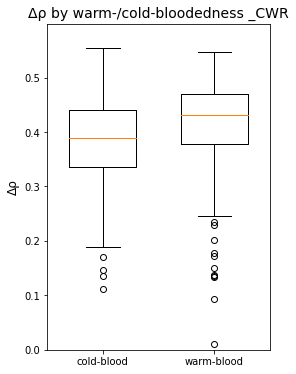

MannwhitneyuResult(statistic=12008.0, pvalue=0.00015066359682503911)


In [17]:
fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(warm_cold_dict_CWR.values(), widths=0.6)
ax.set_xticklabels(warm_cold_dict_CWR.keys())
plt.title('Δρ by warm-/cold-bloodedness _CWR', fontsize=14)
# plt.xlabel('Class', fontsize=12)
plt.ylabel('Δρ', fontsize=12)
plt.ylim(bottom=0, top=0.599)
plt.savefig('Course work pictures\\Results_graphs\\Δρ CW-blood_CWR.png')
plt.show()

print(MW(warm_cold_dict_CWR['cold-blood'], warm_cold_dict_CWR['warm-blood']))

## Generation length

In [35]:
gl = pd.read_csv(r'C:\Work\Lab\pr-29-trna-or-mutagenesis\raw\GenerationLenght.csv', sep='\t').copy()
gl.Scientific_name = gl.Scientific_name.str.replace(' ', '_')
gl = gl.sort_values(by='GenerationLength_d')
gl.head()

,Genus,Scientific_name,AdultBodyMass_g,Sources_AdultBodyMass,Max_longevity_d,Sources_Max_longevity,Rspan_d,AFR_d,Data_AFR,Calculated_GL_d,GenerationLength_d,Sources_GL
5063,Microtus,Microtus_pennsylvanicus,42.53,PanTHERIA,334.58333335,PanTHERIA,289.58333335,45,PanTHERIA,128.97916667,128.979167,Rspan-AFB
0,Eligmodontia,Eligmodontia_typus,17.37,PanTHERIA,292,PanTHERIA,254.64,73.74,calculated,147.5856,147.585600,Rspan-AFR(SM+Gest)
689,Eligmodontia,Eligmodontia_puerulus,28.49,PanTHERIA,no information,no information,no information,no information,no information,no information,147.585600,Mean_congenerics_same_body_mass
688,Eligmodontia,Eligmodontia_moreni,18.00,PanTHERIA,no information,no information,no information,no information,no information,no information,147.585600,Mean_congenerics_same_body_mass
687,Eligmodontia,Eligmodontia_morgani,16.50,PanTHERIA,no information,no information,no information,no information,no information,no information,147.585600,Mean_congenerics_same_body_mass


82


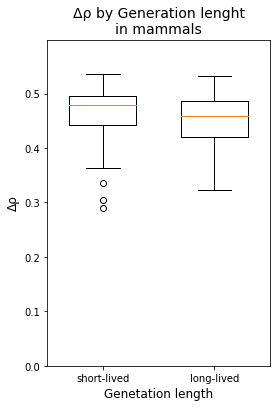

MannwhitneyuResult(statistic=3926.0, pvalue=0.06384976811820747)
SpearmanrResult(correlation=-0.11975272363165398, pvalue=0.2838901926522568)


In [9]:
q_dict_GL = {}
quartiles = 2
analysed_species = gl[(gl.Scientific_name.isin(zero_n[4]))] # (gl.Scientific_name.isin(sim_AllGenes_Shift)
multipliier = len(analysed_species) // quartiles
for quartile in [quartile for quartile in range(quartiles)]:
    q_dict_GL[quartile+1] = analysed_species.sort_values(by='GenerationLength_d').Scientific_name.values[quartile*multipliier:(quartile+1)*multipliier]
# q_dict[1]

print(len(q_dict_GL[1]))


dRhoGL_dict = {}
gen = 225
for quartile in q_dict_GL:
    vals = [deltaRho_ShiftMean[species][gen-1] for species in q_dict_GL[quartile]]
    dRhoGL_dict[quartile] = vals

fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(dRhoGL_dict.values(), widths=0.6)
ax.set_xticklabels(['short-lived', 'long-lived']) # dRhoGL_dict.keys()
plt.title('Δρ by Generation length\nin mammals', fontsize=14)
plt.xlabel('Genetation length', fontsize=12) # \'s quartiles\nshort-lived -> long-lived
plt.ylabel('Δρ', fontsize=12)
plt.ylim(bottom=0, top=0.599)
# plt.savefig(f'Course work pictures\\Results_graphs\\gl_{quartiles}.png',bbox_inches='tight')
plt.show()

print(MW(dRhoGL_dict[1], dRhoGL_dict[quartiles]))
print(spearmanr(dRhoGL_dict[1], dRhoGL_dict[quartiles]))

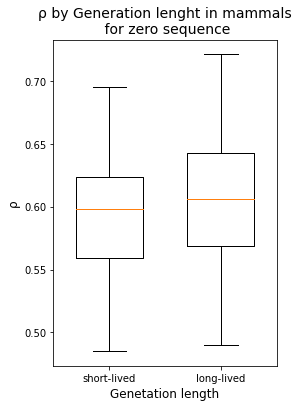

MannwhitneyuResult(statistic=2842.0, pvalue=0.08753969190560797)
SpearmanrResult(correlation=0.0734754737105604, pvalue=0.5118100286858995)


In [36]:
dRhoGL_dict = {}
gen = 1


for quartile in q_dict_GL:
    vals = [pd.read_csv(f'{result_folder}\{species}\SpearmanMean.csv', sep='\t').copy().spearman[gen-1] for species in q_dict_GL[quartile]]
    dRhoGL_dict[quartile] = vals

fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(dRhoGL_dict.values(), widths=0.6)
ax.set_xticklabels(['short-lived', 'long-lived']) # dRhoGL_dict.keys()
plt.title('ρ by Generation length in mammals\n for zero sequence', fontsize=14)
plt.xlabel('Genetation length', fontsize=12) # \'s quartiles\nshort-lived -> long-lived
plt.ylabel('ρ', fontsize=12)
# plt.ylim(bottom=0, top=0.599)
# plt.savefig(f'Course work pictures\\Results_graphs\\gl_{quartiles}.png',bbox_inches='tight')
plt.show()

print(MW(dRhoGL_dict[1], dRhoGL_dict[quartiles]))
print(spearmanr(dRhoGL_dict[1], dRhoGL_dict[quartiles]))

In [37]:
spGL_dict = {}
gen = 225
for quartile in q_dict_GL:
    vals = [spGL_dict[species][gen-1] for species in q_dict_GL[quartile]]
    spGL_dict[quartile] = vals

fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(spGL_dict.values(), widths=0.6)
ax.set_xticklabels(spGL_dict.keys()) # ['short-lived', 'long-lived']
plt.title('Spearman\'s ρ by Generation\nlength in mammals', fontsize=14)
plt.xlabel('Generation length', fontsize=12)
plt.ylabel('Spearman\'s ρ', fontsize=12)
plt.ylim(bottom=0.6, top=0.999)
# plt.savefig(f'Course work pictures\\Results_graphs\\sp_gl_{quartiles}.png',bbox_inches='tight')
plt.show()

print(spearmanr(spGL_dict[1], spGL_dict[quartiles]))

KeyError: 'Suncus_murinus'

## Fish temperature

In [92]:
ft = pd.read_csv(r'C:\Work\Lab\pr-29-trna-or-mutagenesis\raw\FishTemperature.csv', sep=' ').copy()
ft = ft.groupby('Species').mean().sort_values('Temperature')
ft.head()

,Temperature
Species,
Notothenia_coriiceps,-0.95
Pleuragramma_antarctica,-0.80
Artediellus_camchaticus,0.00
Gymnocanthus_tricuspis,1.00
Chaenocephalus_aceratus,1.00


38


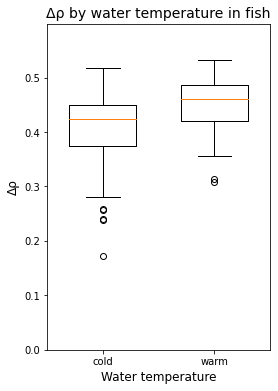

MannwhitneyuResult(statistic=454.0, pvalue=0.00545298512850621)
SpearmanrResult(correlation=0.04737936316883685, pvalue=0.777584582828455)


In [11]:
q_dict_FT = {}
quartiles = 2
analysed_species = ft[(ft.Species.isin(zero_n[4]))].groupby('Species').mean() # (ft.Species.isin(sim_AllGenes_Shift)
multipliier = len(analysed_species) // quartiles
for quartile in [quartile for quartile in range(quartiles)]:
    q_dict_FT[quartile+1] = analysed_species.sort_values(by='Temperature').index.values[quartile*multipliier:(quartile+1)*multipliier]
# q_dict

print(len(q_dict_FT[1]))

dRhoFT_dict = {}
gen = 225
for quartile in q_dict_FT:
    vals = [deltaRho_ShiftMean[species][gen-1] for species in q_dict_FT[quartile]]
    dRhoFT_dict[quartile] = vals

fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(dRhoFT_dict.values(), widths=0.6)
ax.set_xticklabels(['cold', 'warm']) # ['cold', 'warm'] or dRhoFT_dict.keys()
plt.title('Δρ by water temperature in fish', fontsize=14)
plt.xlabel('Water temperature', fontsize=12) # cool -> warm
plt.ylabel('Δρ', fontsize=12)
plt.ylim(bottom=0, top=0.599)
# plt.savefig(f'Course work pictures\\Results_graphs\\ft_{quartiles}.png',bbox_inches='tight')
plt.show()

print(MW(dRhoFT_dict[1], dRhoFT_dict[quartiles]))
print(spearmanr(dRhoFT_dict[1], dRhoFT_dict[quartiles]))

In [44]:
sp_dict = {}
p_dict = {}
for species in sim_AllGenes_Shift:
    sp = pd.read_csv(f'{result_folder}\{species}\SpearmanMean.csv', sep='\t').copy()
    sp_dict[species] = sp.pearson.values
    p_dict[species] = sp.spearman.values

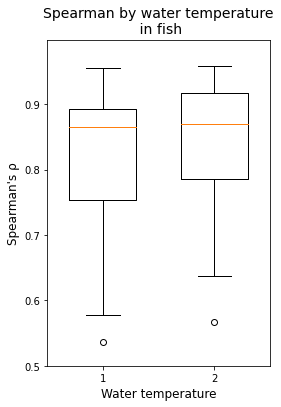

(-0.12418246433762539, 0.4056046353211045)
SpearmanrResult(correlation=-0.041049953746531, pvalue=0.7841140759947635)


In [201]:
spFT_dict = {}
gen = 225
for quartile in q_dict_FT:
    vals = [sp_dict[species][gen-1] for species in q_dict_FT[quartile]]
    spFT_dict[quartile] = vals

fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(spFT_dict.values(), widths=0.6)
ax.set_xticklabels(dRhoFT_dict.keys()) # ['cold', 'warm']
plt.title('Spearman by water temperature\n in fish', fontsize=14)
plt.xlabel('Water temperature', fontsize=12)
plt.ylabel('''Spearman's ρ''', fontsize=12)
plt.ylim(bottom=0.5, top=0.999)
plt.savefig(f'Course work pictures\\Results_graphs\\sp_ft_{quartiles}.png', bbox_inches='tight')
plt.show()

print(pearsonr(spFT_dict[1], spFT_dict[quartiles]))
print(spearmanr(spFT_dict[1], spFT_dict[quartiles]))

# Convergence time

In [39]:
# deltaRho_ShiftMean['Mus_musculus'].argmax() # a generation with the max value of deltaRho
def convergence_time_calculation(delta_rho_mean, threshold):
    '''
    Calculate convergence time for all species in 'delta_rho_mean'
    '''
    deltaRho_Mean_Time = {}
    for species in delta_rho_mean:
        plateau = 0
        for i in range(len(delta_rho_mean[species])):
            deltaRho = delta_rho_mean[species][i]
            if deltaRho > plateau*threshold:
                plateau = deltaRho
                converge_gen = i
        # converge_gen = np.where(deltaRho_ShiftMean[species] == plateau)[0][0] # np.where gives a tuple with an array within
        deltaRho_Mean_Time[species] = converge_gen
    return deltaRho_Mean_Time

## WC-blood

In [12]:
warm_cold_dict_T = {'cold-blood':[], 'warm-blood':[]}
for species in cold_blood:
    warm_cold_dict_T['cold-blood'].append(deltaRho_ShiftMean_Time[species])
for species in warm_blood:
    warm_cold_dict_T['warm-blood'].append(deltaRho_ShiftMean_Time[species])

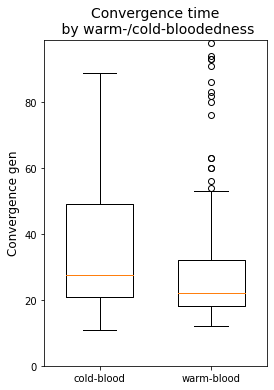

MannwhitneyuResult(statistic=19343.0, pvalue=0.00013284409520286606)


In [13]:
fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(warm_cold_dict_T.values(), widths=0.6)
ax.set_xticklabels(warm_cold_dict_T.keys())
plt.title('Convergence time\n by warm-/cold-bloodedness', fontsize=14)
# plt.xlabel('Class', fontsize=12)
plt.ylim(bottom=0, top=99)
plt.ylabel('Convergence gen', fontsize=12)
# plt.savefig('Course work pictures\\Results_graphs\\CT_WC-blood.png')
plt.show()

print(MW(warm_cold_dict_T['cold-blood'], warm_cold_dict_T['warm-blood']))

## GL

82


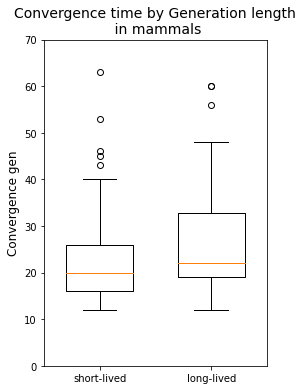

MannwhitneyuResult(statistic=2581.0, pvalue=0.010122970889136126)
SpearmanrResult(correlation=0.044242424766523715, pvalue=0.6930827017689598)


In [14]:
q_dict_GL = {}
quartiles = 2
analysed_species = gl[(gl.Scientific_name.isin(zero_n[4]))] # (gl.Scientific_name.isin(sim_AllGenes_Shift)
multipliier = len(analysed_species) // quartiles
for quartile in [quartile for quartile in range(quartiles)]:
    q_dict_GL[quartile+1] = analysed_species.sort_values(by='GenerationLength_d').Scientific_name.values[quartile*multipliier:(quartile+1)*multipliier]
# q_dict[1]

print(len(q_dict_GL[1]))

dRhoGL_dict_T = {}
for quartile in q_dict_GL:
    vals = [deltaRho_ShiftMean_Time[species] for species in q_dict_GL[quartile]]
    dRhoGL_dict_T[quartile] = vals
# print(dRhoGL_dict_T)
    
fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(dRhoGL_dict_T.values(), widths=0.6)
ax.set_xticklabels(['short-lived', 'long-lived']) # dRhoGL_dict_T.keys() ['short-lived', 'long-lived']
# ax.violinplot(dRhoGL_dict_T.values(), widths=0.6)
plt.title('Convergence time by Generation length\n in mammals', fontsize=14)
# plt.xlabel('Genetation length\'s quartiles\nshort-lived -> long-lived', fontsize=12) # \'s quartiles
plt.ylabel('Convergence gen', fontsize=12)
plt.ylim(bottom=0, top=70)
# plt.savefig(f'Course work pictures\\Results_graphs\\CT_gl.png',bbox_inches='tight')
plt.show()

print(MW(dRhoGL_dict_T[1], dRhoGL_dict_T[quartiles]))
print(spearmanr(dRhoGL_dict_T[1], dRhoGL_dict_T[quartiles]))

## FT

38


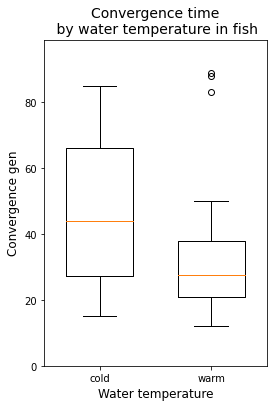

MannwhitneyuResult(statistic=967.5, pvalue=0.010868813918505388)
SpearmanrResult(correlation=0.07611270132906496, pvalue=0.6497016702198524)


In [15]:
q_dict_FT = {}
quartiles = 2
analysed_species = ft[(ft.Species.isin(zero_n[4]))].groupby('Species').mean() # (ft.Species.isin(sim_AllGenes_Shift)
multipliier = len(analysed_species) // quartiles
for quartile in [quartile for quartile in range(quartiles)]:
    q_dict_FT[quartile+1] = analysed_species.sort_values(by='Temperature').index.values[quartile*multipliier:(quartile+1)*multipliier]
# q_dict

print(len(q_dict_FT[1]))

dRhoFT_dict_T = {}
for quartile in q_dict_FT:
    vals = [deltaRho_ShiftMean_Time[species] for species in q_dict_FT[quartile]]
    dRhoFT_dict_T[quartile] = vals


    
fig, ax = plt.subplots(figsize=(4, 6))
ax.boxplot(dRhoFT_dict_T.values(), widths=0.6)
ax.set_xticklabels(['cold', 'warm']) # ['cold', 'warm'] or dRhoFT_dict_T.keys()
plt.title('Convergence time\n by water temperature in fish', fontsize=14)
plt.xlabel('Water temperature', fontsize=12) # \'s quartiles\n cool -> warm
plt.ylabel('Convergence gen', fontsize=12)
plt.ylim(bottom=0, top=99)
# plt.savefig(f'Course work pictures\\Results_graphs\\CT_ft.png',bbox_inches='tight')
plt.show()

print(MW(dRhoFT_dict_T[1], dRhoFT_dict_T[quartiles]))
print(spearmanr(dRhoFT_dict_T[1], dRhoFT_dict_T[quartiles]))

## All in one

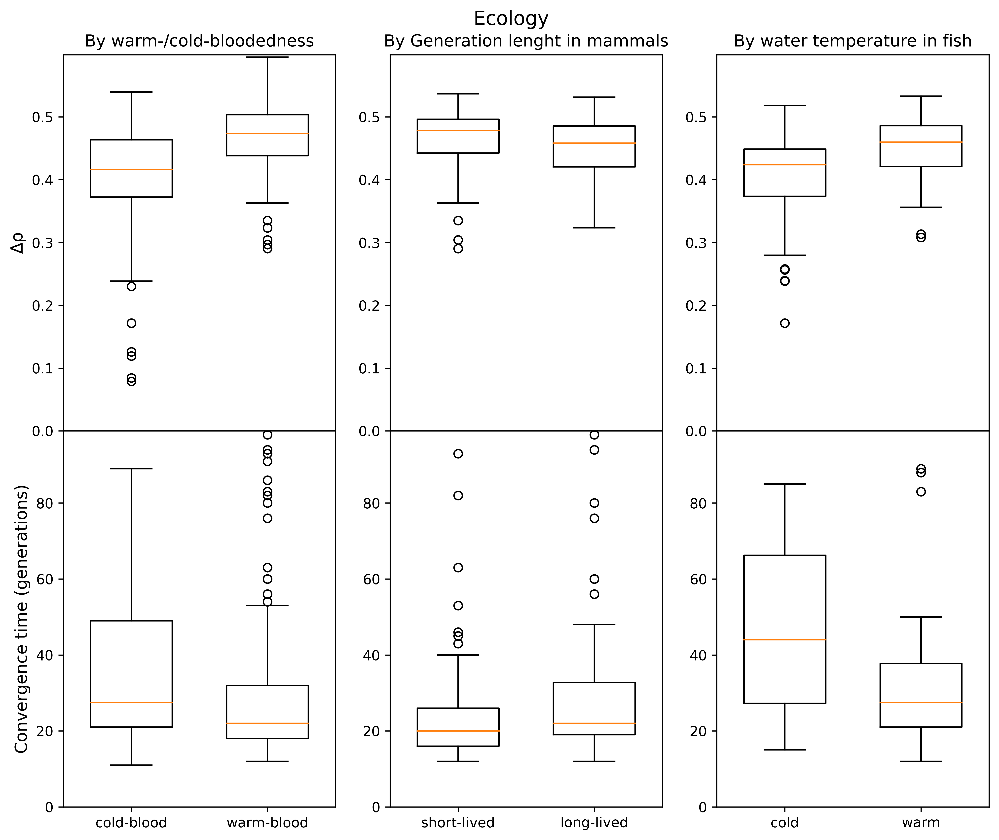

In [16]:
# fig, axs = plt.subplots(nrows=2, ncols=3, sharex=False, figsize=(12, 10), dpi=600)

fig = plt.figure(figsize=(12, 10), dpi=600)
gs = fig.add_gridspec(nrows=2, ncols=3, hspace=0) # , hspace=0, wspace=0
axs = gs.subplots() # , sharex='row', sharey='row'

fig.suptitle('Ecology', y=0.925, fontsize=14)

axs[0,0].boxplot(warm_cold_dict.values(), widths=0.6)
axs[0,0].set_xticklabels(['', ''])
axs[0,0].set_title('By warm-/cold-bloodedness', fontsize=12) # Δρ by warm-/cold-bloodedness
axs[0,0].set_ylabel('Δρ', fontsize=12)
axs[0,0].set_ylim(bottom=0, top=0.599)
# axs[0,0].sharex(axs[1, 0])

axs[1,0].boxplot(warm_cold_dict_T.values(), widths=0.6)
axs[1,0].set_xticklabels(warm_cold_dict_T.keys())
# axs[1,0].set_title('Convergence time\n by warm-/cold-bloodedness', fontsize=12)
# plt.xlabel('Class', fontsize=12)
axs[1,0].set_ylim(bottom=0, top=99)
axs[1,0].set_ylabel('Convergence time (generations)', fontsize=12)

axs[0,1].boxplot(dRhoGL_dict.values(), widths=0.6)
# axs[0,1].set_xticklabels(['', '']) # dRhoGL_dict.keys()
axs[0,1].set_title('By Generation length in mammals', fontsize=12) # Δρ by Generation length\nin mammals
# axs[0,1].set_xlabel('Genetation length', fontsize=10) # \'s quartiles\nshort-lived -> long-lived
# axs[0,1].set_ylabel('Δρ', fontsize=12)
axs[0,1].set_ylim(bottom=0, top=0.599)

axs[1,1].boxplot(dRhoGL_dict_T.values(), widths=0.6)
axs[1,1].set_xticklabels(['short-lived', 'long-lived']) # dRhoGL_dict_T.keys() ['short-lived', 'long-lived']
# axs[1,1].set_title('Convergence time by Generation\nlength in mammals', fontsize=12)
# plt.xlabel('Genetation length\'s quartiles\nshort-lived -> long-lived', fontsize=12) # \'s quartiles
# axs[1,1].set_ylabel('Convergence gen', fontsize=10)
axs[1,1].set_ylim(bottom=0, top=99)

axs[0,2].boxplot(dRhoFT_dict.values(), widths=0.6)
axs[0,2].set_xticklabels(['', '']) # ['cold', 'warm'] or dRhoFT_dict.keys()
axs[0,2].set_title('By water temperature in fish', fontsize=12) # Δρ by water temperature in fish
# axs[0,2].set_xlabel('Water temperature', fontsize=12) # cool -> warm
# axs[0,2].set_ylabel('Δρ', fontsize=12)
axs[0,2].set_ylim(bottom=0, top=0.599)

axs[1,2].boxplot(dRhoFT_dict_T.values(), widths=0.6)
axs[1,2].set_xticklabels(['cold', 'warm']) # ['cold', 'warm'] or dRhoFT_dict_T.keys()
# axs[1,2].set_title('Convergence time\n by water temperature in fish', fontsize=12)
# axs[1,2].set_xlabel('Water temperature', fontsize=12) # \'s quartiles\n cool -> warm
# axs[1,2].set_ylabel('Convergence gen', fontsize=12)
axs[1,2].set_ylim(bottom=0, top=99)

# fig.supylabel('down            up', fontsize=14) # , y=0.3
plt.savefig('Course work pictures\\Results_graphs\\Total ecology.pdf', bbox_inches='tight')
plt.show()

In [33]:
import shutil
for folder in ['Amblyrhynchus_cristatus', 'Anas_crecca', 'Anguilla_japonica', 'Anguilla_malgumora', 
                'Bagarius_yarrelli', 'Bipes_biporus', 'Blanus_cinereus', 'Channa_marulius', 'Crocidura_orientalis', 'Crocuta_crocuta', 
                'Eptesicus_serotinus', 'Eurycea_bislineata', 'Gloydius_saxatilis', 'Hippocampus_erectus', 'Hypomesus_olidus',
                'Marmota_himalayana', 'Metachirus_nudicaudatus', 'Moschus_berezovskii', 'Scaphirhynchus_platorynchus', 'Tonatia_saurophila', 
                'Tor_khudree']:
    shutil.rmtree(f'Practice/Results_AllGenes_shift/{folder}')

# Codons by frequency changing 

AAA    0.026238
AAC    0.064486
AAG        2.65
AAT    0.123214
ACA    0.090764
         ...   
TGT    0.683333
TTA    0.308772
TTC    0.053759
TTG    0.128571
TTT    0.072959
Name: Mus_musculus, Length: 64, dtype: object

In [3]:
CodonChanging = pd.DataFrame(index=sim_AllGenes_Shift, columns=['AAA', 'AAC', 'AAG', 'AAT', 'ACA', 'ACC', 'ACG', 'ACT', 'AGA', 'AGC',
       'AGG', 'AGT', 'ATA', 'ATC', 'ATG', 'ATT', 'CAA', 'CAC', 'CAG', 'CAT',
       'CCA', 'CCC', 'CCG', 'CCT', 'CGA', 'CGC', 'CGG', 'CGT', 'CTA', 'CTC',
       'CTG', 'CTT', 'GAA', 'GAC', 'GAG', 'GAT', 'GCA', 'GCC', 'GCG', 'GCT',
       'GGA', 'GGC', 'GGG', 'GGT', 'GTA', 'GTC', 'GTG', 'GTT', 'TAA', 'TAC',
       'TAG', 'TAT', 'TCA', 'TCC', 'TCG', 'TCT', 'TGA', 'TGC', 'TGG', 'TGT',
       'TTA', 'TTC', 'TTG', 'TTT'])

for species in sim_AllGenes_Shift:
    freq_table = pd.read_csv(f'{result_folder}\{species}\FrequenciesMean.csv'.format(species), sep='\t').copy()
    codon_freq_0 = {}
    codon_freq_225 = {} # {codon:codon_frequency for codon in freq_table.columns for codon_frequency in freq_table.iloc[224]}
    for i in range(64):
        codon_freq_0[freq_table.columns[i]] = freq_table.iloc[1][i]
        codon_freq_225[freq_table.columns[i]] = freq_table.iloc[225][i]
    codon_changing = {}
    codon_changing_percentage = {}
    for codon in codon_freq_0:
        if codon in unambiguous_dna_by_id[table].stop_codons:
            codon_changing[codon] = 0
            codon_changing_percentage[codon] = 0
            continue
        codon_changing[codon] = codon_freq_0[codon] - codon_freq_225[codon]
        codon_changing_percentage[codon] = (codon_freq_0[codon] - codon_freq_225[codon]) / codon_freq_0[codon]

    CodonChanging.loc[species] = list(codon_changing_percentage.values())

In [82]:
CodonChanging = CodonChanging.convert_dtypes()
CodonChanging.to_csv('CodonChanging.csv', sep='\t', index=False)

In [3]:
CodonChanging = pd.read_csv('CodonChanging.csv', sep='\t').copy()
CodonChanging.head()

,Species,AAA,AAC,AAG,AAT,ACA,ACC,ACG,ACT,AGA,...,TCG,TCT,TGA,TGC,TGG,TGT,TTA,TTC,TTG,TTT
0,Abbottina_rivularis,-0.799266,-0.301760,0.878869,0.308483,-1.627401,0.366135,0.847128,0.576238,0,...,0.855051,0.632603,-1.163366,-0.685864,0.896947,0.453287,-0.279446,-0.575578,0.928839,0.457070
1,Abramis_brama,-0.690977,0.997403,0.786217,-1.006114,-1.538128,1.000000,0.677355,0.146452,0,...,0.618026,0.067974,-0.887558,0.996000,0.792593,-1.185714,-4.100550,0.998017,0.524922,-2.230428
2,Abudefduf_vaigiensis,-0.678571,-0.730476,0.703704,0.594574,-0.524537,-0.928712,0.869339,0.333057,0,...,0.828169,0.436813,-0.773684,-0.458955,0.747458,0.530172,0.497400,-0.630149,0.916749,0.577354
3,Acanthogobius_hasta,-0.630065,-0.412844,0.674126,0.468750,-0.656740,-0.719374,0.680207,0.458768,0,...,0.762677,0.053333,-0.780795,-0.255385,0.700609,0.353191,0.418296,-0.520242,0.859163,0.496668
4,Acanthopagrus_schlegelii,-0.479167,-0.210117,0.851852,0.271357,0.222441,-1.468439,0.975446,-0.290000,0,...,0.954967,0.007682,-0.896341,-0.246429,0.909011,0.345000,0.493317,-0.257962,0.968114,0.313346


In [11]:
CodonChanging[CodonChanging.Species == 'Abramis_brama'].iloc[0][1:].abs().sort_values(ascending=False)

4.100550275137582

In [ ]:
dict(sorted(codon_changing_percentage.items(), key=lambda item: item[1], reverse=True))

{'AAG': 2.650000000000163,
 'AGT': 1.8090909090910106,
 'CCG': 1.5,
 'GGG': 0.8025000000000151,
 'TGT': 0.6833333333334719,
 'CTG': 0.6666666666666711,
 'TCG': 0.5833333333334235,
 'ATG': 0.5782608695652242,
 'ATC': 0.5474452554744509,
 'CTC': 0.5351562499999942,
 'GAG': 0.5333333333333093,
 'GTG': 0.5142857142857291,
 'CGG': 0.5000000000000603,
 'TGG': 0.3900000000000694,
 'GCC': 0.35722891566265413,
 'GCA': 0.3484042553191447,
 'GTT': 0.3447368421052585,
 'ATT': 0.3409090909090917,
 'CCC': 0.33382352941176685,
 'TTA': 0.30877192982456214,
 'AGC': 0.29142857142857853,
 'CGT': 0.2687499999999734,
 'ACG': 0.2399999999999536,
 'TGC': 0.22777777777776553,
 'GGC': 0.2205128205128333,
 'CCT': 0.21607142857142475,
 'GTA': 0.21159420289855146,
 'TCA': 0.19517241379310088,
 'TAT': 0.18928571428571675,
 'GGT': 0.1884615384615273,
 'CAG': 0.1833333333333512,
 'TAC': 0.17666666666666928,
 'TCT': 0.17125000000000748,
 'CCA': 0.15813953488372248,
 'CTT': 0.15416666666666393,
 'CAT': 0.1426470588235

In [18]:
for most_changed_codon in CodonChanging.mean().nlargest(10).index:
    print(most_changed_codon)
print('\n')
for most_changed_codon in CodonChanging.mean().nsmallest(10).index:
    print(most_changed_codon)

TTG
GAG
GGG
GCG
GTG
AAG
ATG
CGG
TGG
TCG


CTA
CGA
GTA
GGA
GCA
CCA
ACA
TCA
TGA
AAA


C:\Users\D2B0~1\AppData\Local\Temp/ipykernel_16140/2446823529.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  for most_changed_codon in CodonChanging.mean().nlargest(10).index:
C:\Users\D2B0~1\AppData\Local\Temp/ipykernel_16140/2446823529.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  for most_changed_codon in CodonChanging.mean().nsmallest(10).index:


# Codon cognation

In [11]:
trna = pd.read_csv('Practice/TRNASpeciesandGibbs.txt', sep='\t').copy()
trna.head()

,trna,species,id,parameter,anticodon,sequence,SecondaryStructure,GibbsEnergy,GenerationLength_d,LongLived,TimeBeingSingleStrangedForAll,GeneCodedOnLightChain
0,Ala,Bos_javanicus,mtdbD00000358,9906,TGC,GAGGAUUUAGCUUAAUUAAAGUGGUUGAUUUGCAUUCAAUUGAUGU...,((((((...((((.....))))((((((.......))))))..(((...,-12.8,3285.0000,1,16437,1
1,Ala,Artibeus_jamaicensis,mtdbD00005138,9417,TGC,AAGGGCUUAGCUUAAUUAAAGUAGUUGAUUUGCAUUCAGCAGAUGU...,((((((((((((..........)))))((((((.....))))))((...,-18.7,1920.4777,1,16437,1
2,Ala,Tursiops_aduncus,mtdbD00001302,79784,TGC,GAGGAUUUAGCUUAAUUAAAGUGUUUGAUUUGCAUUCAAUUGAUGU...,((((((.....((((((..(((((.......))))).))))))(((...,-13.8,6427.8800,1,16437,1
3,Ala,Acinonyx_jubatus,mtdbD00000446,32536,TGC,GAGGACUUAGCUUAAUUAAAGUGUUUGAUUUGCAGUCAAUUGAUGU...,(((((((..((..(((((((...))))))).)).(((....)))((...,-15.6,2190.0000,1,16437,1
4,Ala,Vombatus_ursinus,mtdbD00002685,29139,TGC,GAGAAUUUAGCUUAAUUAAAGUAUUCGAUUUGCGUUCGGAUGAUGC...,(((((((.(((((.(((....(((((((.......))))))).......,-13.8,3542.0140,1,16437,1


In [30]:
outs = []
for species in zero_n[4]:
    if species in set(trna.species):
        outs.append(species)
len(outs)

55

In [18]:
from Bio import SeqIO

records = list(SeqIO.parse("Practice/MammallianTrnasFasta.fst", "fasta"))

In [29]:
cross = set()
for i in range(len(records)):
    species = records[i].id.split('|')[1]
    if species in zero_n[4]:  # ['mtdbD00000446', 'Acinonyx_jubatus', '32536', 'Ala', 'TGC']
        cross.add(species)
len(cross)

63

# Supplements

In [103]:
# Species, MutSpec(12 col), Gene, Codon usage(64 col), Ecology(GenLength, WaterTemp), final Δρ
Suppl_table = pd.DataFrame(columns=['Species', 'A>T', 'A>G', 'A>C', 'T>A', 'T>G', 'T>C', 'G>A', 'G>T', 'G>C', 'C>A', 'C>T', 'C>G',
                                   'AAA', 'AAC', 'AAG', 'AAT', 'ACA', 'ACC', 'ACG', 'ACT', 'AGA', 'AGC', 'AGG', 'AGT', 'ATA', 'ATC', 
                                   'ATG', 'ATT', 'CAA', 'CAC', 'CAG', 'CAT', 'CCA', 'CCC', 'CCG', 'CCT', 'CGA', 'CGC', 'CGG', 'CGT',
                                   'CTA', 'CTC', 'CTG', 'CTT', 'GAA', 'GAC', 'GAG', 'GAT', 'GCA', 'GCC', 'GCG', 'GCT', 'GGA', 'GGC', 
                                   'GGG', 'GGT', 'GTA', 'GTC', 'GTG', 'GTT', 'TAA', 'TAC', 'TAG', 'TAT', 'TCA', 'TCC', 'TCG', 'TCT',
                                   'TGA', 'TGC', 'TGG', 'TGT', 'TTA', 'TTC', 'TTG', 'TTT', 'GenLength', 'WaterTemp', 'final Δρ'])

# species = 'Mus_musculus'
for species in sim_AllGenes_Shift:
    mutspec = ms[ms.Species == species].values[0][1:] # array 
    codons = ['AAA', 'AAC', 'AAG', 'AAT', 'ACA', 'ACC', 'ACG', 'ACT',
           'AGA', 'AGC', 'AGG', 'AGT', 'ATA', 'ATC', 'ATG', 'ATT', 'CAA', 'CAC',
           'CAG', 'CAT', 'CCA', 'CCC', 'CCG', 'CCT', 'CGA', 'CGC', 'CGG', 'CGT',
           'CTA', 'CTC', 'CTG', 'CTT', 'GAA', 'GAC', 'GAG', 'GAT', 'GCA', 'GCC',
           'GCG', 'GCT', 'GGA', 'GGC', 'GGG', 'GGT', 'GTA', 'GTC', 'GTG', 'GTT',
           'TAA', 'TAC', 'TAG', 'TAT', 'TCA', 'TCC', 'TCG', 'TCT', 'TGA', 'TGC',
           'TGG', 'TGT', 'TTA', 'TTC', 'TTG', 'TTT']
    codonusage_df = pd.read_csv('Practice/CodonUsageSummary.csv', sep='\t').copy()
    codonusage = codonusage_df[codonusage_df.Species == species].values[0][1:-1]
    if species in gl.Scientific_name.values:
        genlength = float(gl[gl.Scientific_name == species]['GenerationLength_d'].values[0])
    else: 
        genlength = pd.NA
    if species in ft.Species.values:
        fishtemp = float(ft[ft.Species == species].groupby('Species').mean().iloc[0].values[0])
    else: 
        fishtemp = pd.NA
    finaldeltarho = float(deltaRho_ShiftMean[species][224])
    row = [species] + list(mutspec) + list(codonusage) + [genlength] + [fishtemp] + [finaldeltarho]
    Suppl_table.loc[len(Suppl_table)] = row
Suppl_table

,Species,A>T,A>G,A>C,T>A,T>G,T>C,G>A,G>T,G>C,...,TGC,TGG,TGT,TTA,TTC,TTG,TTT,GenLength,WaterTemp,final Δρ
0,Abbottina_rivularis,0.011369,0.028350,0.013839,0.059072,0.007981,0.128591,0.473568,0.051221,0.079542,...,12,24,12,100,113,11,97,NaN,NaN,0.390678
1,Abramis_brama,0.014698,0.073491,0.000000,0.044764,0.000000,0.000000,0.622380,0.000000,0.000000,...,12,9,11,111,121,11,98,NaN,6.922727,-0.130835
2,Abudefduf_vaigiensis,0.000000,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,...,19,12,6,58,148,8,83,NaN,27.0,0.485345
3,Acanthogobius_hasta,0.014626,0.106742,0.044787,0.000000,0.023947,0.062424,0.596688,0.050615,0.000000,...,17,17,11,76,96,16,124,NaN,<NA>,0.410564
4,Acanthopagrus_schlegelii,0.090170,0.011128,0.064126,0.065980,0.006766,0.196450,0.225208,0.106133,0.105267,...,18,13,6,96,128,12,101,NaN,<NA>,0.428413
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555,Viverricula_indica,0.006343,0.014951,0.002287,0.015717,0.004829,0.145174,0.620724,0.014263,0.044240,...,15,3,6,151,117,7,109,1658.835,<NA>,0.488851
556,Vulpes_vulpes,0.002086,0.082425,0.002556,0.020244,0.000000,0.203006,0.498892,0.011867,0.014301,...,17,11,5,83,133,22,83,2105.3972,<NA>,0.423149
557,Vulpes_zerda,0.084571,0.000000,0.000000,0.127185,0.000000,0.254370,0.273448,0.000000,0.000000,...,17,10,5,85,139,21,76,1878.788155,<NA>,0.361424
558,Xiphias_gladius,0.002361,0.128887,0.007451,0.009377,0.004689,0.126679,0.643480,0.008959,0.008959,...,19,22,3,55,137,8,86,<NA>,20.6125,0.361433


In [105]:
Suppl_table.to_csv('Course work pictures\Suppl_table.csv', index=False)

In [5]:
Supplement = pd.read_csv('Course work pictures\Suppl_table.csv').copy()
Supplement.head()

,Species,A>T,A>G,A>C,T>A,T>G,T>C,G>A,G>T,G>C,...,TGC,TGG,TGT,TTA,TTC,TTG,TTT,GenLength,WaterTemp,final Δρ
0,Abbottina_rivularis,0.011369,0.028350,0.013839,0.059072,0.007981,0.128591,0.473568,0.051221,0.079542,...,12,24,12,100,113,11,97,NaN,NaN,0.390678
1,Abramis_brama,0.014698,0.073491,0.000000,0.044764,0.000000,0.000000,0.622380,0.000000,0.000000,...,12,9,11,111,121,11,98,NaN,6.922727,-0.130835
2,Abudefduf_vaigiensis,0.000000,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,...,19,12,6,58,148,8,83,NaN,27.000000,0.485345
3,Acanthogobius_hasta,0.014626,0.106742,0.044787,0.000000,0.023947,0.062424,0.596688,0.050615,0.000000,...,17,17,11,76,96,16,124,NaN,NaN,0.410564
4,Acanthopagrus_schlegelii,0.090170,0.011128,0.064126,0.065980,0.006766,0.196450,0.225208,0.106133,0.105267,...,18,13,6,96,128,12,101,NaN,NaN,0.428413


# Comparison simulations with and without selection

## WCF share

In [2]:
ac_codon_dict_full = {'Phe': 'TTC', 'Leu2': 'TTA', 'Ser2': 'TCA', 'Tyr': 'TAC', 'Cys': 'TGC', 'Trp': 'TGA', 'Leu1': 'CTA', 'Pro': 'CCA', 'His': 'CAC', 'Gln': 'CAA', 'Arg': 'CGA', 'Ile': 'ATC', 'Met': 'ATG', 'Thr': 'ACA', 'Asn': 'AAC', 'Ser1': 'AGC', 'Val': 'GTA', 'Ala': 'GCA', 'Asp': 'GAC', 'Glu': 'GAA', 'Gly': 'GGA', 'Lys': 'AAA'}

def wcf_share_calculation(freq_df_path, mode):
    '''
    Calculate a share of WCF codons

    Modes:
        'Total': Returns an array with the share among all 64 codons
        'Avg': Returns an array with the average share among 22 fractions for every amino acid family
        'Per aa': Returns a dict of arrays that contains the fractions for every amino acid family
    '''
    freq_df = pd.read_csv(f'{freq_df_path}', sep='\t').copy()
    if mode == 'Total':
        freq_df_wcf = freq_df.loc[1:,ac_codon_dict_full.values()]
        wcf_codons_freq = freq_df_wcf.sum(axis=1)
    if mode == 'Avg':
        wcf_codons_freq = 0
        for amino_acid in aa_dict:
            if amino_acid == 'Xaa':
                continue
            freq_df_aa = freq_df.loc[1:,aa_dict[amino_acid]]
            wcf_codon_freq_aa = freq_df_aa[ac_codon_dict_full[amino_acid]] / freq_df_aa.sum(axis=1)
            wcf_codons_freq += wcf_codon_freq_aa
        wcf_codons_freq /= len(aa_dict)
    if mode == 'Per aa':
        wcf_codons_freq = {}
        for amino_acid in aa_dict:
            if amino_acid == 'Xaa':
                continue
            freq_df_aa = freq_df.loc[1:,aa_dict[amino_acid]]
            wcf_codon_freq_aa = freq_df_aa[ac_codon_dict_full[amino_acid]] / freq_df_aa.sum(axis=1)
            wcf_codons_freq[amino_acid] = wcf_codon_freq_aa
    return wcf_codons_freq

def observed_wcf_share_calculation(freq_df_path):
    freq_df = pd.read_csv(f'{freq_df_path}', sep='\t').copy()
    freq_df_wcf = freq_df.loc[0, ac_codon_dict_full.values()]
    observed_wcf_codons_freq = freq_df_wcf.sum()
    return observed_wcf_codons_freq

## Not None

In [19]:
result_folder = 'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(short list) not None'
short_species_list = ['Mus_musculus', 'Rattus_rattus', 'Felis_catus', 'Homo_sapiens']
coefficients_list = np.arange(0, 0.31, 0.05).round(2)
delta_rho_mean_coefs = {coefficient:delta_rho_mean_calculation(f'{result_folder}\{coefficient}') for coefficient in coefficients_list}

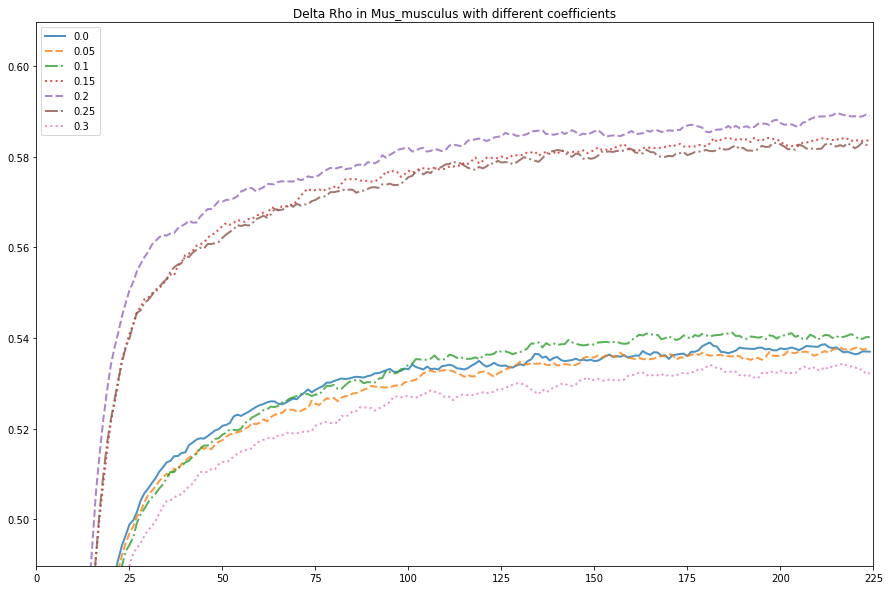

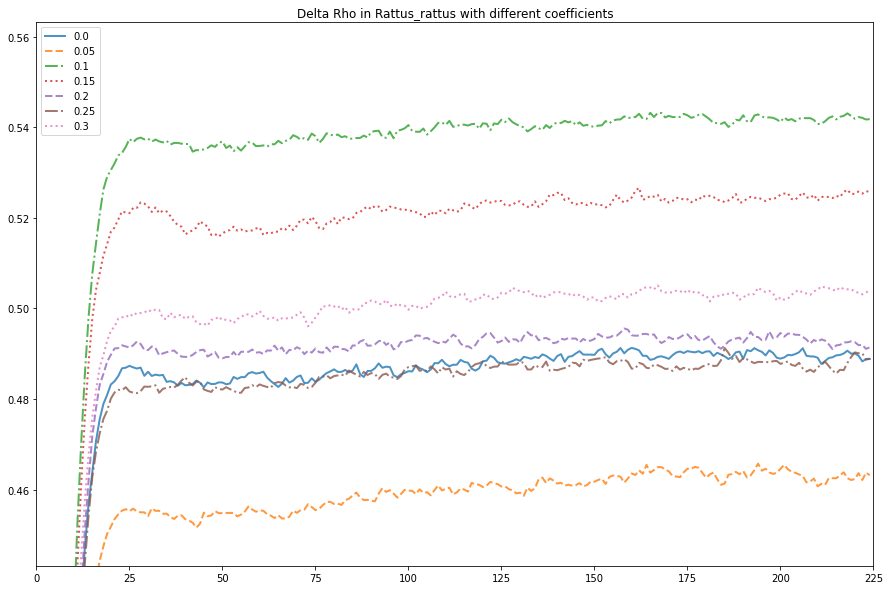

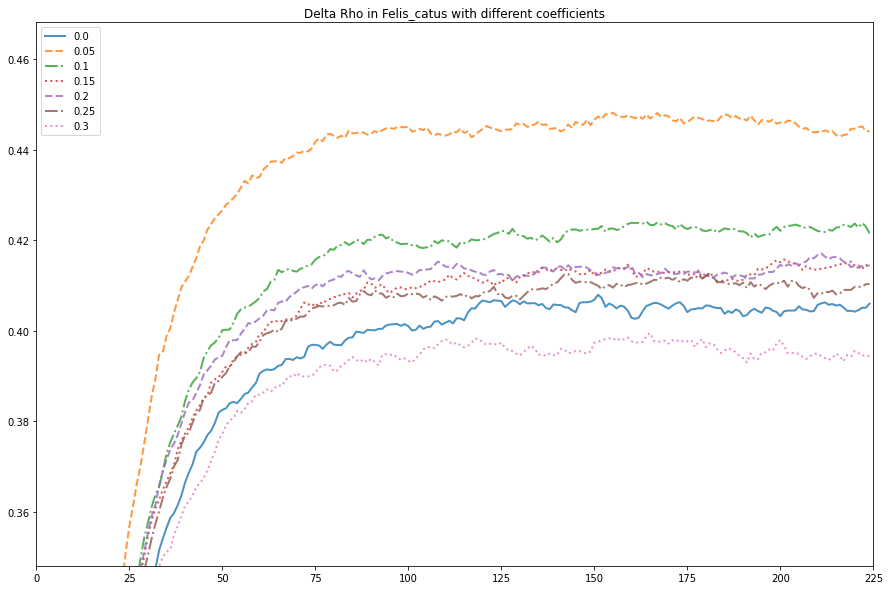

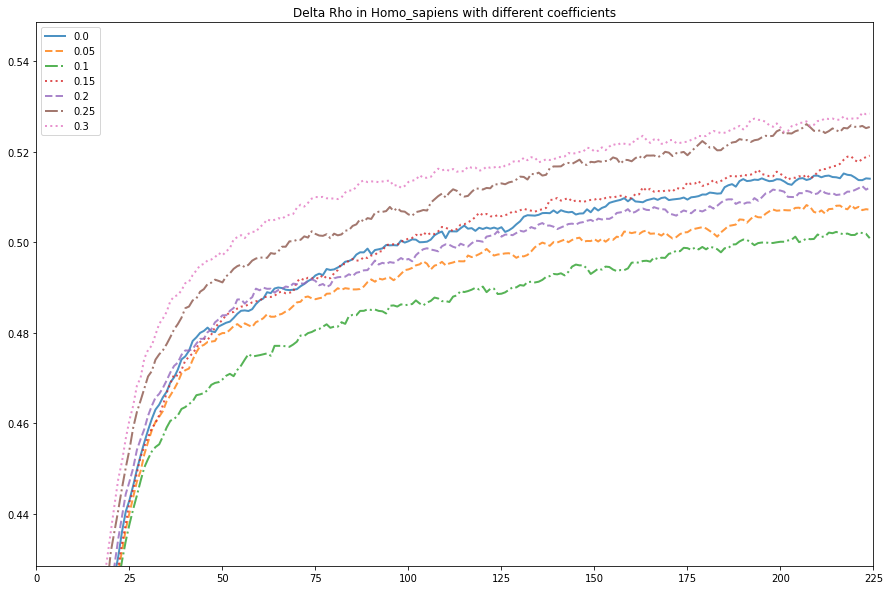

In [11]:
# delta Rhos
lines = ['-', '--', '-.', ':', '--', '-.', ':']
for species in short_species_list:
    plt.figure(figsize=(15, 10), facecolor='white')
    ylim = 0
    for i, coefficient in enumerate(coefficients_list):
        # paint_delta_rhos(delta_rho_mean_coefs[coefficient], f'Delta Rho with {coefficient} coef', y_lim=(0, 0.65), by_classes=False)
        if max(delta_rho_mean_coefs[coefficient][species]) > ylim:
            ylim = max(delta_rho_mean_coefs[coefficient][species])
        plt.plot(delta_rho_mean_coefs[coefficient][species], label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
        # plt.annotate(f'{coefficient}',
        #     xy=(200, ylim), xycoords='data',
        #     xytext=(1.5, 1.5), textcoords='offset points')
    # plt.ylim(ylim-0.1, ylim+0.02)
    plt.xlim(0, 225)
    plt.title(f'Delta Rho in {species} with different coefficients')
    plt.legend(loc='upper left', fontsize=10)
    plt.show()

In [69]:
# Rho
last_rhos_list = []
for species in short_species_list:
    spearman_vals_sp = []
    for coefficient in coefficients_list:
        spearman_df = pd.read_csv(f'{result_folder}\{coefficient}\{species}\SpearmanMean.csv', sep='\t').copy()
        spearman_val = spearman_df.iat[len(spearman_df)-1, 0]
        spearman_vals_sp.append(spearman_val)
    last_rhos_list.append(spearman_vals_sp)
spearman_table = pd.DataFrame(data=last_rhos_list, index=short_species_list, columns=coefficients_list)
spearman_table

,0.00,0.05,0.10,0.15,0.20,0.25,0.30
Mus_musculus,0.974806,0.975699,0.973111,0.975401,0.976615,0.975516,0.975951
Rattus_rattus,0.925757,0.925207,0.926650,0.925047,0.926775,0.927910,0.926604
Felis_catus,0.946304,0.942159,0.950758,0.946579,0.950220,0.946121,0.943052
Homo_sapiens,0.974611,0.973420,0.971473,0.972687,0.971954,0.969687,0.973214


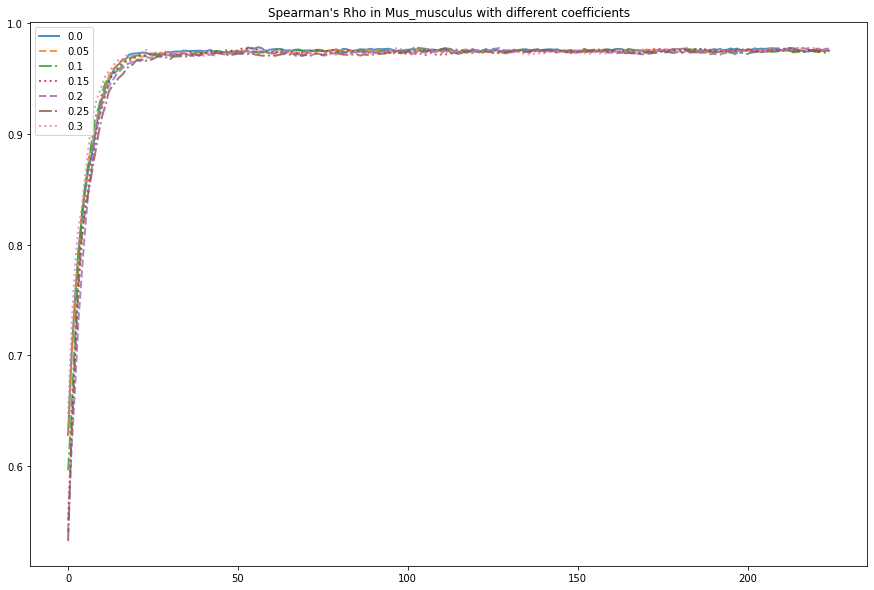

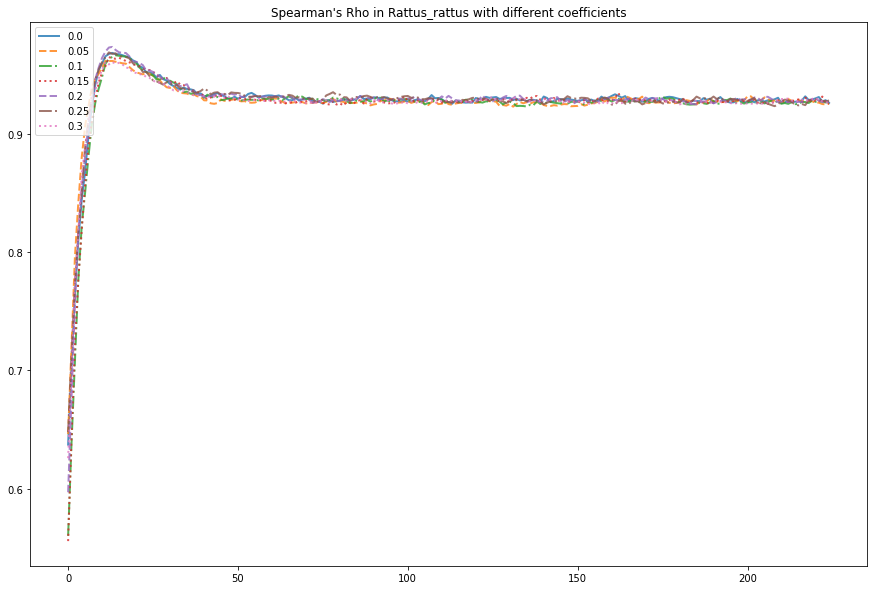

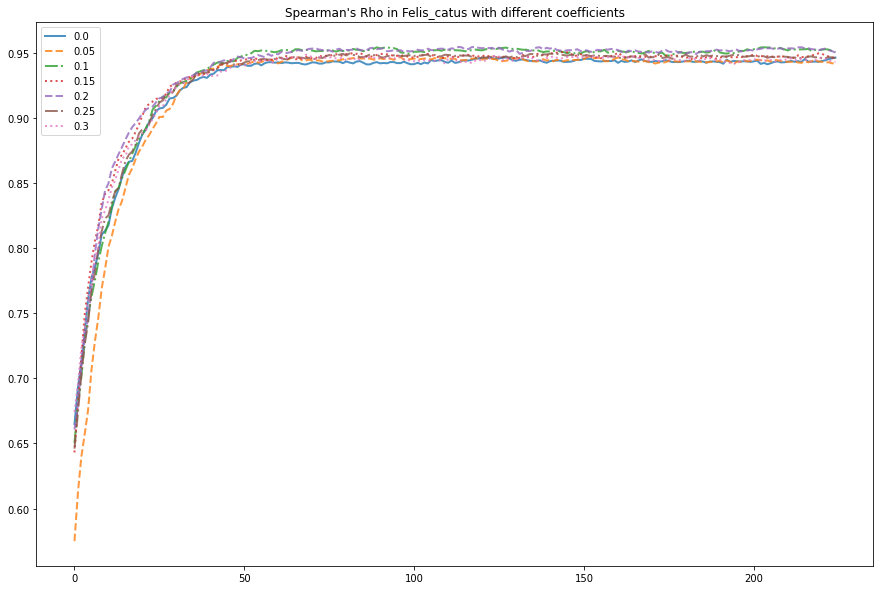

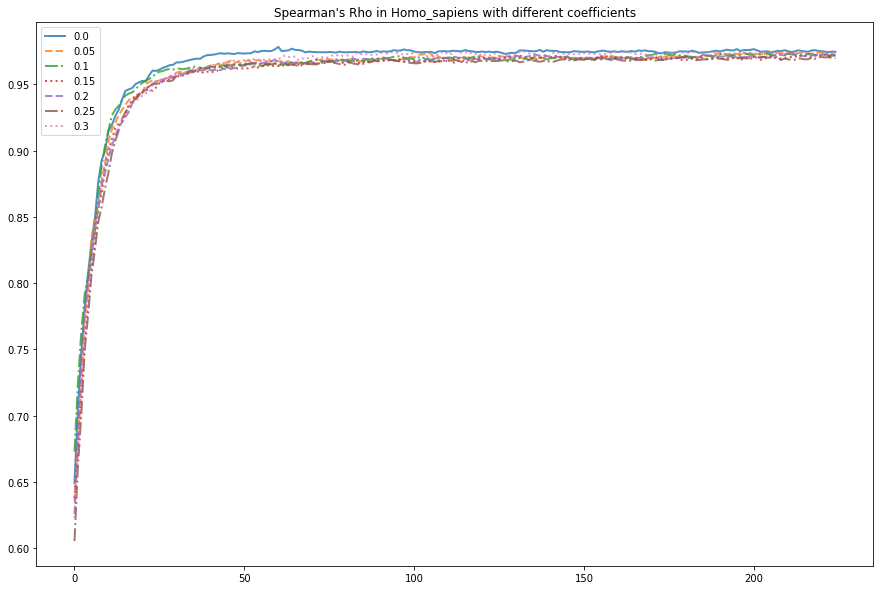

In [12]:
lines = ['-', '--', '-.', ':', '--', '-.', ':']
for species in short_species_list:
    plt.figure(figsize=(15, 10), facecolor='white')
    ylim = 0
    for i, coefficient in enumerate(coefficients_list):
        spearman_df = pd.read_csv(f'{result_folder}\{coefficient}\{species}\SpearmanMean.csv', sep='\t').copy()
        # if max(delta_rho_mean_coefs[coefficient][species]) > ylim:
        #     ylim = max(delta_rho_mean_coefs[coefficient][species])
        plt.plot(spearman_df.spearman, label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
        # plt.annotate(f'{coefficient}',
        #     xy=(200, ylim), xycoords='data',
        #     xytext=(1.5, 1.5), textcoords='offset points')
    # plt.ylim(0.5, 0.7)
    # plt.xlim(0, 225)
    plt.title(f'Spearman\'s Rho in {species} with different coefficients')
    plt.legend(loc='upper left', fontsize=10)
    plt.show()

In [40]:
# convergence time
conv_time_list = []
for coefficient in coefficients_list[1:]:
    convergence_time_vals_coef = []
    conv_time = convergence_time_calculation(delta_rho_mean_coefs[coefficient], threshold=1.1)
    for species in conv_time:
        convergence_time_vals_coef.append(conv_time[species])
    conv_time_list.append(convergence_time_vals_coef)
conv_time_table = pd.DataFrame(data=conv_time_list, index=coefficients_list[1:], columns=short_species_list)
conv_time_table.T

,0.05,0.10,0.15,0.20,0.25,0.30
Mus_musculus,42,68,38,99,40,43
Rattus_rattus,80,96,139,87,22,85
Felis_catus,15,15,15,23,15,21


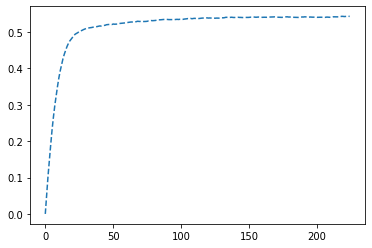

In [55]:
Y = delta_rho_mean_coefs[coefficient]['Mus_musculus']
X = range(225)
slope = np.polyfit(X, Y, 1)[0]
plt.plot(X, Y, '--')
plt.show()

NameError: name 'sel' is not defined

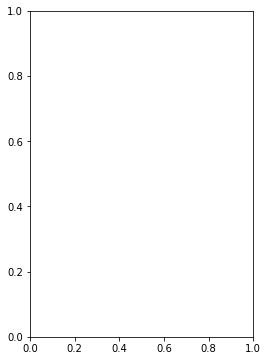

In [58]:
fig, ax = plt.subplots(figsize=(4, 6), facecolor='white')
ax.boxplot([sel, no_sel], widths=0.6)
ax.set_xticklabels(['WCF>Wobble отбор', 'Без отбора'])
plt.title('spearman 225 gen', fontsize=14)
plt.ylabel('spearman', fontsize=12)
plt.ylim(bottom=0.5)
# plt.savefig('Course work pictures\\Results_graphs\\Δρ CW-blood.png')
plt.show()

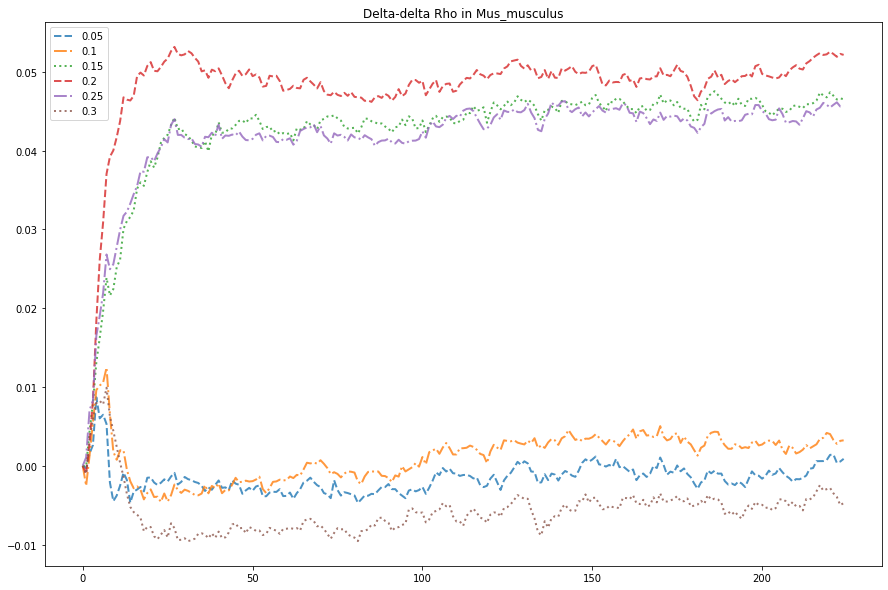

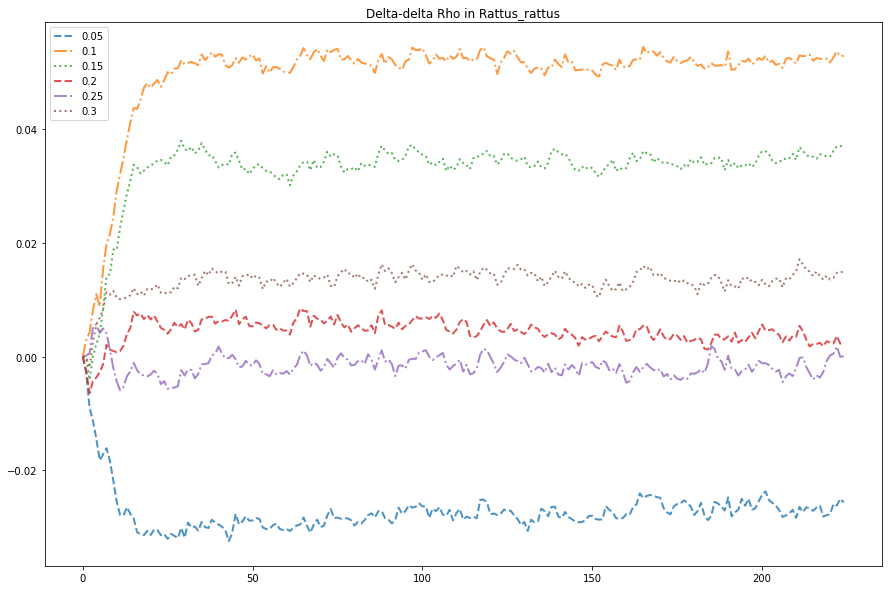

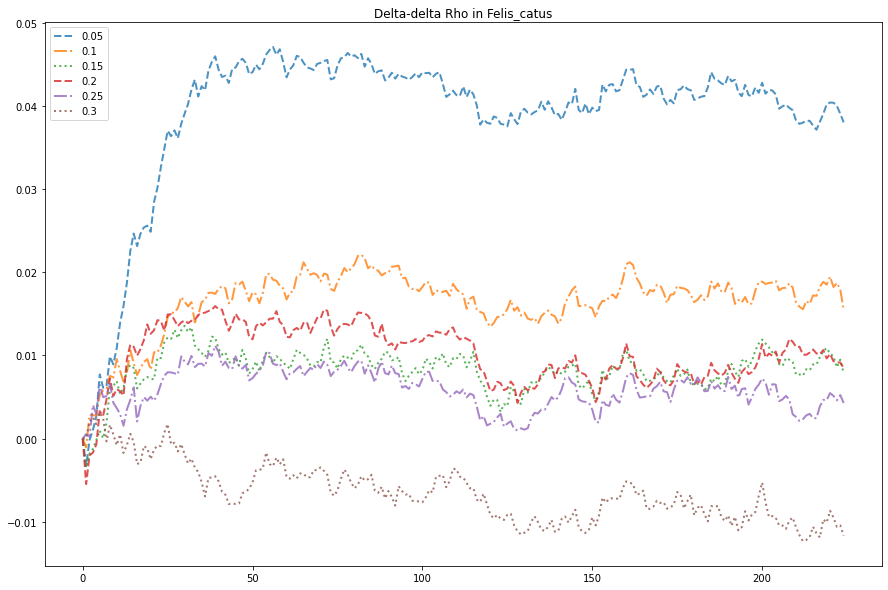

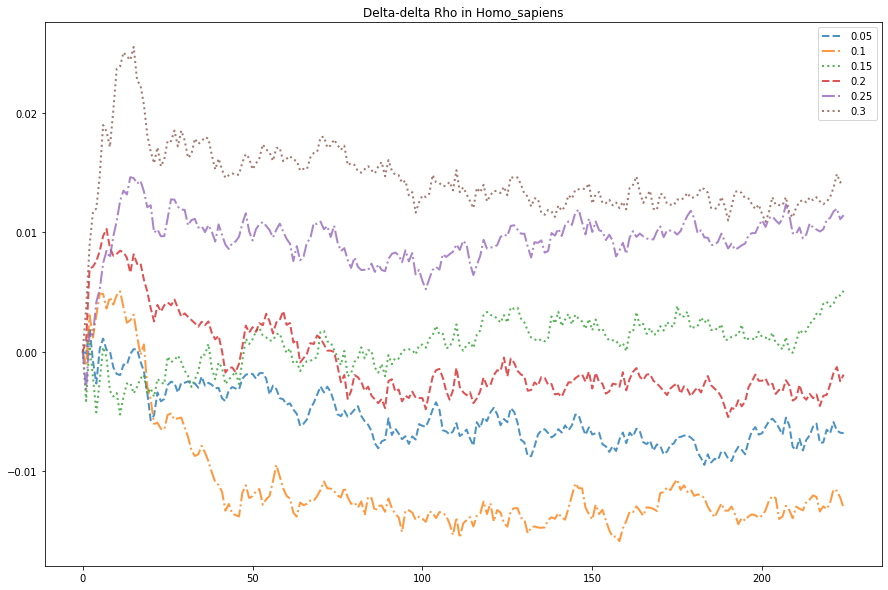

In [20]:
# delta-delta Rho short list
lines = ['--', '-.', ':', '--', '-.', ':']
delta_rho_mean_nosel = delta_rho_mean_coefs[0.0]
for species in short_species_list:
    plt.figure(figsize=(15,10), facecolor='white')
    for i, coefficient in enumerate(coefficients_list[1:]):
        delta_rho_mean_sel = delta_rho_mean_coefs[coefficient]
        delta_delta_rho = delta_rho_mean_sel[species] - delta_rho_mean_nosel[species]
        plt.plot(delta_delta_rho, label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
    plt.title(f'Delta-delta Rho in {species}')
    plt.legend()
    plt.show()

## None

In [147]:
result_folder = 'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(short list)'
short_species_list = ['Mus_musculus', 'Rattus_rattus', 'Felis_catus', 'Homo_sapiens']
coefficients_list = np.arange(0, 0.31, 0.05).round(2)
delta_rho_mean_coefs = {coefficient:delta_rho_mean_calculation(f'{result_folder}\{coefficient}') for coefficient in coefficients_list}

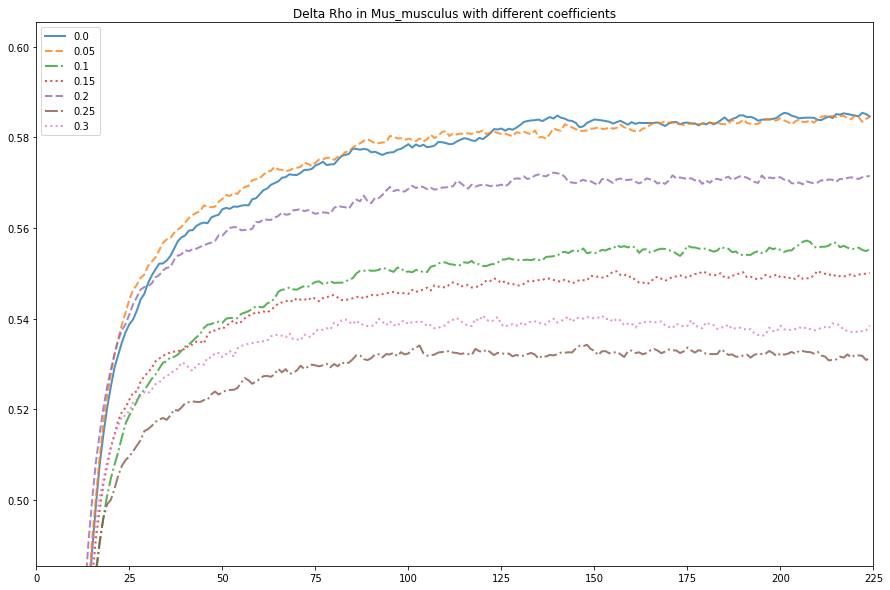

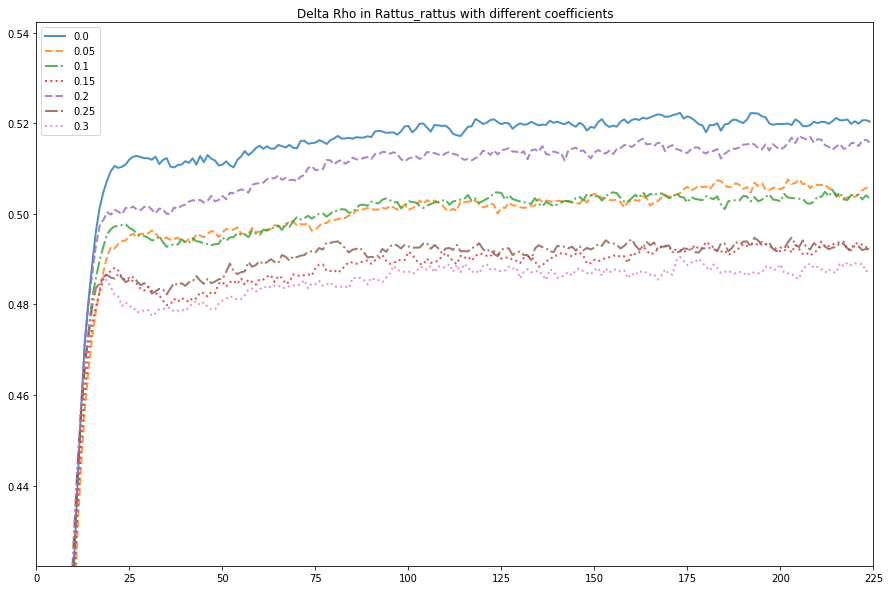

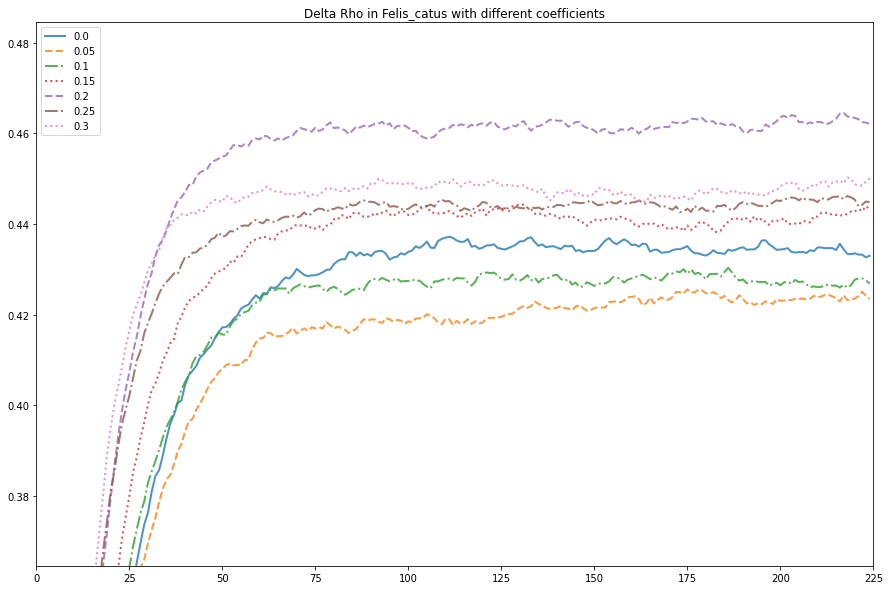

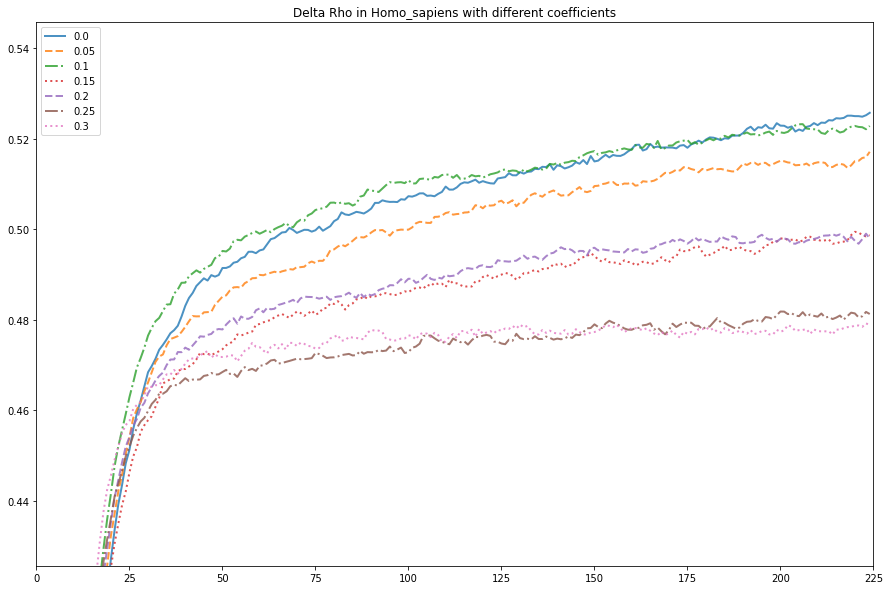

In [10]:
# delta Rhos
lines = ['-', '--', '-.', ':', '--', '-.', ':']
for species in short_species_list:
    plt.figure(figsize=(15, 10), facecolor='white')
    ylim = 0
    for i, coefficient in enumerate(coefficients_list):
        # paint_delta_rhos(delta_rho_mean_coefs[coefficient], f'Delta Rho with {coefficient} coef', y_lim=(0, 0.65), by_classes=False)
        if max(delta_rho_mean_coefs[coefficient][species]) > ylim:
            ylim = max(delta_rho_mean_coefs[coefficient][species])
        plt.plot(delta_rho_mean_coefs[coefficient][species], label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
        # plt.annotate(f'{coefficient}',
        #     xy=(200, ylim), xycoords='data',
        #     xytext=(1.5, 1.5), textcoords='offset points')
    
    plt.ylim(ylim-0.1, ylim+0.02)
    plt.xlim(0, 225)
    plt.title(f'Delta Rho in {species} with different coefficients')
    plt.legend(loc='upper left', fontsize=10)
    plt.show()

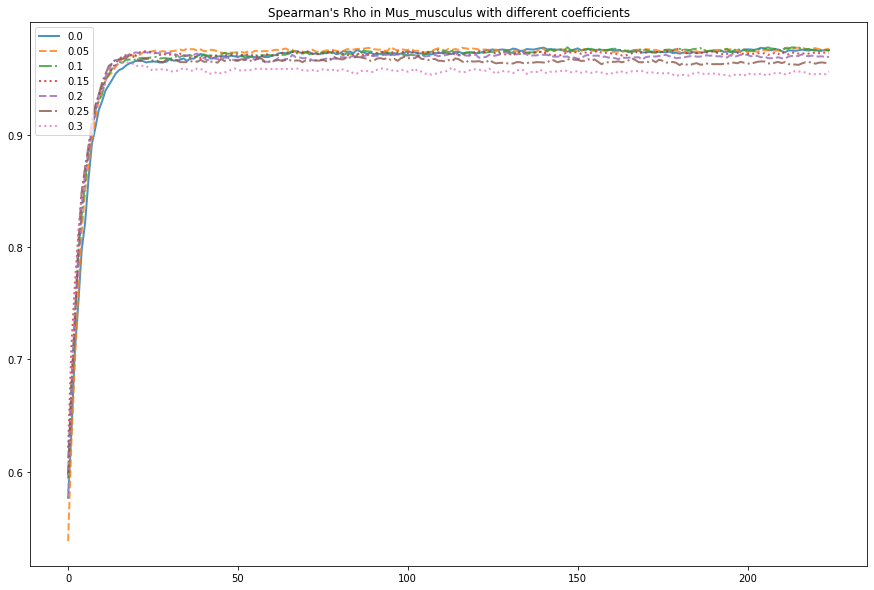

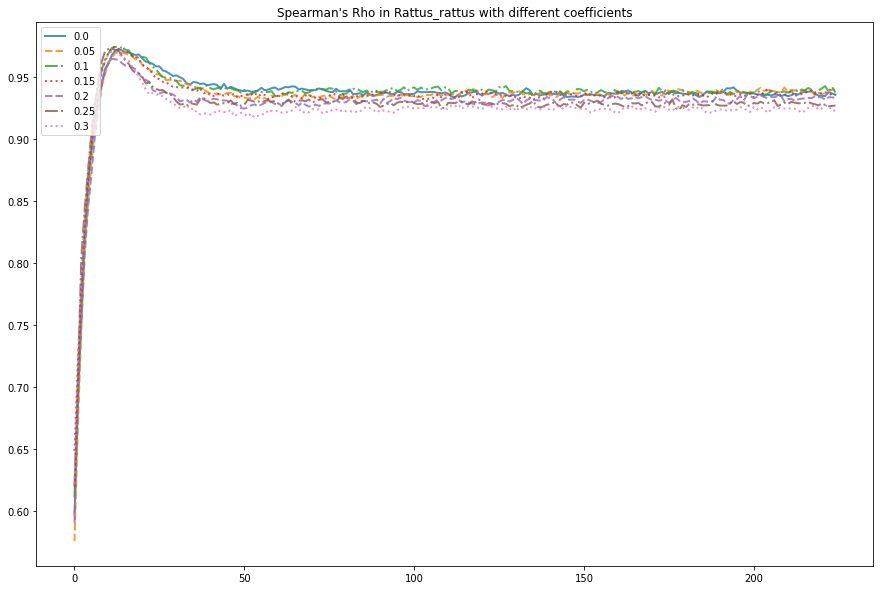

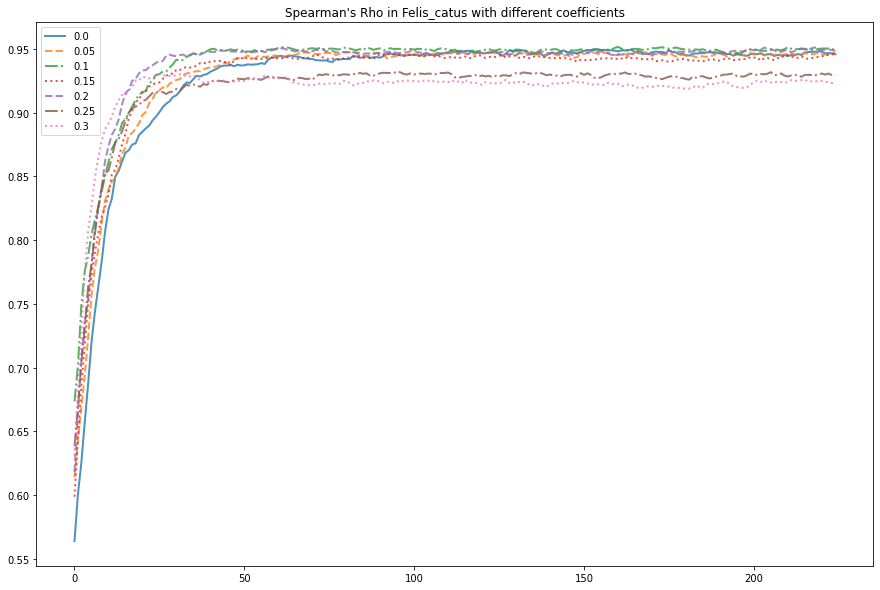

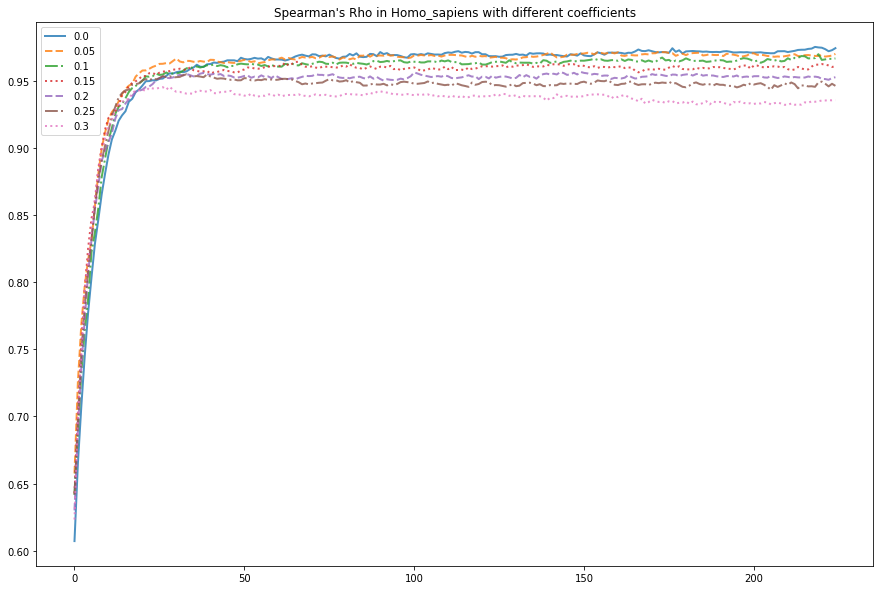

In [42]:
lines = ['-', '--', '-.', ':', '--', '-.', ':']
for species in short_species_list:
    plt.figure(figsize=(15, 10), facecolor='white')
    ylim = 0
    for i, coefficient in enumerate(coefficients_list):
        spearman_df = pd.read_csv(f'{result_folder}\{coefficient}\{species}\SpearmanMean.csv', sep='\t').copy()
        # if max(delta_rho_mean_coefs[coefficient][species]) > ylim:
        #     ylim = max(delta_rho_mean_coefs[coefficient][species])
        plt.plot(spearman_df.spearman, label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
        # plt.annotate(f'{coefficient}',
        #     xy=(200, ylim), xycoords='data',
        #     xytext=(1.5, 1.5), textcoords='offset points')
    # plt.ylim(0.5, 0.7)
    # plt.xlim(0, 225)
    plt.title(f'Spearman\'s Rho in {species} with different coefficients')
    plt.legend(loc='upper left', fontsize=10)
    plt.show()

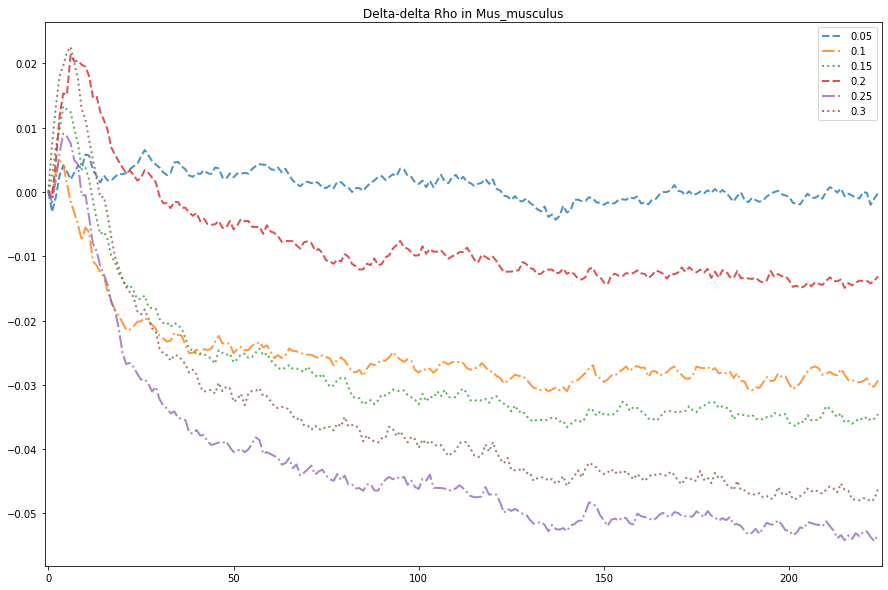

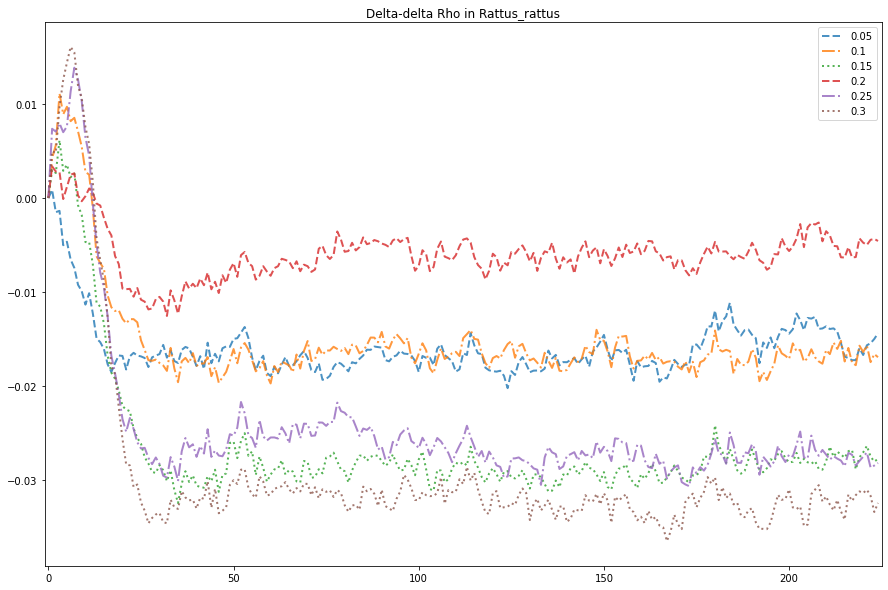

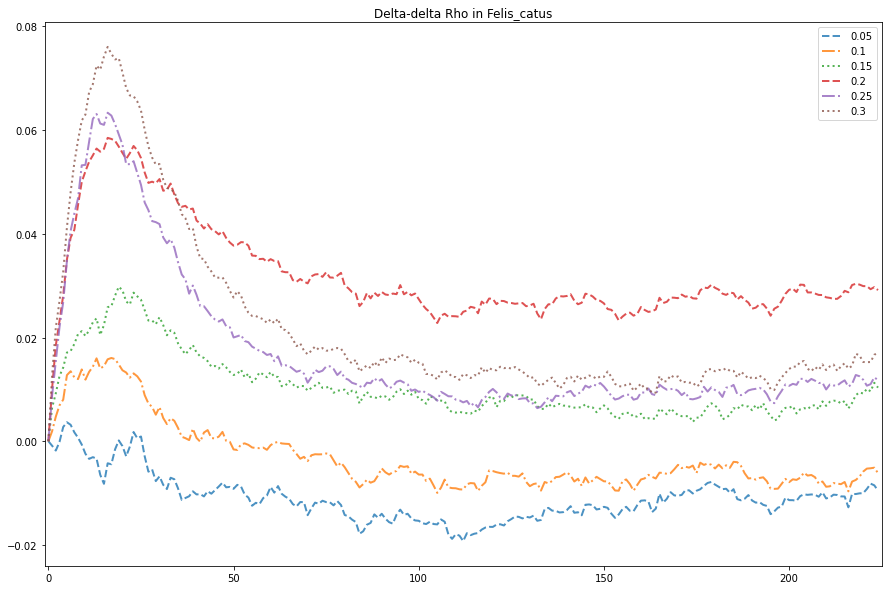

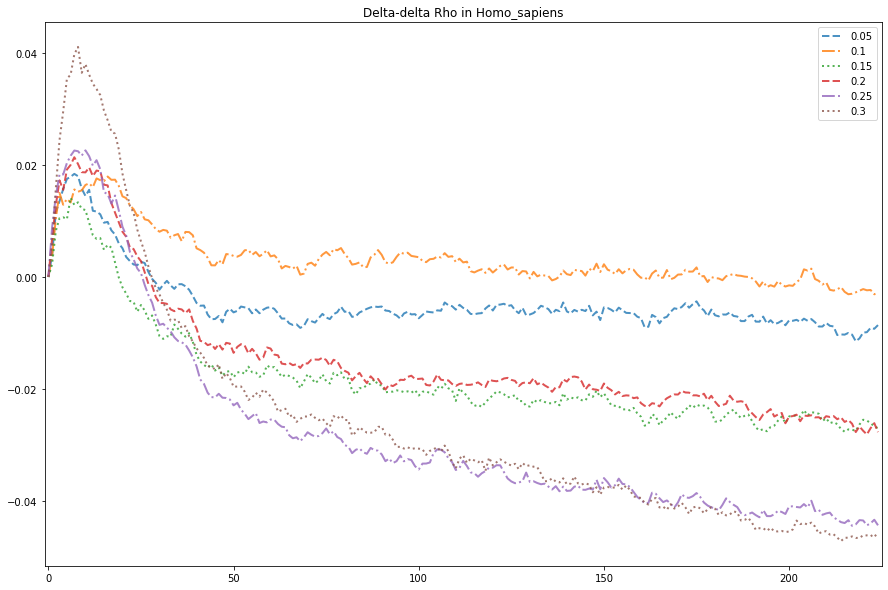

In [43]:
# delta-delta Rho short list
lines = ['--', '-.', ':', '--', '-.', ':']
delta_rho_mean_nosel = delta_rho_mean_coefs[0.0]
for species in short_species_list:
    plt.figure(figsize=(15,10), facecolor='white')
    for i, coefficient in enumerate(coefficients_list[1:]):
        delta_rho_mean_sel = delta_rho_mean_coefs[coefficient]
        delta_delta_rho = delta_rho_mean_sel[species] - delta_rho_mean_nosel[species]
        plt.plot(delta_delta_rho, label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
    plt.title(f'Delta-delta Rho in {species}')
    plt.xlim(-1,225)
    plt.legend()
    plt.show()

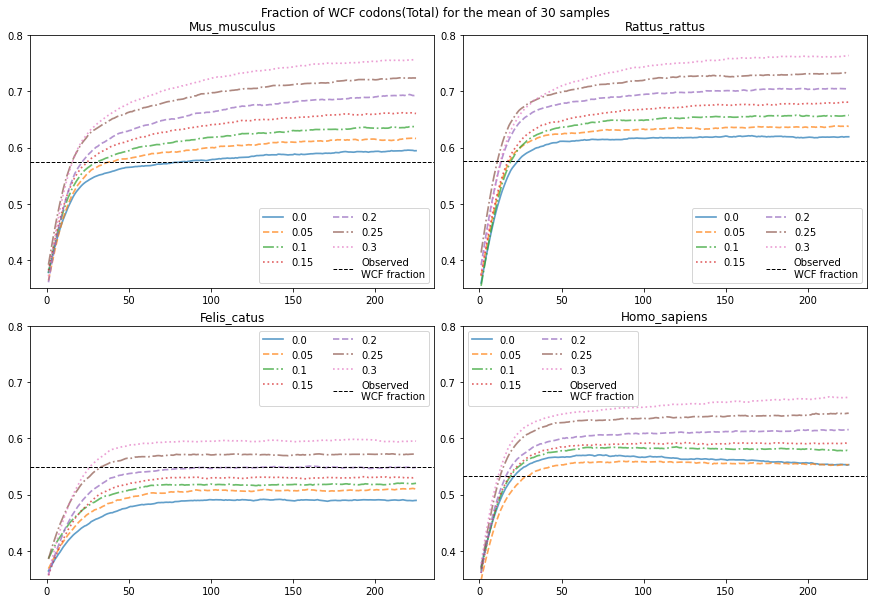

In [150]:
# WCF_share
lines = ['-', '--', '-.', ':', '--', '-.', ':']
mode = 'Total'
fig, ax = plt.subplots(2,2, figsize=(15,10), facecolor='white')
ax = ax.ravel()
for i_s, species in enumerate(short_species_list):
    for i_c, coef in enumerate(coefficients_list):
        wcf_share = wcf_share_calculation(f'{result_folder}\{coef}\{species}\FrequenciesMean.csv', mode=mode)
        ax[i_s].plot(wcf_share, alpha=0.7, label=coef, linewidth=1.7, ls=lines[i_c])
        # wcf_share = wcf_share_calculation(f'{result_folder}\\{coef}\Mus_musculus\FrequenciesMean.csv', mode='Total')
        # plt.plot(wcf_share, label=coef, alpha=0.5)
    #     break
    # plt.ylim(top=max(wcf_share)+0.05)
    observed_wcf_fraction = observed_wcf_share_calculation(f'{result_folder}\{coefficient}\{species}\FrequenciesMean.csv')
    ax[i_s].axhline(y=observed_wcf_fraction, ls='--', lw=1, c='black', label='Observed\nWCF fraction')
    # plt.axhline(y=22/60, c='black', ls='--', label='Expected by random\nprocess WCF fraction')
    ax[i_s].legend(ncol=2)
    # ax[i_s].set_xlabel('Generations')
    # ax[i_s].set_ylabel('Fraction')
    ax[i_s].set_title(f'{species}')
    ax[i_s].set_ylim(0.35, 0.8)
plt.subplots_adjust(wspace=0.07, hspace=0.15)
plt.suptitle(f'Fraction of WCF codons({mode}) for the mean of 30 samples', y=0.92)
plt.show()

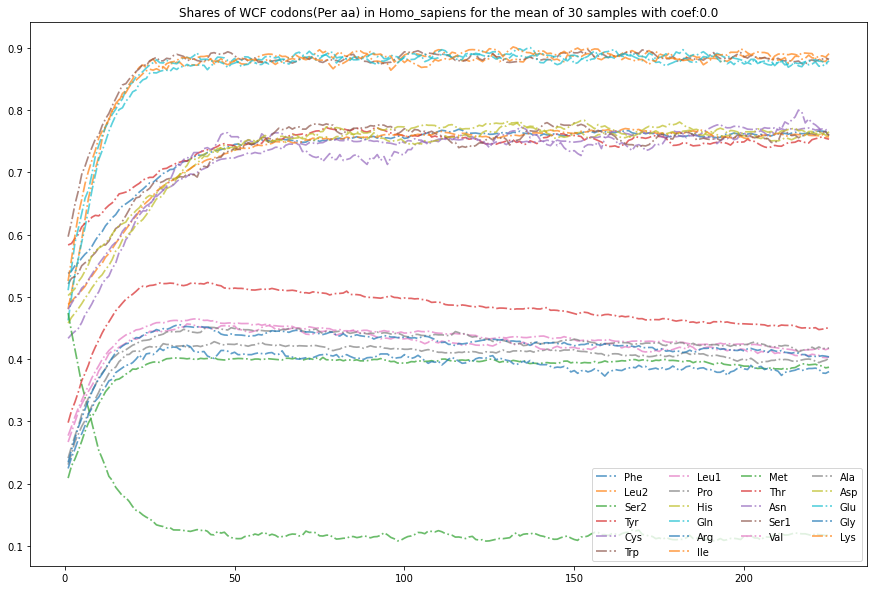

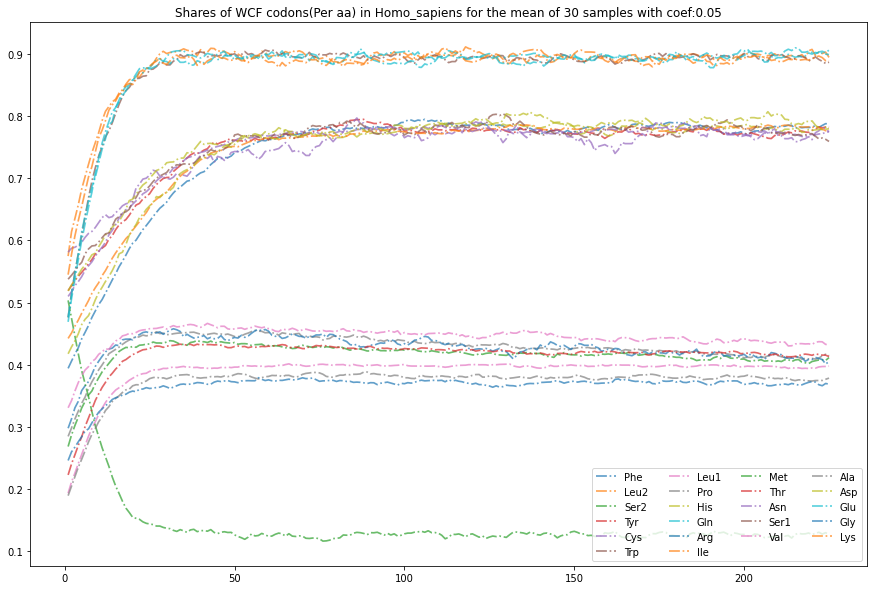

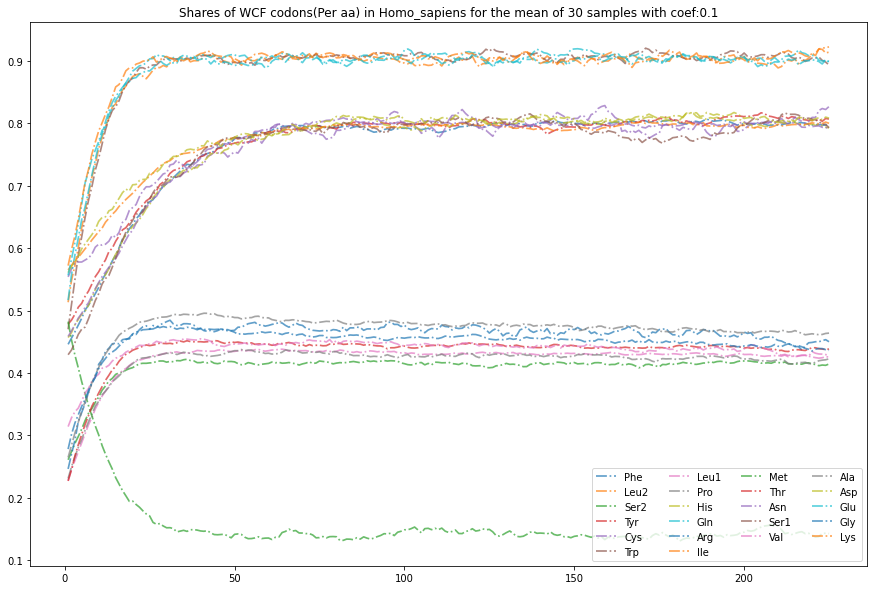

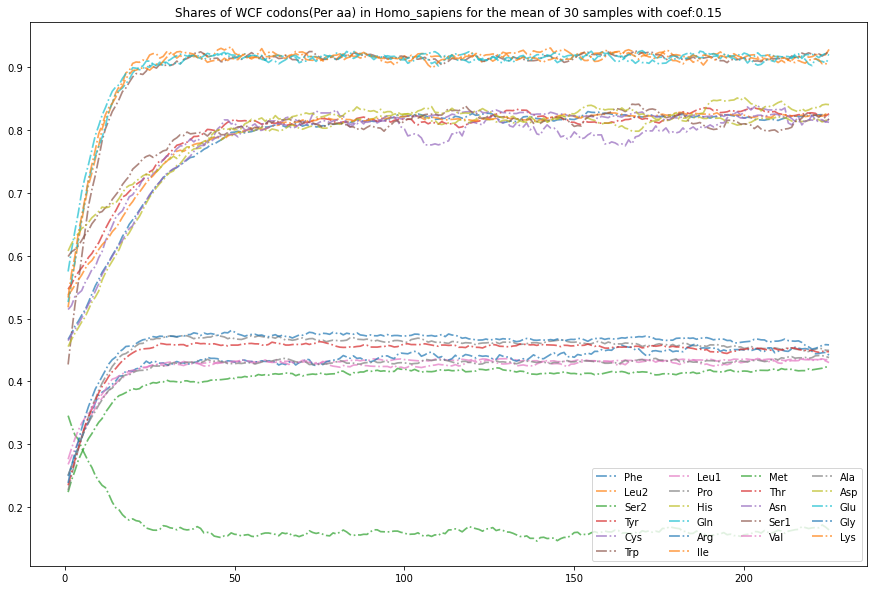

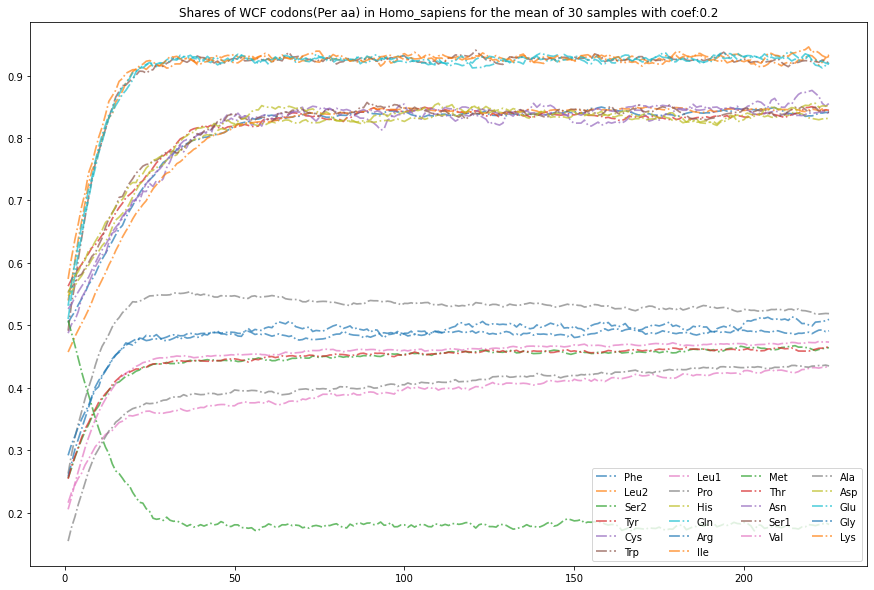

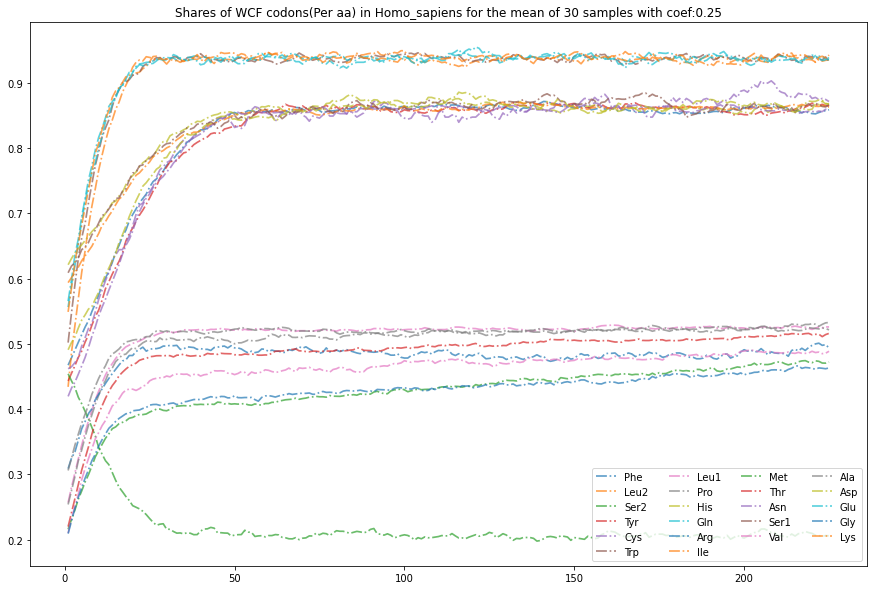

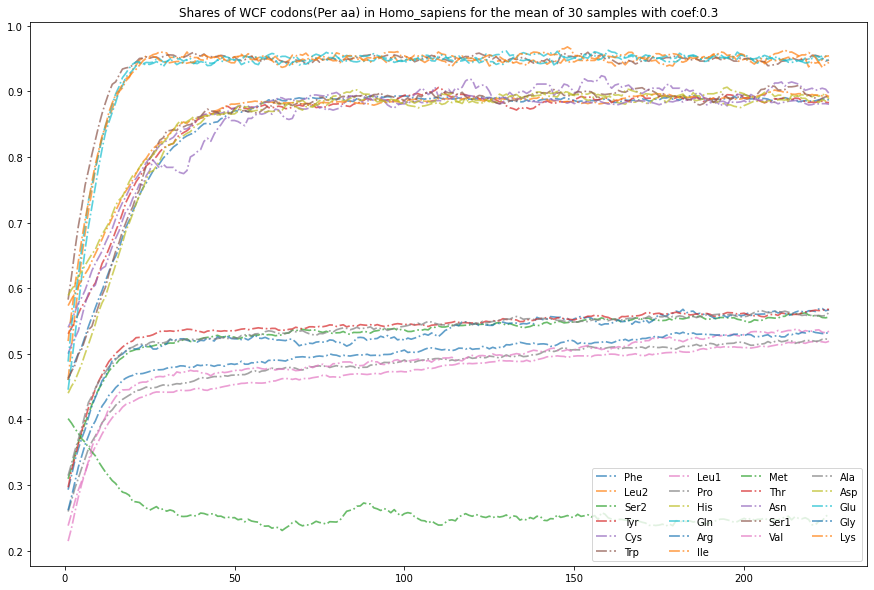

In [ ]:
# WCF_share PER AMINO ACID
lines = ['-', '--', '-.', ':']*5 + ['-', '--']
mode = 'Per aa'
for species in short_species_list[-1:]:
    for coef in coefficients_list:
        wcf_share = wcf_share_calculation(f'{result_folder}\\{coef}\{species}\FrequenciesMean.csv', mode=mode)
        plt.figure(figsize=(15, 10), facecolor='white')
        for aa in ac_codon_dict_full.keys():
            plt.plot(wcf_share[aa], alpha=0.7, label=aa, linewidth=1.7, ls=lines[i])
        # wcf_share = wcf_share_calculation(f'{result_folder}\\{coef}\Mus_musculus\FrequenciesMean.csv', mode='Total')
        # plt.plot(wcf_share, label=coef, alpha=0.5)
    # plt.xlim(-0.01, 50)
        plt.legend(ncol=4, loc='lower right')
        plt.title(f'Fraction of WCF codons({mode}) in {species} for the mean of 30 samples with coef:{coef}')
        plt.show()

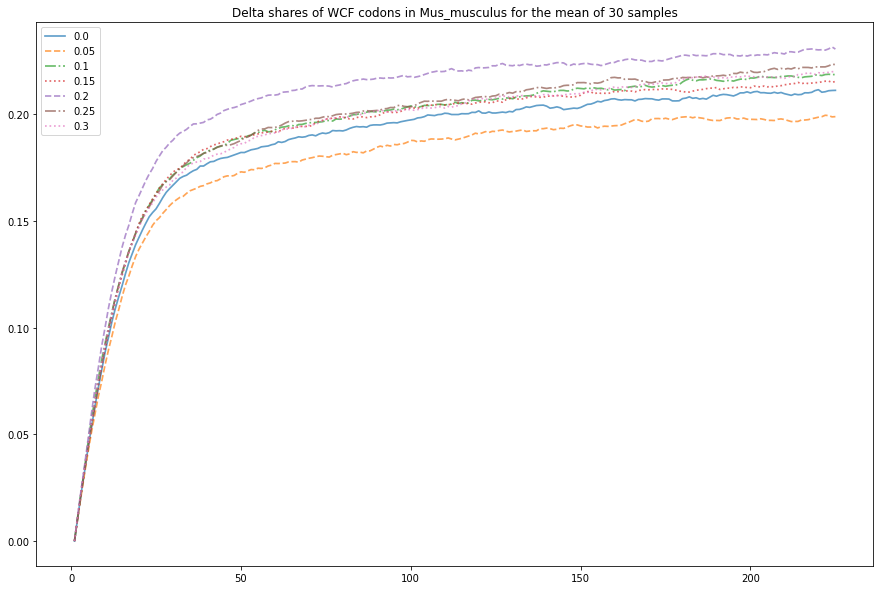

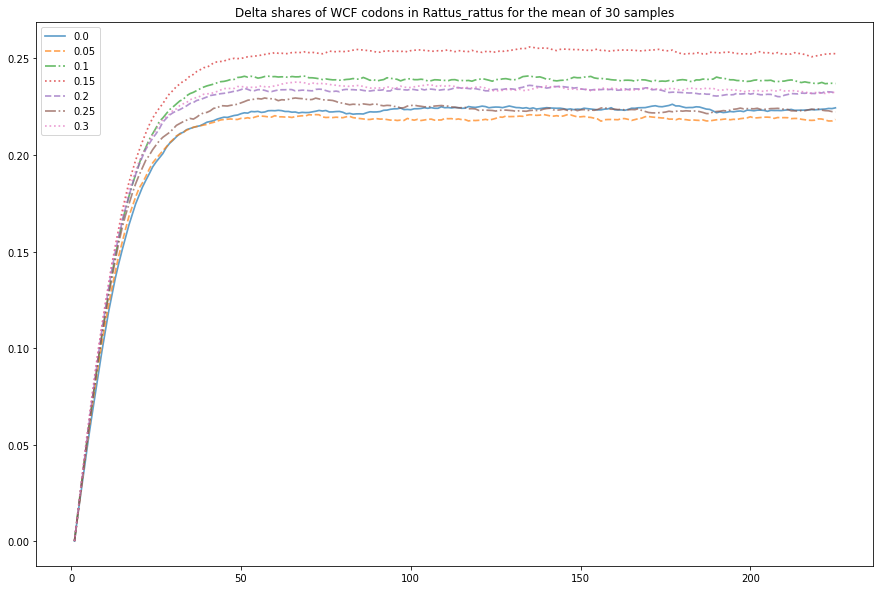

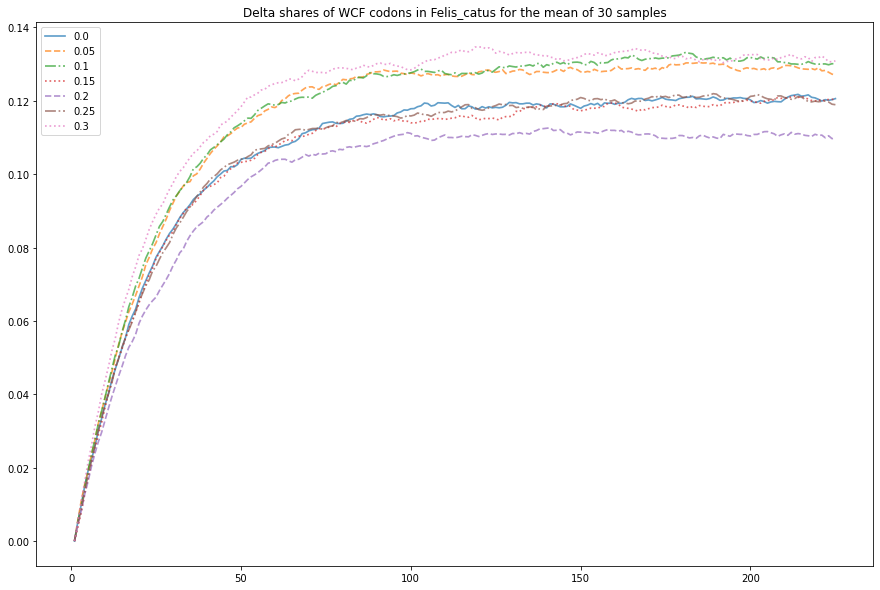

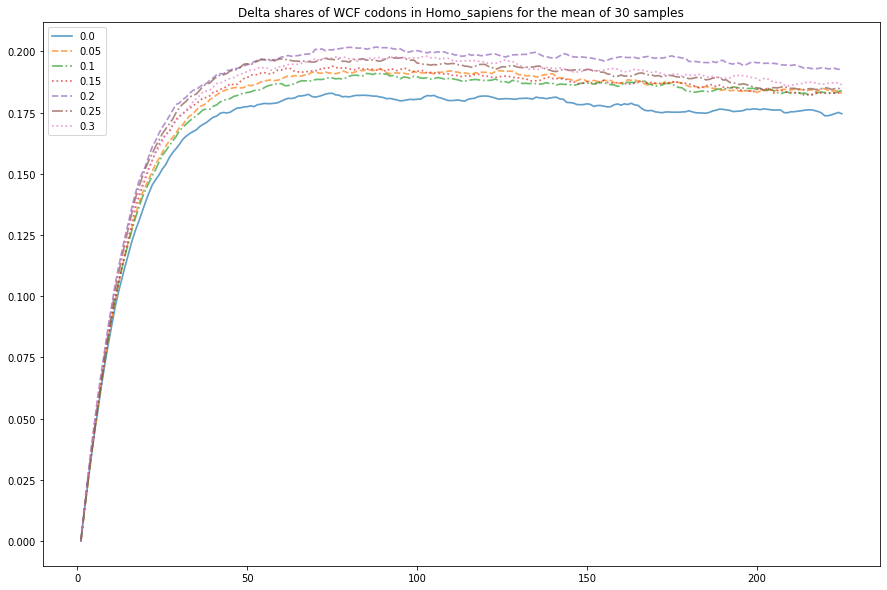

In [ ]:
# delta WCF_share
lines = ['-', '--', '-.', ':', '--', '-.', ':']
for species in short_species_list:
    plt.figure(figsize=(15, 10), facecolor='white')
    for i, coef in enumerate(coefficients_list):
        wcf_share = wcf_share_calculation(f'{result_folder}\\{coef}\{species}\FrequenciesMean.csv', mode='Total')
        wcf_share -= wcf_share[1]
        plt.plot(wcf_share, alpha=0.7, label=coef, linewidth=1.7, ls=lines[i])
        # wcf_share = wcf_share_calculation(f'{result_folder}\\{coef}\Mus_musculus\FrequenciesMean.csv', mode='Total')
        # plt.plot(wcf_share, label=coef, alpha=0.5)
    # plt.xlim(-0.01, 50)
    plt.legend()
    plt.title(f'Delta fractions of WCF codons in {species} for the mean of 30 samples')
    plt.show()

## Human no random

In [29]:
result_folder = 'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(short list) no Random'
short_species_list = ['Mus_musculus', 'Rattus_rattus', 'Felis_catus', 'Homo_sapiens']
coefficients_list = np.arange(0, 0.31, 0.05).round(2)
delta_rho_mean_coefs = {coefficient:delta_rho_mean_calculation(f'{result_folder}\{coefficient}') for coefficient in coefficients_list}

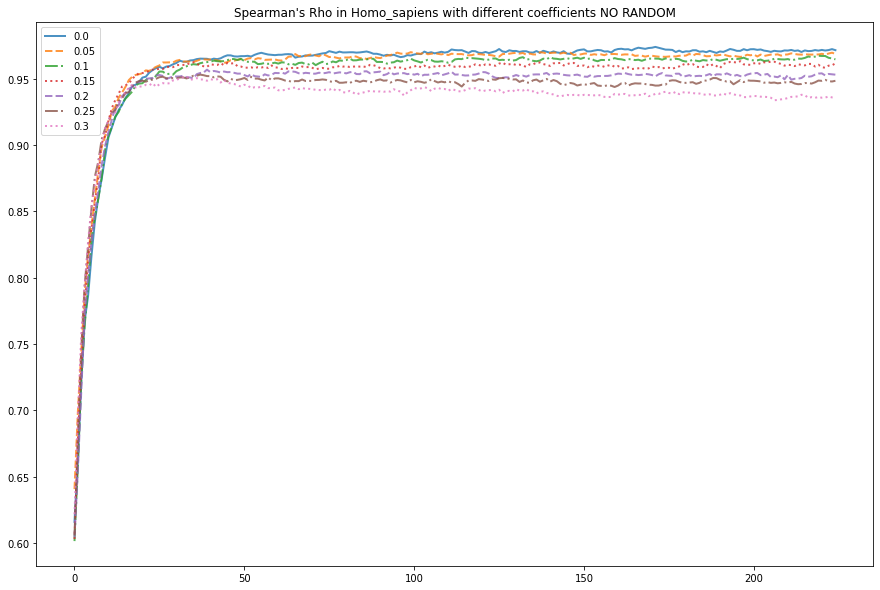

In [30]:
lines = ['-', '--', '-.', ':', '--', '-.', ':']
for species in short_species_list[-1:]:
    plt.figure(figsize=(15, 10), facecolor='white')
    ylim = 0
    for i, coefficient in enumerate(coefficients_list):
        spearman_df = pd.read_csv(f'{result_folder}\{coefficient}\{species}\SpearmanMean.csv', sep='\t').copy()
        # if max(delta_rho_mean_coefs[coefficient][species]) > ylim:
        #     ylim = max(delta_rho_mean_coefs[coefficient][species])
        plt.plot(spearman_df.spearman, label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
        # plt.annotate(f'{coefficient}',
        #     xy=(200, ylim), xycoords='data',
        #     xytext=(1.5, 1.5), textcoords='offset points')
    # plt.ylim(0.5, 0.7)
    # plt.xlim(0, 225)
    plt.title(f'Spearman\'s Rho in {species} with different coefficients NO RANDOM')
    plt.legend(loc='upper left', fontsize=10)
    plt.show()

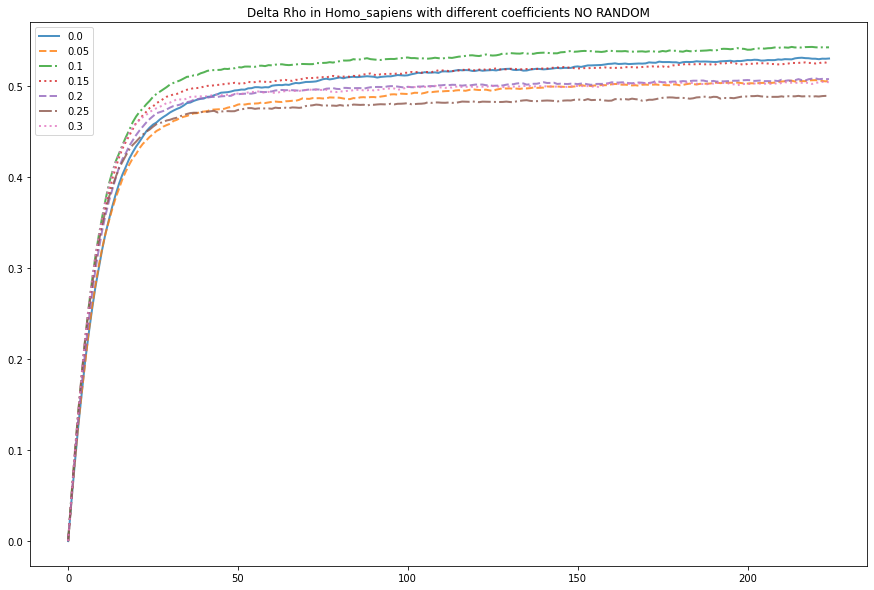

In [31]:
# delta Rhos
lines = ['-', '--', '-.', ':', '--', '-.', ':']
for species in short_species_list[-1:]:
    plt.figure(figsize=(15, 10), facecolor='white')
    ylim = 0
    for i, coefficient in enumerate(coefficients_list):
        # paint_delta_rhos(delta_rho_mean_coefs[coefficient], f'Delta Rho with {coefficient} coef', y_lim=(0, 0.65), by_classes=False)
        if max(delta_rho_mean_coefs[coefficient][species]) > ylim:
            ylim = max(delta_rho_mean_coefs[coefficient][species])
        plt.plot(delta_rho_mean_coefs[coefficient][species], label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
        # plt.annotate(f'{coefficient}',
        #     xy=(200, ylim), xycoords='data',
        #     xytext=(1.5, 1.5), textcoords='offset points')
    # plt.ylim(ylim-0.1, ylim+0.02)
    # plt.xlim(0, 225)
    plt.title(f'Delta Rho in {species} with different coefficients NO RANDOM')
    plt.legend(loc='upper left', fontsize=10)
    plt.show()

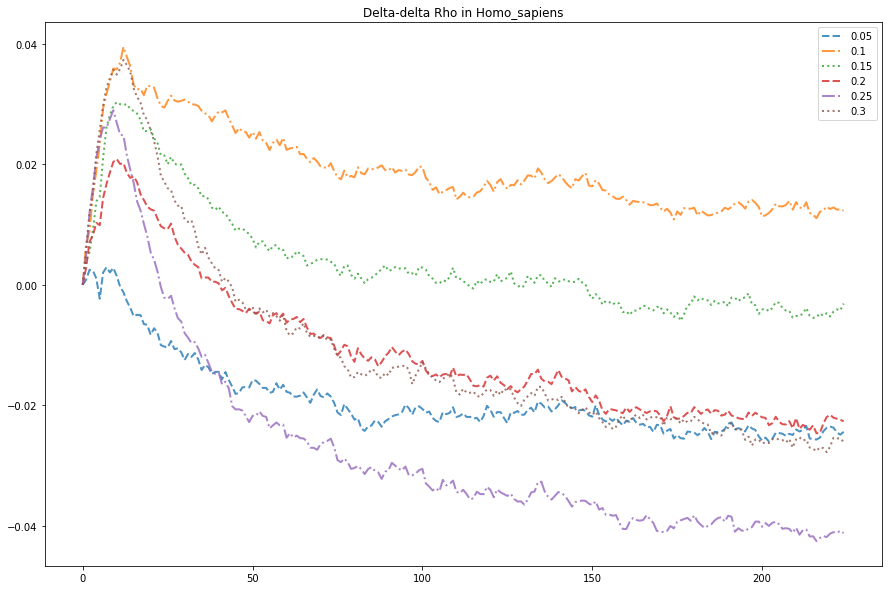

In [32]:
# delta-delta Rho short list
lines = ['--', '-.', ':', '--', '-.', ':']
delta_rho_mean_nosel = delta_rho_mean_coefs[0.0]
for species in short_species_list[-1:]:
    plt.figure(figsize=(15,10), facecolor='white')
    for i, coefficient in enumerate(coefficients_list[1:]):
        delta_rho_mean_sel = delta_rho_mean_coefs[coefficient]
        delta_delta_rho = delta_rho_mean_sel[species] - delta_rho_mean_nosel[species]
        plt.plot(delta_delta_rho, label=coefficient, alpha=0.8, linestyle=lines[i], linewidth=2)
    plt.title(f'Delta-delta Rho in {species}')
    plt.legend()
    plt.show()

## Total delta Rho

In [124]:
total_delta_rho_mean_00 = delta_rho_mean_calculation('C:\Work\Lab\Practice\Results_AllGenes_shift')
total_delta_rho_mean_01 = delta_rho_mean_calculation('C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(sel)')
total_delta_rho_mean_coefs = {0.0:total_delta_rho_mean_00, 0.1:total_delta_rho_mean_01}

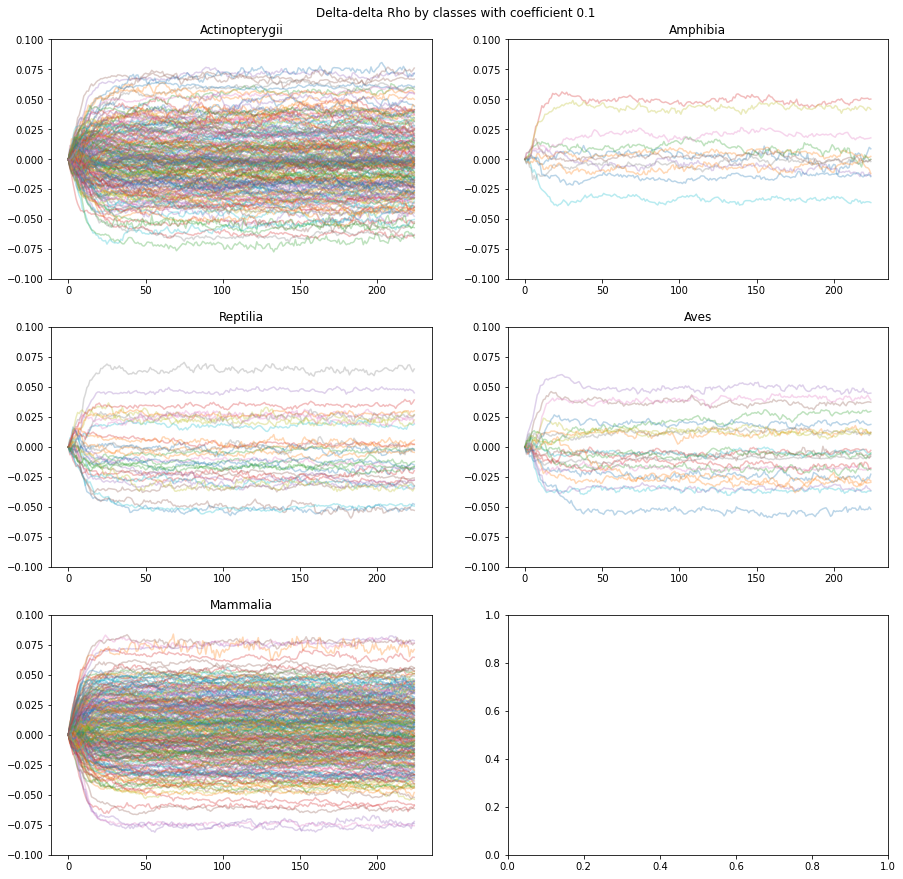

In [145]:
total_delta_delta_rho = {}
fig, ax = plt.subplots(3, 2, figsize=(15,15), facecolor='white')
ax = ax.ravel()
for i, class_ in enumerate(Class_dict):
    class_species = set(Class_dict[class_]) & set(zero_n[12])
    delta_rho_mean_sel = delta_rho_mean_coefs[coefficient]
    for species in class_species:
        total_delta_delta_rho[species] = total_delta_rho_mean_01[species] - total_delta_rho_mean_00[species]
        ax[i].plot(total_delta_delta_rho[species], alpha=0.3)
    ax[i].set_title(f'{class_}')
    ax[i].set_ylim(-0.1, 0.1)
plt.suptitle(f'Delta-delta Rho by classes with coefficient 0.1', y=0.91)
plt.subplots_adjust()
plt.show()

## Per genes

In [10]:
CU_genes = pd.read_csv(r'C:\Work\Lab\pr-29-trna-or-mutagenesis\raw\AllGenesCodonUsage.csv', sep='\t').copy()
CU_genes = CU_genes[CU_genes.Gene!='ND6']
short_species_list = ['Mus_musculus', 'Rattus_rattus', 'Felis_catus', 'Homo_sapiens']
coefficients_list = np.arange(0, 0.31, 0.05).round(2)
GENE_ARRANGEMENT = ['ND1', 'ND2','COX1', 'COX2', 'ATP8', 'ATP6', 'COX3', 'ND3', 'ND4L', 'ND4', 'ND5', 'CytB']
# result_folder = f'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(per genes) - Copy'
# gene = 'COX1'
# delta_rho_mean_coefs = {coefficient:delta_rho_mean_calculation(f'{result_folder}\{coefficient}\{gene}') for coefficient in coefficients_list}


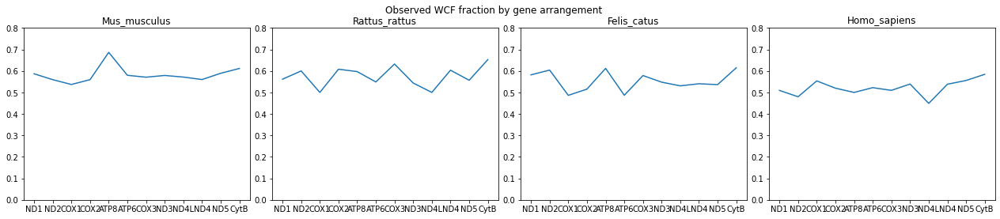

In [49]:
# Observed WCF fraction by gene arrangement
fig, ax = plt.subplots(1, 4, facecolor='white', figsize=(22,4))
ax = ax.ravel()
for i, species in enumerate(short_species_list):
    obs_wcf_share_list = []
    for gene in GENE_ARRANGEMENT:
        result_folder = f'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(per genes)\{coefficient}\{gene}\{species}'
        obs_wcf_share = observed_wcf_share_calculation(f'{result_folder}\FrequenciesMean.csv')
        obs_wcf_share_list.append(obs_wcf_share)
    ax[i].plot(obs_wcf_share_list)
    ax[i].set_xticks(range(len(GENE_ARRANGEMENT)))
    ax[i].set_xticklabels(GENE_ARRANGEMENT)
    ax[i].set_title(f'{species}')
    ax[i].set_ylim(0, 0.8)
plt.subplots_adjust(wspace=0.1)
plt.suptitle(f'Observed WCF fraction by gene arrangement')
plt.show()

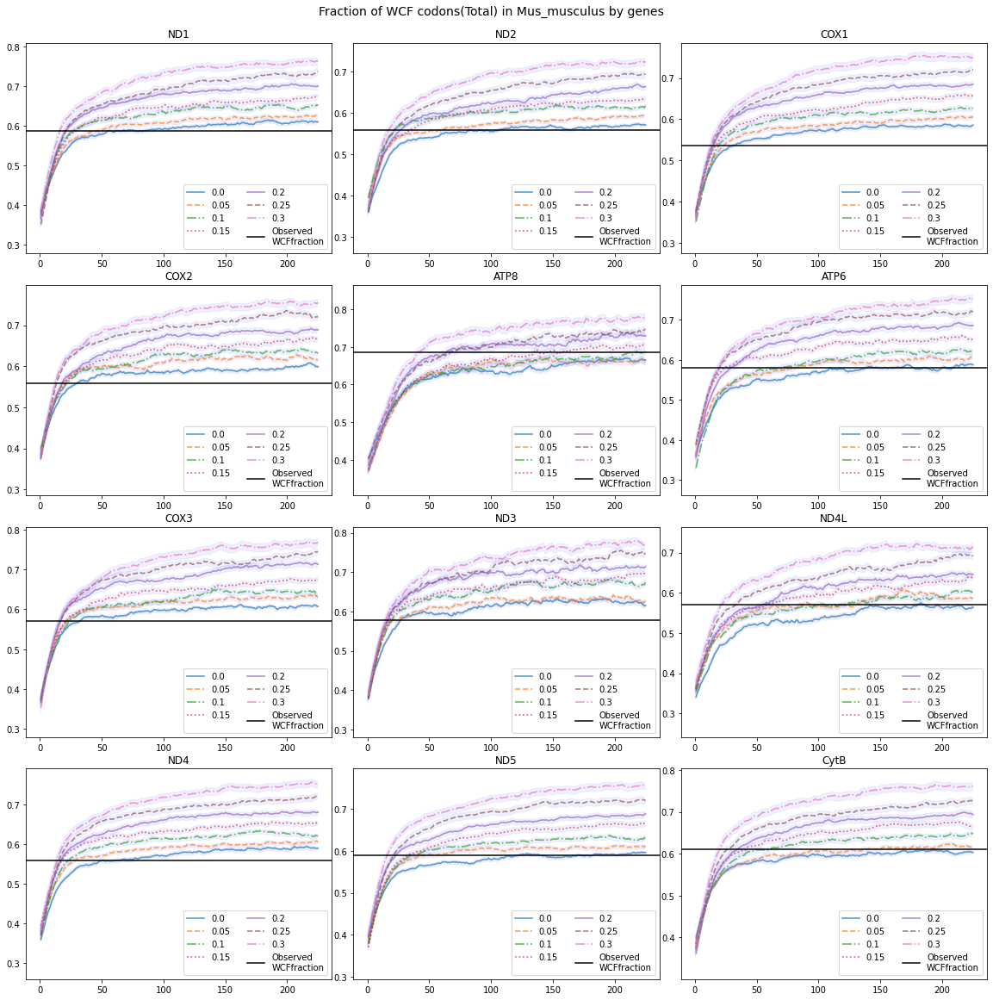

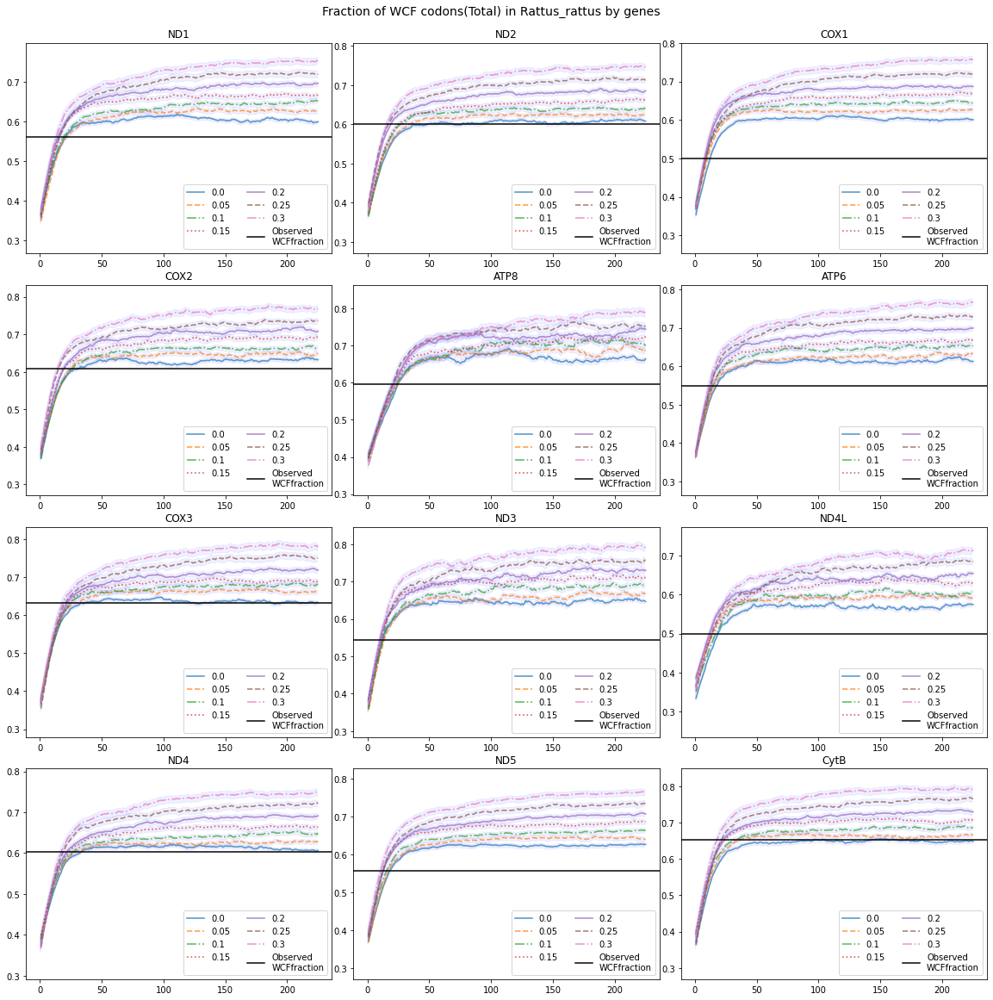

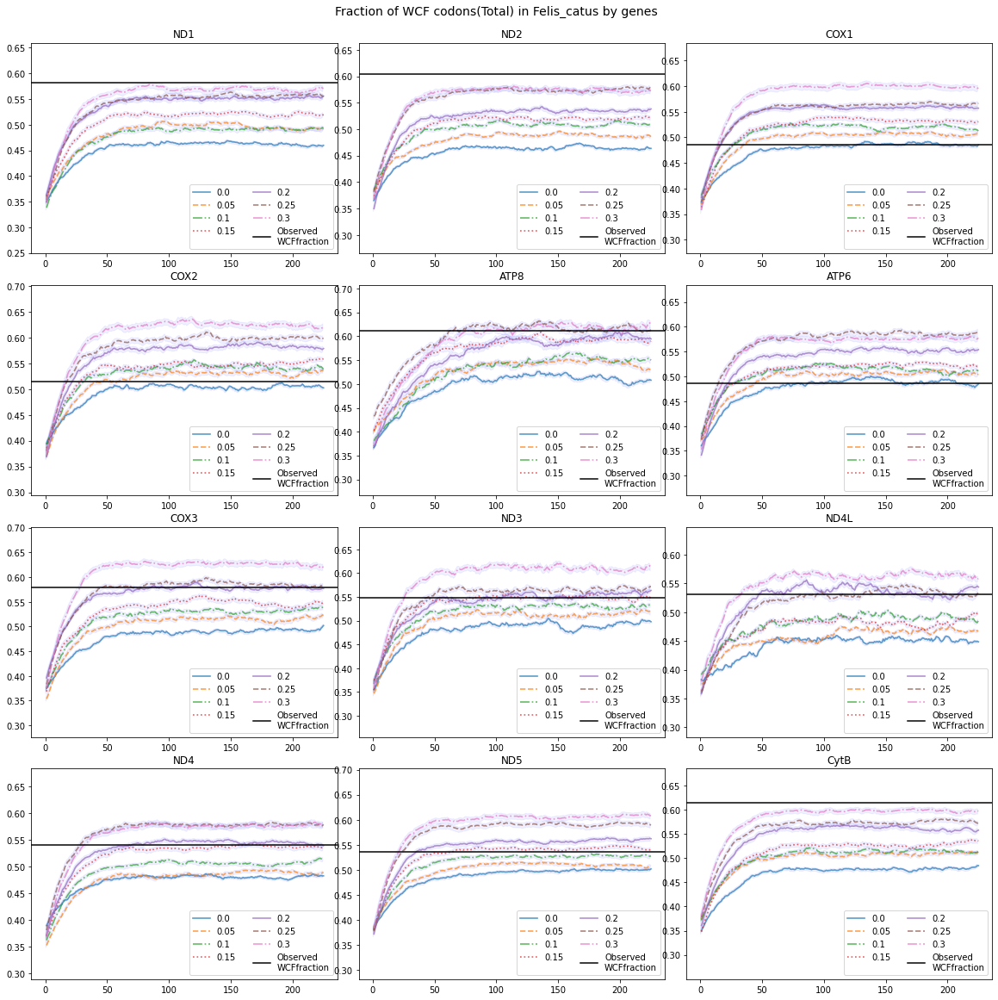

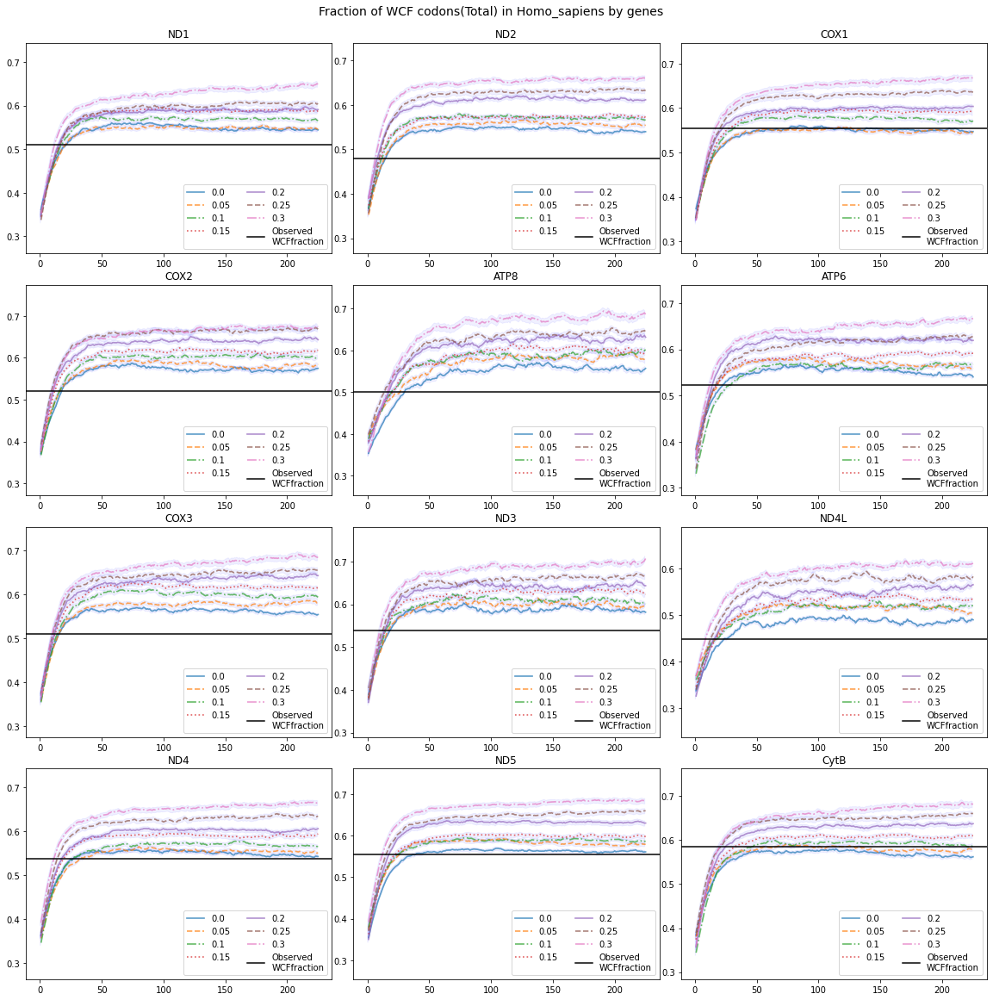

In [16]:
mode = 'Total'
lines = ['-', '--', '-.', ':']*2
for species in short_species_list:
    fig, ax = plt.subplots(4, 3, figsize=(20,20), facecolor='white')
    ax = ax.ravel()
    
    for i_g, gene in enumerate(GENE_ARRANGEMENT):
        for i_c, coefficient in enumerate(coefficients_list):
            genes_sp = CU_genes[CU_genes.Species==species].Gene.unique()
            if gene in genes_sp:
                result_folder = f'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(per genes) - Copy\{coefficient}\{gene}\{species}'
                wcf_share = wcf_share_calculation(f'{result_folder}\FrequenciesMean.csv', mode=mode)
                if i_c == 0:
                    bottom = wcf_share[1] - 0.1
                    top = wcf_share[len(wcf_share)] + 0.2
                ax[i_g].plot(wcf_share, alpha=0.7, label=coefficient, linewidth=1.7, ls=lines[i_c])
                ci = 1.96 * np.std(wcf_share)/np.sqrt(len(wcf_share))
                ax[i_g].fill_between(range(len(wcf_share)), (wcf_share-ci), (wcf_share+ci), color='b', alpha=0.06)
            
        observed_wcf_fraction = observed_wcf_share_calculation(f'{result_folder}\FrequenciesMean.csv')
        ax[i_g].axhline(y=observed_wcf_fraction, c='black', label='Observed\nWCFfraction')
        ax[i_g].set_title(f'{gene}')
        ax[i_g].set_ylim(bottom, top)
        ax[i_g].legend(ncol=2)
        
    plt.suptitle(f'Fraction of WCF codons({mode}) in {species} by genes', y=0.91, fontsize=14)
    plt.subplots_adjust(wspace=0.07, hspace=0.15)
    plt.show()

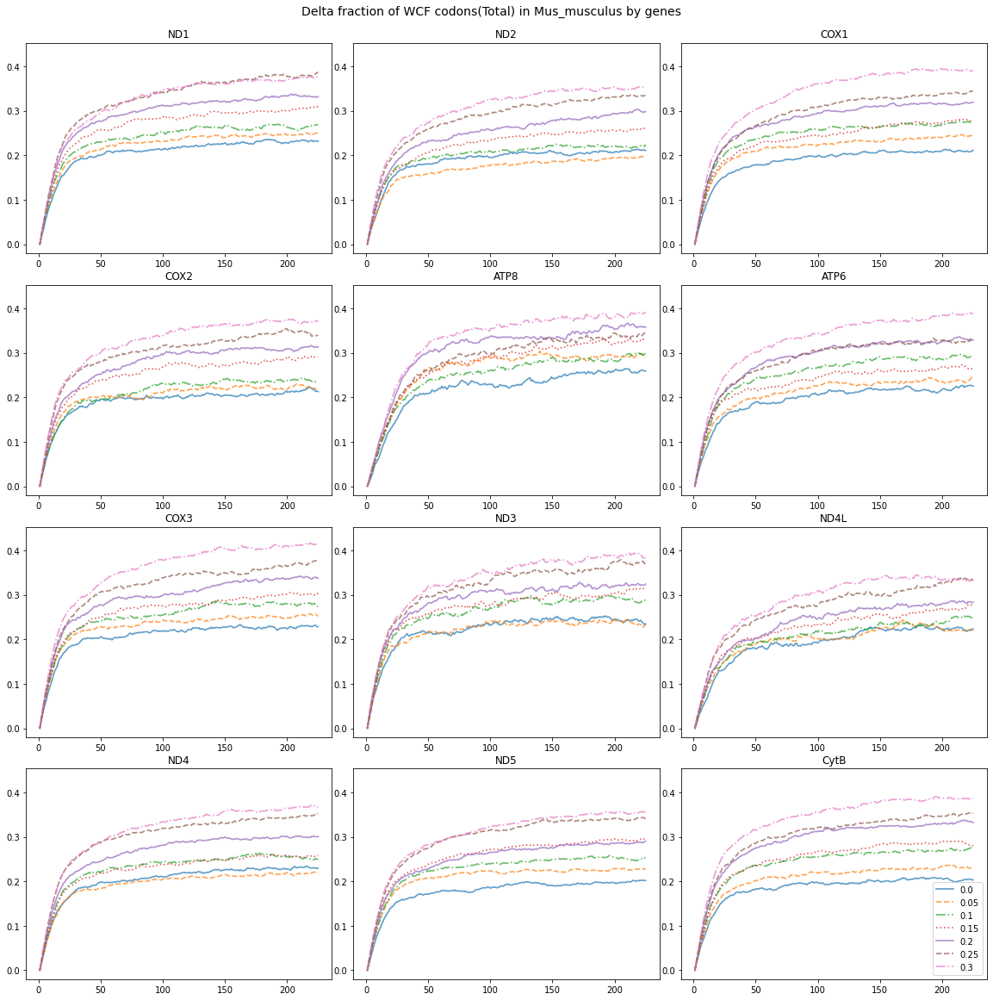

In [7]:
# DELTA
mode = 'Total'
lines = ['-', '--', '-.', ':']*2
for species in short_species_list:
    fig, ax = plt.subplots(4, 3, figsize=(20,20), facecolor='white')
    ax = ax.ravel()
    for i_c, coefficient in enumerate(coefficients_list):
        genes_sp = CU_genes[CU_genes.Species==species].Gene.unique()
        for i_g, gene in enumerate(GENE_ARRANGEMENT):
            if gene in genes_sp:
                result_folder = f'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(per genes)\{coefficient}\{gene}\{species}'
                wcf_share = wcf_share_calculation(f'{result_folder}\FrequenciesMean.csv', mode=mode) 
                wcf_share -= wcf_share[1]
                if i_c == 0:
                    bottom = wcf_share[1] - 0.02
                    top = wcf_share[len(wcf_share)] + 0.25
                ax[i_g].plot(wcf_share, alpha=0.7, label=coefficient, linewidth=1.7, ls=lines[i_c]) # 
                ax[i_g].set_title(f'{gene}')
                ax[i_g].set_ylim(bottom, top)
    plt.legend()
    plt.suptitle(f'Delta fraction of WCF codons({mode}) in {species} by genes', y=0.91, fontsize=14)
    plt.subplots_adjust(wspace=0.07, hspace=0.15)
    plt.show()
    break

In [17]:
last_values_delta = {}
for species in short_species_list:
    last_values_delta[species] = {}
    for coefficient in coefficients_list:
        last_values_delta[species][coefficient] = []
        genes_sp = CU_genes[CU_genes.Species==species].Gene.unique()
        for gene in GENE_ARRANGEMENT:
            if gene in genes_sp:
                result_folder = f'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(per genes)\{coefficient}\{gene}\{species}'
                wcf_share = wcf_share_calculation(f'{result_folder}\FrequenciesMean.csv', mode='Total') 
                wcf_share -= wcf_share[1]
                last_values_delta[species][coefficient].append(wcf_share[len(wcf_share)])

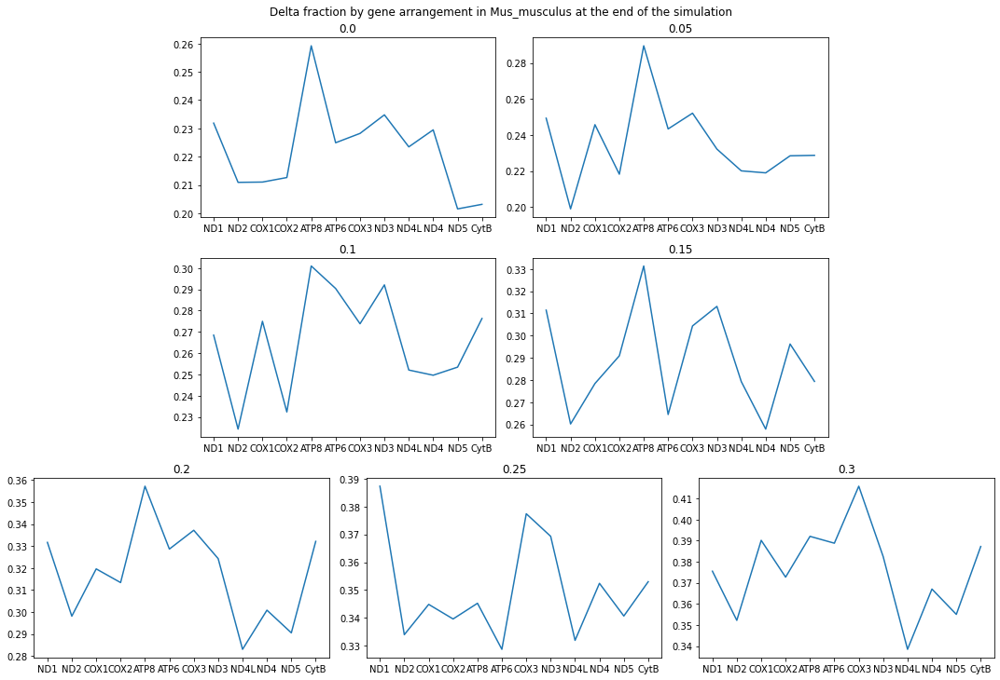

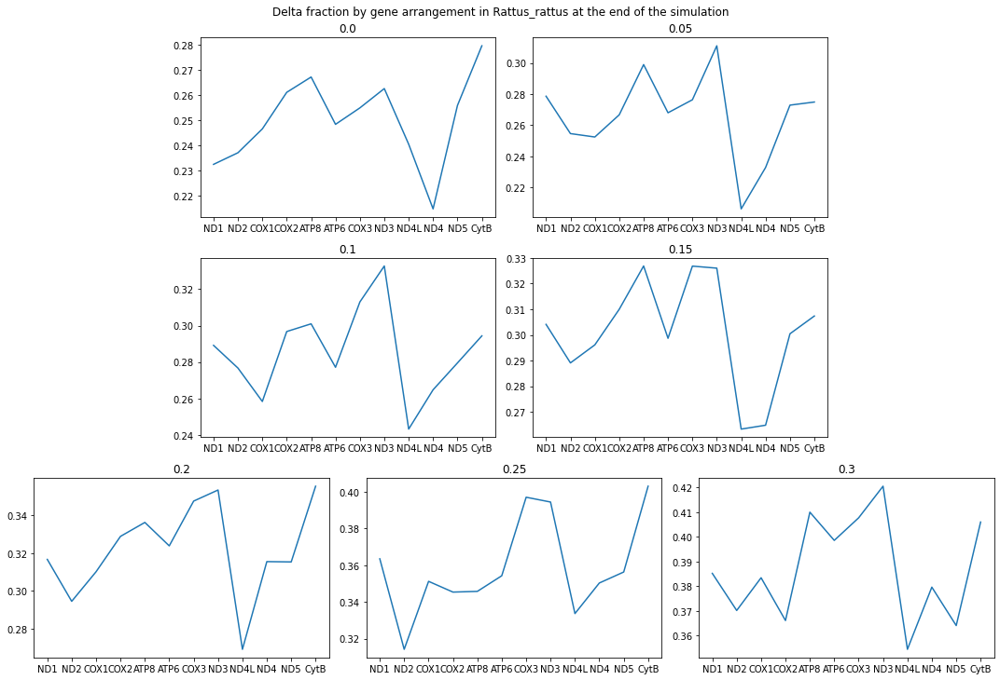

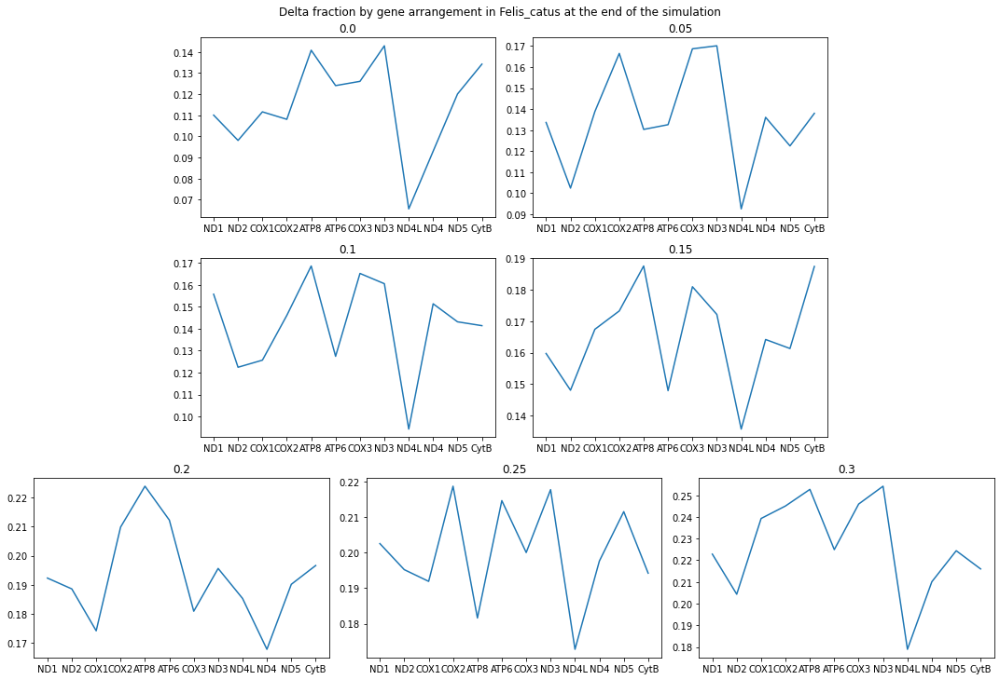

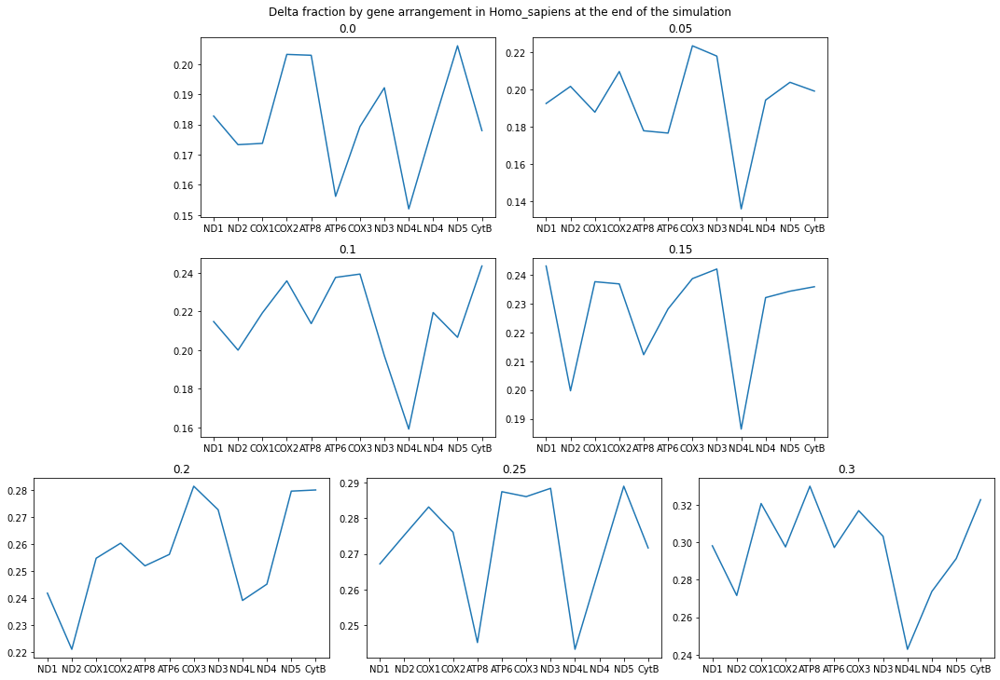

In [56]:
# Delta fraction by gene arrangement in {species} at the end of the simulation
for species in short_species_list:
    # Create figure
    fig = plt.figure(figsize=(15, 10), facecolor='white')  # You can adjust the size as needed
    shape = (3, 6)
    # First row
    ax1 = plt.subplot2grid(shape, (0, 1), colspan=2)
    ax2 = plt.subplot2grid(shape, (0, 3), colspan=2)# Second row
    ax3 = plt.subplot2grid(shape, (1, 1), colspan=2)
    ax4 = plt.subplot2grid(shape, (1, 3), colspan=2)# Third row, span the first subplot across two columns
    ax5 = plt.subplot2grid(shape, (2, 0), colspan=2)
    ax6 = plt.subplot2grid(shape, (2, 2), colspan=2)
    ax7 = plt.subplot2grid(shape, (2, 4), colspan=2)

    ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7]
    for i, coefficient in enumerate(coefficients_list):
        ax[i].plot(last_values_delta[species][coefficient])
        ax[i].set_xticks(range(len(GENE_ARRANGEMENT)))
        ax[i].set_xticklabels(GENE_ARRANGEMENT)
        ax[i].set_title(f'{coefficient}')
    plt.tight_layout()
    plt.suptitle(f'Delta fraction by gene arrangement in {species} at the end of the simulation', y=1.01)
    plt.show()

### X2 Generations

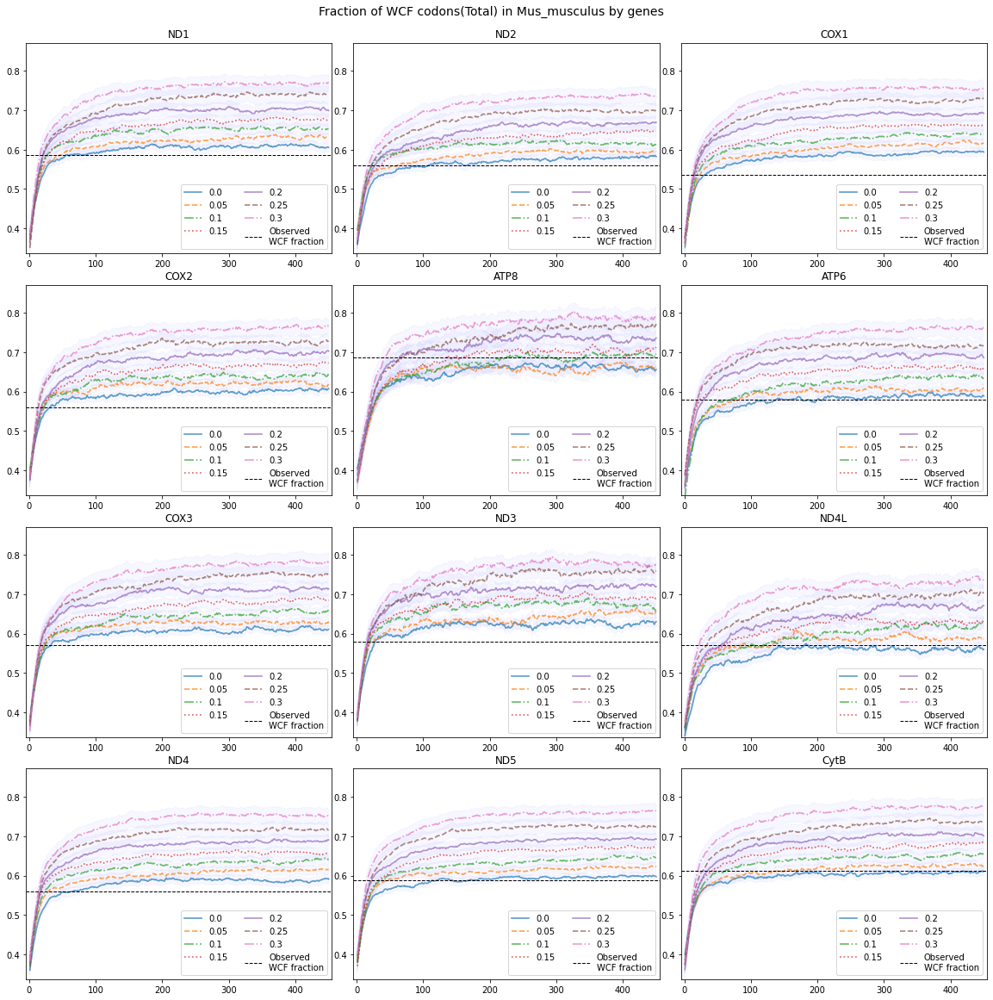

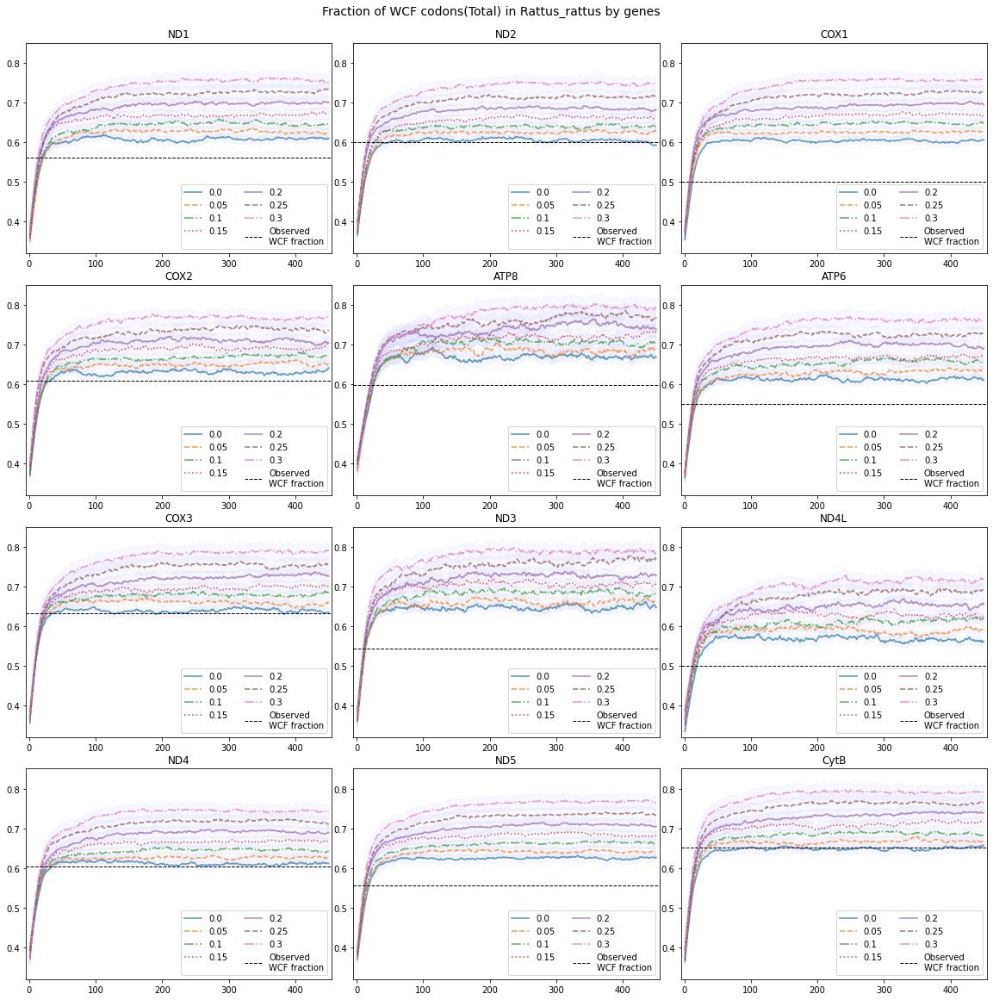

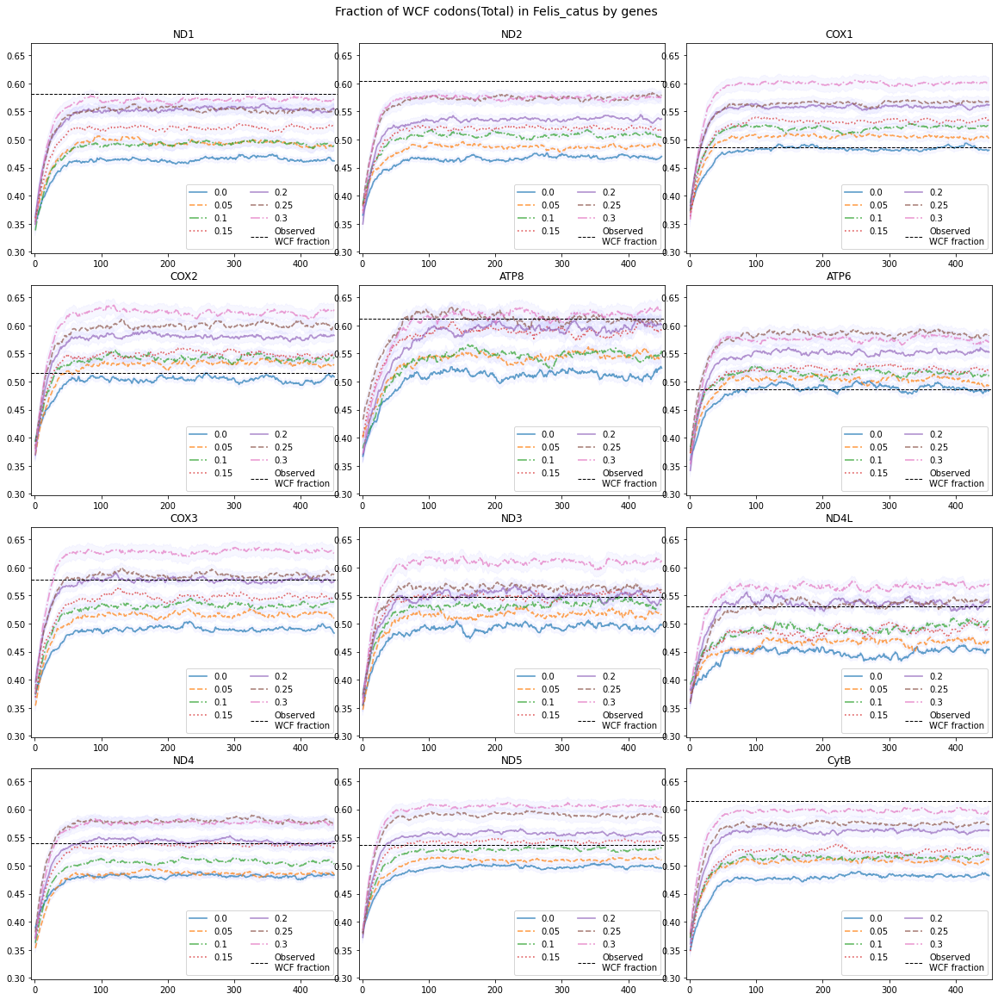

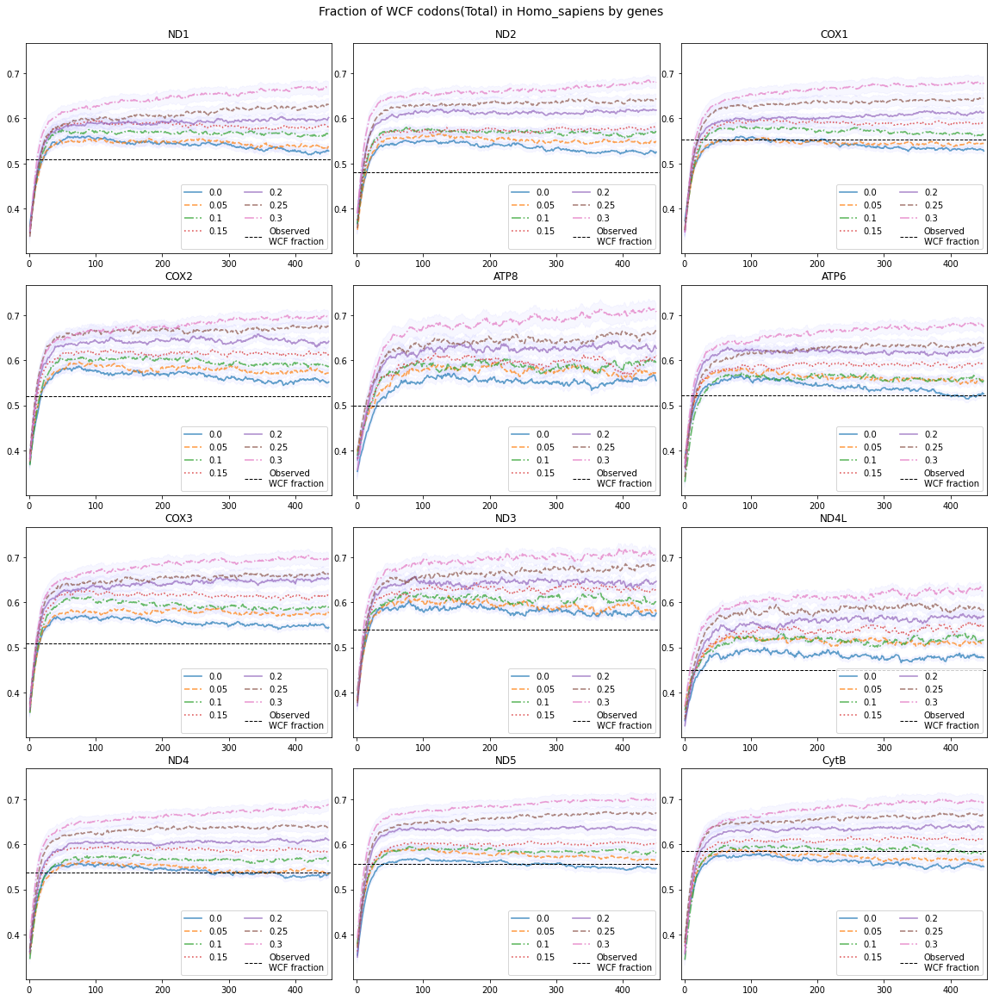

In [39]:
result_folder = f'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(per genes)'
mode = 'Total'
lines = ['-', '--', '-.', ':']*2
for species in short_species_list:
    fig, ax = plt.subplots(4, 3, figsize=(20,20), facecolor='white')
    ax = ax.ravel()
    
    for i_g, gene in enumerate(GENE_ARRANGEMENT):
        for i_c, coefficient in enumerate(coefficients_list):
            genes_sp = CU_genes[CU_genes.Species==species].Gene.unique()
            if gene in genes_sp:
                result_folder = f'C:\Work\Lab\pr-29-trna-or-mutagenesis\local data\Simulation results(per genes)\{coefficient}\{gene}\{species}'
                wcf_share = wcf_share_calculation(f'{result_folder}\FrequenciesMean.csv', mode=mode)
                if i_g == 0:
                    bottom = wcf_share[1] - 0.05
                    top = wcf_share[len(wcf_share)] + 0.1
                ax[i_g].plot(wcf_share, alpha=0.7, label=coefficient, linewidth=1.7, ls=lines[i_c])
                ci = 1.96 * np.std(wcf_share, ddof=1) / np.sqrt(30)
                ax[i_g].fill_between(range(len(wcf_share)), (wcf_share-ci), (wcf_share+ci), color='b', alpha=0.03)
            
        observed_wcf_fraction = observed_wcf_share_calculation(f'{result_folder}\FrequenciesMean.csv')
        ax[i_g].axhline(y=observed_wcf_fraction, c='black', ls='--', lw=1, label='Observed\nWCF fraction')
        ax[i_g].set_title(f'{gene}')
        ax[i_g].set_ylim(bottom, top)
        ax[i_g].set_xlim(-5, len(wcf_share)+5)
        ax[i_g].legend(ncol=2)
    plt.suptitle(f'Fraction of WCF codons({mode}) in {species} by genes', y=0.91, fontsize=14)
    plt.subplots_adjust(wspace=0.07, hspace=0.15)
    plt.show()

## All species wcf fraction

In [15]:
mode = 'Total'
result_folder = 'C:\Work\Lab\Practice\Results_AllGenes_shift'

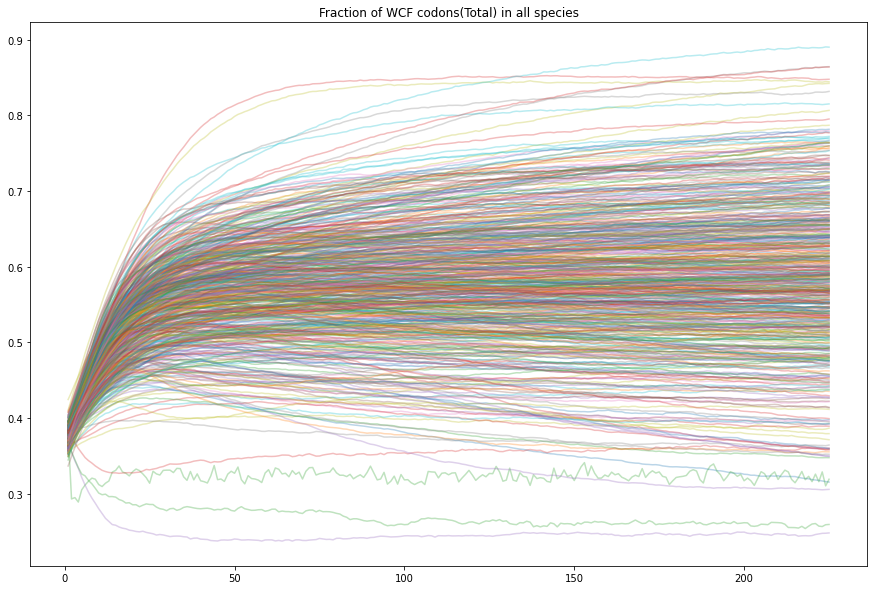

In [17]:
bad_species = []
result_folder = 'C:\Work\Lab\Practice\Results_AllGenes_shift'
plt.figure(figsize=(15, 10), facecolor='white')
for species in species_list:
    wcf_share = wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv', mode=mode)
    if wcf_share[len(wcf_share)] < wcf_share[1]:
        bad_species.append(species)
    plt.plot(wcf_share, alpha=0.3)  # , label=coef, linewidth=1.7, ls=lines[i]
# plt.xlim(-0.01, 50)
# plt.legend()
plt.title(f'Fraction of WCF codons({mode}) in all species')
plt.show()

In [136]:
ms[ms.Species.isin(bad_species)]

,Species,A_T,A_G,A_C,T_A,T_G,T_C,G_A,G_T,G_C,C_A,C_T,C_G
100,Blarinella_quadraticauda,0.000000,0.032438,0.010813,0.000000,0.000000,0.107181,0.360423,0.360423,0.000000,0.000000,0.128722,0.000000
120,Branchiostoma_belcheri,0.089425,0.062066,0.023154,0.039805,0.026501,0.024846,0.129674,0.110863,0.012444,0.054425,0.399915,0.026881
121,Branchiostoma_floridae,0.011838,0.060136,0.007100,0.011545,0.008884,0.110493,0.135704,0.024394,0.010090,0.032893,0.553578,0.033345
122,Branchiostoma_lanceolatum,0.072789,0.026278,0.009339,0.010918,0.007587,0.033962,0.079907,0.090945,0.038456,0.062787,0.521162,0.045869
300,Discogobio_tetrabarbatus,0.020592,0.061775,0.010296,0.000000,0.000000,0.210680,0.324496,0.000000,0.000000,0.000000,0.372162,0.000000
325,Epigonichthys_maldivensis,0.008801,0.155012,0.018293,0.006421,0.000000,0.175807,0.118449,0.010900,0.010978,0.023743,0.432212,0.039385
387,Genetta_servalina,0.015505,0.062019,0.015505,0.146188,0.000000,0.536023,0.000000,0.000000,0.000000,0.044952,0.179808,0.000000
506,Lepus_sinensis,0.026074,0.034268,0.008691,0.007051,0.000000,0.047751,0.585129,0.000000,0.122532,0.027931,0.122885,0.017688
818,Pomatomus_saltatrix,0.000000,0.091791,0.022948,0.000000,0.000000,0.138409,0.565501,0.113100,0.000000,0.000000,0.045500,0.022750
868,Pygathrix_nemaeus,0.000000,0.068780,0.021555,0.000000,0.000000,0.083979,0.692186,0.000000,0.000000,0.000000,0.106800,0.026700


Branchiostoma_belcheri
Branchiostoma_floridae
Branchiostoma_lanceolatum


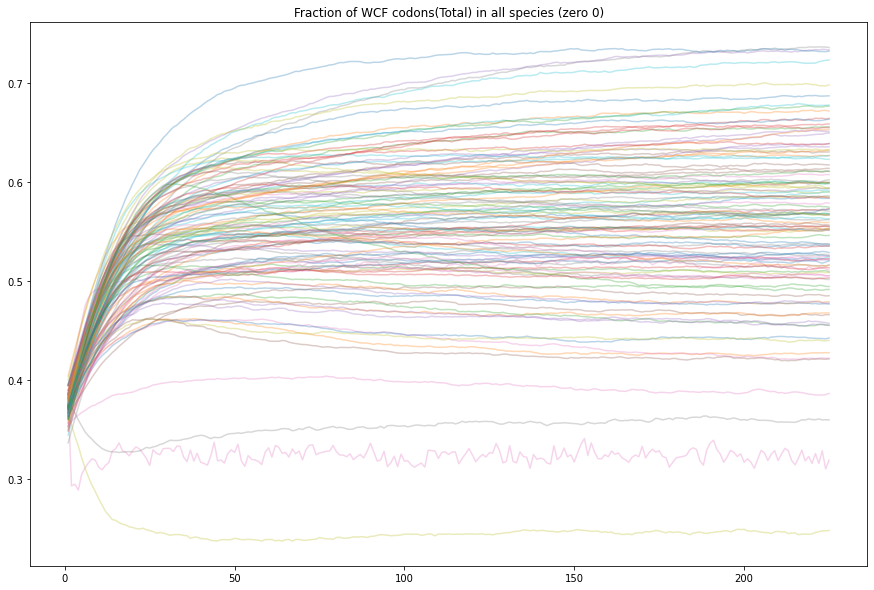

In [95]:
plt.figure(figsize=(15, 10), facecolor='white')
for species in zero_n[0]:
    wcf_share = wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv', mode=mode)
    if wcf_share[len(wcf_share)] < wcf_share[1]:
        print(species)
    plt.plot(wcf_share, alpha=0.3)  # , label=coef, linewidth=1.7, ls=lines[i]
# plt.xlim(-0.01, 50)
# plt.legend()
plt.title(f'Fraction of WCF codons({mode}) in all species (zero 0)', fontsize=14)
plt.show()

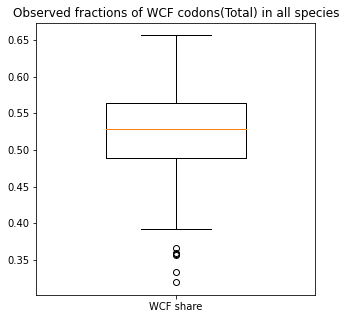

In [17]:
plt.figure(figsize=(5, 5), facecolor='white')

observed_wcf_fractions = {'cold':[],'warm':[]}
for blood in [cold_blood, warm_blood]:
    blood_species = set(blood) & set(species_list)
    for species in blood_species:
        observed_wcf_share = observed_wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv')
        observed_wcf_fractions.append(observed_wcf_share)
plt.boxplot(observed_wcf_fractions, widths=0.5)  # , label=coef, linewidth=1.7, ls=lines[i]
# plt.xlim(-0.01, 50)
# plt.legend()
plt.title(f'Observed fractions of WCF codons({mode}) in all species')
plt.show()

### Ecology

57
40


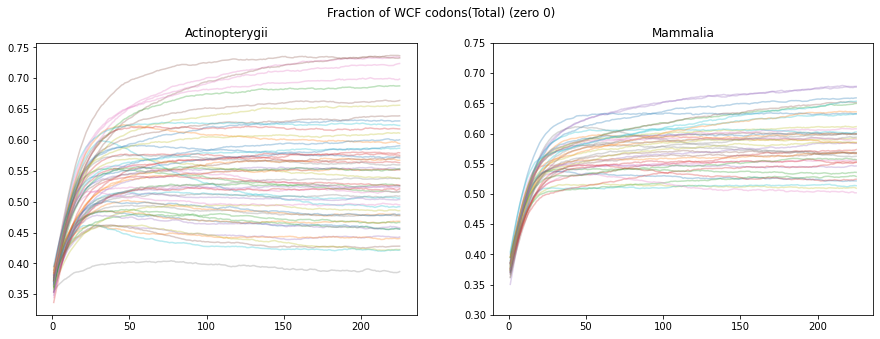

In [102]:
fig, ax = plt.subplots(1,2, figsize=(15,5), facecolor='white')
ax = ax.ravel()
i = 0
for class_ in Class_dict:
    class_species = set(Class_dict[class_]) & set(zero_n[0])
    if len(class_species) >= 10:
        print(len(class_species))
        for species in class_species:
            wcf_share = wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv', mode=mode)
            ax[i].plot(wcf_share, alpha=0.3)  # , label=coef, linewidth=1.7, ls=lines[i]
        ax[i].set_title(f'{class_}')
        i += 1
plt.ylim(0.3, 0.75)
    # plt.legend()
plt.suptitle(f'Fraction of WCF codons({mode}) (zero 0)')
plt.show()

59
43


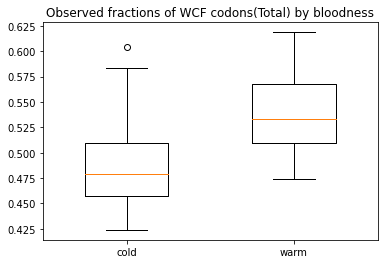

1.1624730817608489e-07

In [113]:
plt.figure(facecolor='white')

observed_wcf_fractions = []
for i, blood in enumerate([cold_blood, warm_blood]):
    observed_wcf_fractions.append([])
    print(len(blood))
    for species in blood:
        observed_wcf_share = observed_wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv')
        observed_wcf_fractions[i].append(observed_wcf_share)
plt.boxplot(observed_wcf_fractions, widths=0.5, labels=['cold', 'warm'])  # , label=coef, linewidth=1.7, ls=lines[i]
plt.title(f'Observed fractions of WCF codons({mode}) by bloodness')
plt.show()
MW(observed_wcf_fractions[0], observed_wcf_fractions[1])[1]

122
122


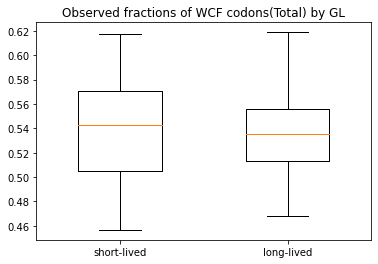

0.4137986958518156

In [112]:
plt.figure(facecolor='white')
observed_wcf_fractions = []
for i in range(2):
    gl_species_df = gl.loc[gl.Scientific_name.isin(species_list)]
    df_half = len(gl_species_df)//2
    gl_species = gl_species_df.iloc[i*df_half:(i+1)*df_half].Scientific_name.values
    print(len(gl_species))
    observed_wcf_fractions.append([])
    for species in gl_species:
        observed_wcf_share = observed_wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv')
        observed_wcf_fractions[i].append(observed_wcf_share)
plt.boxplot(observed_wcf_fractions, widths=0.5, labels=['short-lived', 'long-lived'])  # , label=coef, linewidth=1.7, ls=lines[i]
plt.title(f'Observed fractions of WCF codons({mode}) by GL')
plt.show()
MW(observed_wcf_fractions[0], observed_wcf_fractions[1])[1]

46
46


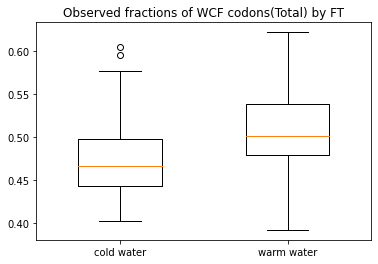

0.0007966770273934087

In [114]:
plt.figure(facecolor='white')
observed_wcf_fractions = []
for i in range(2):
    ft_species_df = ft.loc[ft.index.isin(species_list)]
    df_half = len(ft_species_df)//2
    ft_species = ft_species_df.iloc[i*df_half:(i+1)*df_half].index
    print(len(ft_species))
    observed_wcf_fractions.append([])
    for species in ft_species:
        observed_wcf_share = observed_wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv')
        observed_wcf_fractions[i].append(observed_wcf_share)
plt.boxplot(observed_wcf_fractions, widths=0.5, labels=['cold water', 'warm water'])  # , label=coef, linewidth=1.7, ls=lines[i]
plt.title(f'Observed fractions of WCF codons({mode}) by FT')
plt.show()
MW(observed_wcf_fractions[0], observed_wcf_fractions[1])[1]

In [79]:
mode = 'Total'
result_folder = 'C:\Work\Lab\Practice\Results_AllGenes_shift'
exp_obs_wcf_ratio = {}
for species in zero_n[0]:
    wcf_shares = wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv', mode=mode)
    wcf_share = wcf_shares[1]
    obs_wcf_share = observed_wcf_share_calculation(f'{result_folder}\\{species}\FrequenciesMean.csv')
    exp_obs_wcf_ratio[species] = obs_wcf_share / wcf_share

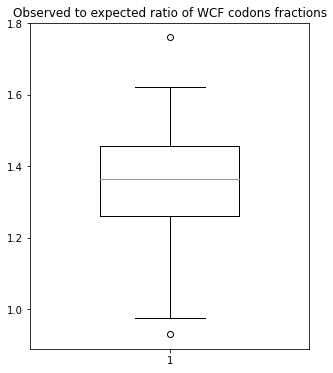

In [82]:
plt.figure(figsize=(5,6), facecolor='white')
plt.boxplot(exp_obs_wcf_ratio.values(), widths=0.5)
plt.title('Observed to expected ratio of WCF codons fractions')
# plt.ylabel('Ratio')
plt.show()